#Load libraries

In [ ]:
import csv
import pandas as pd
import numpy as np
from google.colab import files
import io
import os
from google.colab import drive
import matplotlib.pyplot as plt
import seaborn as sn
from sklearn import preprocessing
from statistics import mean
from sys import prefix


In [ ]:
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Input, Conv2D, MaxPooling2D, Embedding, LSTM, Lambda
from keras import backend as K
from keras import optimizers
from keras.losses import mse, binary_crossentropy
from keras.optimizers import RMSprop, Adam, Nadam
from keras.preprocessing import sequence
from keras.callbacks import TensorBoard
from keras import regularizers

import sklearn
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_auc_score, classification_report

In [ ]:
!pip install shap
import shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 8.1 MB/s eta 0:00:00


In [ ]:
!pip install lime
import lime
from lime import lime_tabular
from __future__ import print_function

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=00f285c41df502bedca6d7f00ff892cf87d71faf3f4c6cc0023b871f653f751c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


#Define functions for later use

In [ ]:
def threshold_optimizer(distances, anom_list):
  d = {'distance': distances, 'anom': anom_list}
  df = pd.DataFrame(data=d)
  threshold = None
  prev_correct = df[(df['distance'] <= 0) & (df['anom'] == 0)].shape[0] + df[(df['distance'] > 0) & (df['anom'] == 1)].shape[0]
  # prev_incorrect = df.shape[0] - prev_correct
  for i in np.arange (0.005, 10, 0.001):
    tp = df[(df['distance'] < i) & (df['anom'] == 0)].shape[0]
    tn = df[(df['distance'] > i) & (df['anom'] == 1)].shape[0]
    correct = tp + tn

    if correct < prev_correct:
      threshold = i - 0.001
      return threshold
    else:
      prev_correct = correct

  return threshold, correct, tp, tn

In [ ]:
class visualization:
  labels = ["Normal", "Anomaly"]

  def draw_confusion_matrix(self, y , pred):
    matrix = confusion_matrix(y, pred)
    plt.figure(figsize=(10,8))
    colors = ['orange', 'green']
    sn.heatmap(matrix, xticklabels=self.labels, yticklabels=self.labels, cmap = colors, annot=True, fmt="d")
    plt.title("Confusion matrix")
    plt.ylabel("Actual")
    plt.xlabel('Predicted')
    plt.show()

  def draw_anomaly(self, y, error, threshold):
    groupsDF = pd.DataFrame({'error':error, 'true':y}).groupby('true')
    figure, axes = plt.subplots(figsize=(12,8))
    for name, group, in groupsDF:
      axes.plot(group.index,group.error, marker='x' if name == 1 else 'o' ,
                linestyle = '', color ='r' if name == 1 else 'g', label = "Anomaly" if name == 1 else 'Normal', alpha = 0.5)
    axes.hlines(threshold, axes.get_xlim()[0], axes.get_xlim()[1], colors = 'b', zorder = 100, label = "Threshold")
    axes.legend()
    plt.title("Anomalies", fontsize = 18)
    plt.ylabel("Error", fontsize = 15)
    plt.xlabel("Data", fontsize = 15)
    plt.show()

  def draw_error(self, error, threshold):
    plt.plot(error, marker='o', ms = 3.5, linestyle = '', label = "Point")
    plt.hlines(threshold, xmin = 0, xmax = len(error)-1, colors = 'b', zorder = 100, label = 'Threshold')
    plt.legend()
    plt.title("Reconstruction error")
    plt.ylabel("Error")
    plt.xlabel("Data")
    plt.show()

#Reference: Alla, S., & Adari, S. K. (2019). Beginning anomaly detection using python-based deep learning.

In [ ]:
viz = visualization()

In [ ]:
def get_predict_fn(idx):
  def predict_fn(x):
    return autoencoder.predict(x)[:, idx]
  return predict_fn

In [ ]:
def recall(Y_test, y_label):
  return confusion_matrix(Y_test, y_label)[0][0]/(confusion_matrix(Y_test, y_label)[0][0] + confusion_matrix(Y_test, y_label)[0][1])


def precision(Y_test, y_label):
  return confusion_matrix(Y_test, y_label)[0][0]/(confusion_matrix(Y_test, y_label)[0][0] + confusion_matrix(Y_test, y_label)[1][0])

def f1_score(Y_test, y_label):
  return (2 * confusion_matrix(Y_test, y_label)[0][0])/((2 * confusion_matrix(Y_test, y_label)[0][0]) + confusion_matrix(Y_test, y_label)[1][0] + confusion_matrix(Y_test, y_label)[0][1])

In [ ]:
def predicting_function(X_test):
  return np.linalg.norm(X_test - autoencoder.predict(X_test), axis = 1)

In [ ]:
def predicting_function_vae(X_test):
  return np.linalg.norm(X_test - vae.predict(X_test), axis = 1)

In [ ]:
def sampling(args):
  z_mean, z_log_var = args
  batch = K.shape(z_mean)[0]
  dim = K.int_shape(z_mean)[1]
  epsilon = K.random_normal(shape=(batch, dim))
  return z_mean + K.exp(0.5*z_log_var)*epsilon

#Load data

In [ ]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
col_names_df = pd.read_csv('/content/drive/MyDrive/NUSW-NB15_features.csv', encoding='ISO-8859-1')
col_names = col_names_df["Name"].tolist()

df_original = pd.read_csv('/content/drive/MyDrive/UNSW-NB15_1.csv', names = col_names)

<ipython-input-12-bc8c9c0245fe>:4: DtypeWarning: Columns (1,3,47) have mixed types. Specify dtype option on import or set low_memory=False.
  df_original = pd.read_csv('/content/drive/MyDrive/UNSW-NB15_1.csv', names = col_names)


In [ ]:
# df_original

In [ ]:
df_clean = df_original.copy()

#Pre-processing

In [ ]:
#get cols
nominal_cols = [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "nominal"] + [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "Nominal"]
binary_cols = [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "binary"] + [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "Binary"]
integer_cols = [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "integer"] + [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "Integer"]
float_cols = [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "Float"] + [col_names_df.loc[row, 'Name'] for row in range(len(col_names)) if col_names_df.loc[row, 'Type '] == "float"]

##Transform incorrect values

In [ ]:
# Transform hexadecimal to numbers
for i in ["sport", "dsport"]:
  wrong = df_original.loc[~df_original[i].astype(str).str.isdigit(), i].tolist()
  unique_wrong = np.unique(wrong)
  unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == '-'))
  df_clean = df_clean.drop(df_clean[df_clean[i] == '-'].index)
  for change in unique_wrong:
    df_clean[i] = np.where(df_clean[i] == change, int(change, 16), df_clean[i])


# Transform to numeric
df_clean['dsport'] = pd.to_numeric(df_clean['dsport'])
df_clean['sport'] = pd.to_numeric(df_clean['sport'])

##Remove duplicates

In [ ]:
# Remove duplicates
print("Duplicates: ", df_clean.duplicated().sum())

df_clean = df_clean.drop_duplicates()
df_clean.duplicated().sum()

Duplicates:  59213


0

#Exploratory data analysis

##Correlation

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


Text(0.5, 1.0, 'Correlation')

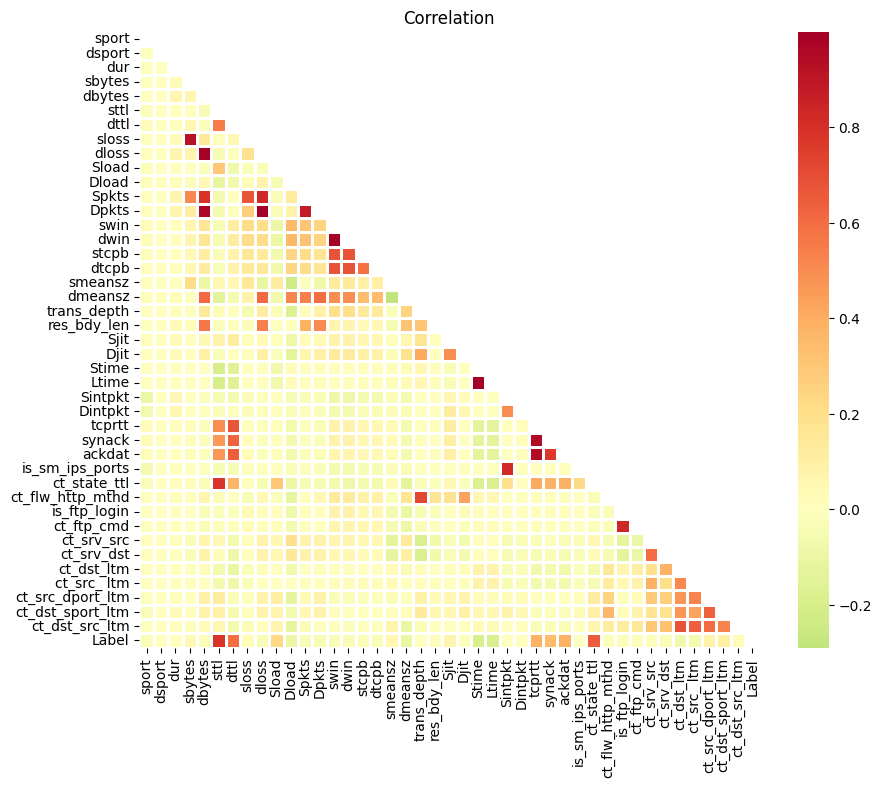

In [ ]:
#correlation
cm = df_clean.corr()

mask=np.triu(np.ones_like(cm,dtype=bool))
plt.figure(figsize=(10,8))

sn.heatmap(cm,  cmap='RdYlGn_r', center=0, linewidths=1, fmt=".2f",mask=mask)
plt.title('Correlation')
# plt.show()
# plt.savefig("correlation.png")
# files.download("correlation.png")
# cm['Label'].sort_values(ascending=False)

##Proportion of attacks

In [ ]:
#proportion of attacks

print(df_clean['Label'].sum()/df_clean.shape[0]*100) #2.22%
df_original['Label'].sum()/df_original.shape[0]*100 # 3.17%

2.228225331978732


3.173566894904436

#Feature engineering

##Duration feature

In [ ]:
df_clean['duration'] = df_clean['Ltime'] - df_clean['Stime']
df_clean = df_clean.drop(df_clean[df_clean['duration'] < 0].index)

##One-hot encoding

In [ ]:
#onehot enconding
sep = ""
for col in ["proto", "state", "service", "srcip", "dstip"]:
    new = df_clean[col].str.get_dummies().add_prefix(sep.join([col, "_"]))
    df_clean = pd.concat([df_clean, new], axis=1)

##Normalisation

In [ ]:
#normalisation
num_cols = integer_cols + float_cols + ['duration']

scaler = MinMaxScaler()
df_clean[num_cols] = scaler.fit_transform(df_clean[num_cols])

In [ ]:
# fig, axes = plt.subplots(nrows=7, ncols=4, figsize=(14, 10))
# axes = axes.flatten()

# counter = 0
# for i in integer_cols:
#   axes[counter].hist(df_clean[i], bins = 10)
#   axes[counter].set_title(f'{i}')
#   counter += 1

# fig.tight_layout()

# # Display the plot
# plt.show()

##Remove unneeded columns

In [ ]:
df_clean = df_clean.drop(labels=["Ltime", "Stime"], axis = 1)
df_clean = df_clean.drop(labels=["attack_cat"], axis = 1)
df_clean = df_clean.drop(labels = ["proto", "state", "service"], axis = 1)
df_clean = df_clean.drop(labels = ["srcip", "dstip"], axis = 1)

#Feature selection

In [ ]:
cm_new = df_clean.corr()
corr_pairs = cm_new.unstack()
corr_label = corr_pairs['Label']
sorted_pairs = corr_label.sort_values(kind="quicksort")
high_pairs = sorted_pairs[abs(sorted_pairs) > 0.1]
high_corr = high_pairs.index.to_list()[:-1]

# print(len(cm_new['Label'][abs(cm_new['Label']) > 0.1]))
# (cm_new['Label'][abs(cm_new['Label']) > 0.1])

# high_corr = ["sttl","dttl","Sload","Dload","dmeansz","tcprtt","synack","ackdat",
#              "ct_state_ttl","ct_dst_sport_ltm","proto_unas","state_INT","service_pop3",
#              "srcip_175.45.176.0","srcip_175.45.176.1","srcip_175.45.176.2","srcip_175.45.176.3",
#              "dstip_149.171.126.10","dstip_149.171.126.11","dstip_149.171.126.12",
#              "dstip_149.171.126.13","dstip_149.171.126.14","dstip_149.171.126.15",
#              "dstip_149.171.126.16","dstip_149.171.126.17","dstip_149.171.126.18",
#              "dstip_149.171.126.19"]

In [ ]:
del df_original

#Autoencoder

##Subset of data for CV

In [ ]:
df_small = df_clean[:400000]
print(df_small['Label'].value_counts())
batch_size = 32
epochs = 10

0    185722
1     14278
Name: Label, dtype: int64


##Cross validation for activation function

In [ ]:
cvs = [1,2,3,4,5]
encoding_dim = 10
batch_size = 32
epochs = 8

rec_relu = []
prec_relu = []
auc_relu = []
f1_relu = []

#relu
for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  #Model
  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoded = Dense(encoding_dim, activation='relu')(inputArray)
  encoded = Dense(5, activation = 'relu')(encoded)
  decoded = Dense(encoding_dim, activation='relu')(encoded)
  decoded = Dense(input_dim, activation='relu')(decoded)

  autoencoder = Model(inputArray, decoded)

  autoencoder.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])

  history = autoencoder.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  #Threshold selection
  y_pred_val = autoencoder.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)
  print("Threshold in iteration ", i, ": ", threshold)

  #Evaluation
  score = autoencoder.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score[0])
  print("Test MAE:", score[1])
  print("Test accuracy:", score[2])

  y_pred = autoencoder.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("AUC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))
  print()
  print()
  rec_relu.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_relu.append(sklearn.metrics.precision_score(Y_test, y_label))
  auc_relu.append(roc_auc_score(Y_test, y_label))
  f1_relu.append(sklearn.metrics.f1_score(Y_test, y_label))

print("Recall", rec_relu)
print("Precision", prec_relu)
print("F1", f1_relu)
print("AUC", auc_relu)

Epoch 1/8
7715/7715 [==============================] - 30s 4ms/step - loss: 0.0021 - mae: 0.0075 - accuracy: 0.9561 - val_loss: 0.0056 - val_mae: 0.0108 - val_accuracy: 0.9267
Epoch 2/8
7715/7715 [==============================] - 21s 3ms/step - loss: 0.0019 - mae: 0.0070 - accuracy: 0.9636 - val_loss: 0.0055 - val_mae: 0.0107 - val_accuracy: 0.9322
Epoch 3/8
7715/7715 [==============================] - 23s 3ms/step - loss: 0.0019 - mae: 0.0069 - accuracy: 0.9653 - val_loss: 0.0056 - val_mae: 0.0109 - val_accuracy: 0.9264
Epoch 4/8
7715/7715 [==============================] - 22s 3ms/step - loss: 0.0019 - mae: 0.0068 - accuracy: 0.9668 - val_loss: 0.0055 - val_mae: 0.0108 - val_accuracy: 0.9283
Epoch 5/8
7715/7715 [==============================] - 19s 2ms/step - loss: 0.0019 - mae: 0.0068 - accuracy: 0.9678 - val_loss: 0.0055 - val_mae: 0.0106 - val_accuracy: 0.9340
Epoch 6/8
7715/7715 [==============================] - 21s 3ms/step - loss: 0.0019 - mae: 0.0068 - accuracy: 0.9682 - va

In [ ]:
rec_relu_s = mean([0.9996524157108099, 0.9996571820363387, 1.0, 0.999649982499125, 1.0])
prec_relu_s = mean([0.7636749867233139, 0.7401015228426396, 0.6728153101222043, 0.635938543754175, 0.7412622579834046])
f1_relu_s = mean([0.8658738521752222, 0.8505177191191483, 0.8044107512060648, 0.7773543821448013, 0.8514079422382671])
auc_relu_s = mean([0.9940562040951778, 0.9931864001330195, 0.9907955164629875, 0.9892277886517895, 0.9933226911695998])



In [ ]:
#softmax

rec_soft = []
prec_soft = []
auc_soft = []
f1_soft = []

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  #Model
  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoded = Dense(encoding_dim, activation='softmax')(inputArray)
  encoded = Dense(5, activation = 'softmax')(encoded)
  decoded = Dense(encoding_dim, activation='softmax')(encoded)
  decoded = Dense(input_dim, activation='softmax')(decoded)

  autoencoder = Model(inputArray, decoded)

  autoencoder.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])

  history = autoencoder.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  #Threshold selection
  y_pred_val = autoencoder.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)
  print("Threshold in iteration ", i, ": ", threshold)

  #Evaluation
  score = autoencoder.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score[0])
  print("Test MAE:", score[1])
  print("Test accuracy:", score[2])

  y_pred = autoencoder.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("AUC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))
  print()
  print()
  rec_soft.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_soft.append(sklearn.metrics.precision_score(Y_test, y_label))
  auc_soft.append(roc_auc_score(Y_test, y_label))
  f1_soft.append(sklearn.metrics.f1_score(Y_test, y_label))

print("Recall", rec_soft)
print("Precision", prec_soft)
print("F1", f1_soft)
print("AUC", auc_soft)

Epoch 1/8
7715/7715 [==============================] - 29s 4ms/step - loss: 0.0031 - mae: 0.0253 - accuracy: 0.7543 - val_loss: 0.0065 - val_mae: 0.0273 - val_accuracy: 0.8868
Epoch 2/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0021 - mae: 0.0220 - accuracy: 0.9343 - val_loss: 0.0055 - val_mae: 0.0256 - val_accuracy: 0.9113
Epoch 3/8
7715/7715 [==============================] - 24s 3ms/step - loss: 0.0019 - mae: 0.0214 - accuracy: 0.9406 - val_loss: 0.0054 - val_mae: 0.0254 - val_accuracy: 0.9060
Epoch 4/8
7715/7715 [==============================] - 27s 4ms/step - loss: 0.0018 - mae: 0.0213 - accuracy: 0.9429 - val_loss: 0.0053 - val_mae: 0.0250 - val_accuracy: 0.9162
Epoch 5/8
7715/7715 [==============================] - 28s 4ms/step - loss: 0.0018 - mae: 0.0211 - accuracy: 0.9304 - val_loss: 0.0053 - val_mae: 0.0249 - val_accuracy: 0.9134
Epoch 6/8
7715/7715 [==============================] - 29s 4ms/step - loss: 0.0018 - mae: 0.0211 - accuracy: 0.9230 - va

In [ ]:
rec_soft_s = mean([0.9996524157108099, 0.9996571820363387, 0.9996572995202193, 0.999649982499125, 0.9996607869742198])
prec_soft_s = mean([0.7376250320595025, 0.7330316742081447, 0.7437531871494135, 0.750788643533123, 0.74702154626109])
f1_soft_s = mean([0.8488783943329399, 0.8458303118201596, 0.8529239766081871, 0.85752889956463, 0.8550703612360365])
auc_soft_s = mean([0.99319394510629, 0.992939912580641, 0.9933096180795616, 0.9936805581836978, 0.9933542475077711])

In [ ]:
#relu + softmax

rec_rs = []
prec_rs = []
auc_rs = []
f1_rs = []

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  #Model
  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoded = Dense(encoding_dim, activation='relu')(inputArray)
  encoded = Dense(5, activation = 'relu')(encoded)
  decoded = Dense(encoding_dim, activation='relu')(encoded)
  decoded = Dense(input_dim, activation='softmax')(decoded)

  autoencoder = Model(inputArray, decoded)

  autoencoder.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])

  history = autoencoder.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  #Threshold selection
  y_pred_val = autoencoder.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)
  print("Threshold in iteration ", i, ": ", threshold)

  #Evaluation
  score = autoencoder.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score[0])
  print("Test MAE:", score[1])
  print("Test accuracy:", score[2])

  y_pred = autoencoder.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("AUC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))
  print()
  print()
  rec_rs.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_rs.append(sklearn.metrics.precision_score(Y_test, y_label))
  auc_rs.append(roc_auc_score(Y_test, y_label))
  f1_rs.append(sklearn.metrics.f1_score(Y_test, y_label))

print("Recall", rec_rs)
print("Precision", prec_rs)
print("F1", f1_rs)
print("AUC", auc_rs)

Epoch 1/8
7715/7715 [==============================] - 23s 3ms/step - loss: 0.0020 - mae: 0.0217 - accuracy: 0.8753 - val_loss: 0.0050 - val_mae: 0.0241 - val_accuracy: 0.9018
Epoch 2/8
7715/7715 [==============================] - 24s 3ms/step - loss: 0.0017 - mae: 0.0205 - accuracy: 0.9629 - val_loss: 0.0049 - val_mae: 0.0241 - val_accuracy: 0.9550
Epoch 3/8
7715/7715 [==============================] - 24s 3ms/step - loss: 0.0017 - mae: 0.0205 - accuracy: 0.9732 - val_loss: 0.0049 - val_mae: 0.0240 - val_accuracy: 0.9384
Epoch 4/8
7715/7715 [==============================] - 22s 3ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9737 - val_loss: 0.0049 - val_mae: 0.0240 - val_accuracy: 0.9425
Epoch 5/8
7715/7715 [==============================] - 22s 3ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9732 - val_loss: 0.0049 - val_mae: 0.0240 - val_accuracy: 0.9434
Epoch 6/8
7715/7715 [==============================] - 21s 3ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9708 - va

In [ ]:
rec_rs_s = mean([1.0, 1.0, 0.9996572995202193, 1.0, 0.9996607869742198])
prec_rs_s = mean([0.737503204306588, 0.7329145728643216, 0.7452733776188043, 0.7365300335137922, 0.7438162544169611])
auc_rs_s = mean([0.9933612541005926, 0.9931048350479353, 0.9933615108690586, 0.993375938192707, 0.9932439323958988])
f1_rs_s = mean([0.8489229861316022, 0.8458750181238219, 0.8539227166276346, 0.8482779097387173, 0.8529667149059335])

In [ ]:
#sigmoid

rec_sig = []
prec_sig = []
auc_sig = []
f1_sig = []

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  #Model
  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoded = Dense(encoding_dim, activation='sigmoid')(inputArray)
  encoded = Dense(5, activation = 'sigmoid')(encoded)
  decoded = Dense(encoding_dim, activation='sigmoid')(encoded)
  decoded = Dense(input_dim, activation='sigmoid')(decoded)

  autoencoder = Model(inputArray, decoded)

  autoencoder.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])

  history = autoencoder.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  #Threshold selection
  y_pred_val = autoencoder.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)
  print("Threshold in iteration ", i, ": ", threshold)

  #Evaluation
  score = autoencoder.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score[0])
  print("Test MAE:", score[1])
  print("Test accuracy:", score[2])

  y_pred = autoencoder.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("AUC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))
  print()
  print()
  rec_sig.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_sig.append(sklearn.metrics.precision_score(Y_test, y_label))
  auc_sig.append(roc_auc_score(Y_test, y_label))
  f1_sig.append(sklearn.metrics.f1_score(Y_test, y_label))

print("Recall", rec_sig)
print("Precision", prec_sig)
print("F1", f1_sig)
print("AUC", auc_sig)

Epoch 1/8
7715/7715 [==============================] - 15s 2ms/step - loss: 0.0058 - mae: 0.0184 - accuracy: 0.7426 - val_loss: 0.0049 - val_mae: 0.0096 - val_accuracy: 0.9153
Epoch 2/8
7715/7715 [==============================] - 15s 2ms/step - loss: 0.0015 - mae: 0.0045 - accuracy: 0.9598 - val_loss: 0.0047 - val_mae: 0.0090 - val_accuracy: 0.9421
Epoch 3/8
7715/7715 [==============================] - 14s 2ms/step - loss: 0.0012 - mae: 0.0039 - accuracy: 0.9715 - val_loss: 0.0038 - val_mae: 0.0075 - val_accuracy: 0.9430
Epoch 4/8
7715/7715 [==============================] - 14s 2ms/step - loss: 8.8980e-04 - mae: 0.0033 - accuracy: 0.9659 - val_loss: 0.0034 - val_mae: 0.0074 - val_accuracy: 0.9363
Epoch 5/8
7715/7715 [==============================] - 14s 2ms/step - loss: 7.9060e-04 - mae: 0.0030 - accuracy: 0.9679 - val_loss: 0.0032 - val_mae: 0.0068 - val_accuracy: 0.9371
Epoch 6/8
7715/7715 [==============================] - 14s 2ms/step - loss: 7.3510e-04 - mae: 0.0027 - accuracy:

In [ ]:
rec_sig_s = mean([0.9982620785540494, 1.0, 0.9993145990404386, 0.9943997199859993, 0.9979647218453188])
prec_sig_s = mean([0.7392535392535392, 0.7259830761572922, 0.7361777328957334, 0.7622752884357392, 0.7645530145530145])
auc_sig_s = mean([0.9925636080308337, 0.9928583474955567, 0.9928788038921867, 0.9914572780348181, 0.9931032143722777])
f1_sig_s = mean([0.8494528246081041, 0.841240086517664, 0.8477976450065416, 0.8630012150668287, 0.8658034137728076])

In [ ]:
#TanH

rec_t = []
prec_t = []
auc_t = []
f1_t = []


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  #Model
  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoded = Dense(encoding_dim, activation='tanh')(inputArray)
  encoded = Dense(5, activation = 'tanh')(encoded)
  decoded = Dense(encoding_dim, activation='tanh')(encoded)
  decoded = Dense(input_dim, activation='tanh')(decoded)

  autoencoder = Model(inputArray, decoded)

  autoencoder.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])

  history = autoencoder.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  #Threshold selection
  y_pred_val = autoencoder.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)
  print("Threshold in iteration ", i, ": ", threshold)

  #Evaluation
  score = autoencoder.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score[0])
  print("Test MAE:", score[1])
  print("Test accuracy:", score[2])

  y_pred = autoencoder.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("AUC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))
  print()
  print()
  rec_t.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_t.append(sklearn.metrics.precision_score(Y_test, y_label))
  auc_t.append(roc_auc_score(Y_test, y_label))
  f1_t.append(sklearn.metrics.f1_score(Y_test, y_label))

print("Recall", rec_t)
print("Precision", prec_t)
print("F1", f1_t)
print("AUC", auc_t)

Epoch 1/8
7715/7715 [==============================] - 15s 2ms/step - loss: 9.0831e-04 - mae: 0.0053 - accuracy: 0.8907 - val_loss: 0.0026 - val_mae: 0.0086 - val_accuracy: 0.9386
Epoch 2/8
7715/7715 [==============================] - 14s 2ms/step - loss: 5.7197e-04 - mae: 0.0048 - accuracy: 0.8897 - val_loss: 0.0025 - val_mae: 0.0090 - val_accuracy: 0.9467
Epoch 3/8
7715/7715 [==============================] - 15s 2ms/step - loss: 4.9430e-04 - mae: 0.0051 - accuracy: 0.8694 - val_loss: 0.0025 - val_mae: 0.0093 - val_accuracy: 0.9226
Epoch 4/8
7715/7715 [==============================] - 14s 2ms/step - loss: 4.4803e-04 - mae: 0.0052 - accuracy: 0.8343 - val_loss: 0.0025 - val_mae: 0.0094 - val_accuracy: 0.9502
Epoch 5/8
7715/7715 [==============================] - 13s 2ms/step - loss: 4.1323e-04 - mae: 0.0052 - accuracy: 0.8485 - val_loss: 0.0024 - val_mae: 0.0090 - val_accuracy: 0.9467
Epoch 6/8
7715/7715 [==============================] - 14s 2ms/step - loss: 3.8775e-04 - mae: 0.0052

In [ ]:
rec_t_s = mean([0.9947862356621481, 0.9945149125814192, 0.9938313913639479, 0.9943997199859993, 0.9925373134328358])
prec_t_s = mean([0.7212701612903226, 0.7434648898001025, 0.7257257257257257, 0.7174242424242424, 0.79532481652623])
auc_t_s = mean([0.9902227536076906, 0.9907644552398942, 0.9898063835208987, 0.989947095646267, 0.9913823461728888])
f1_t_s = mean([0.8362308254200147, 0.8508578970523536, 0.8388776395718832, 0.8335044741088455, 0.8830541723253357])

###Summary

In [ ]:
print("Recall")
print("relu", rec_relu_s)
print("relu + soft", rec_rs_s)
print("soft", rec_soft_s)
print("sigm", rec_sig_s)
print("tanh", rec_t_s)
print("Precision")
print("relu", prec_relu_s)
print("relu + soft", prec_rs_s)
print("soft", prec_soft_s)
print("sigm", prec_sig_s)
print("tanh", prec_t_s)
print("F1")
print("relu", f1_relu_s)
print("relu + soft", f1_rs_s)
print("soft", f1_soft_s)
print("sigm", f1_sig_s)
print("tanh", f1_t_s)
print("AUC")
print("relu", auc_relu_s)
print("relu + soft", auc_rs_s)
print("soft", auc_soft_s)
print("sigm", auc_sig_s)
print("tanh", auc_t_s)

Recall
relu 0.9997919160492547
relu + soft 0.9998636172988878
soft 0.9996555333481425
sigm 0.9979882238851612
tanh 0.9940139146052701
Precision
relu 0.7107585242851475
relu + soft 0.7392074885440935
soft 0.7424440166422548
sigm 0.7456485302590637
tanh 0.7406419671533246
F1
relu 0.8299129293767007
relu + soft 0.849993069105542
soft 0.8520463887123906
sigm 0.8534590369943892
tanh 0.8485050016956865
AUC
relu 0.9921177201025149
relu + soft 0.9932894941212385
soft 0.9932956562915923
sigm 0.9925722503651345
tanh 0.9904246068375279


In [ ]:
# #relu
# loss_relu = (0.0035566219594329596 + 0.0027472905348986387 + 0.004512447398155928 + 0.0038151165936142206 + 0.0034393619280308485)/5
# mae_relu = (0.004622385371476412 + 0.004456104710698128 + 0.009930016472935677 + 0.005485548172146082 + 0.004375586286187172)/5
# accuracy_relu = (0.9361500144004822 + 0.967674970626831 + 0.9523000121116638 + 0.9323624968528748 + 0.9388499855995178)/5
# roc_relu = (0.9852974680501588 + 0.9912647418495523 + 0.9935663833530207 + 0.9835886379699382 + 0.9933291802938276)/5
# prec_relu = (0.999986645834168 + 0.9998553354901497 + 0.9999737343226739 + 0.999589289736218 + 1.0)/5
# recall_relu  = (0.9709425203895077 + 0.9863004812993786 + 0.9878181676656028 + 0.9780278184670028 + 0.9866583605876551)/5
# f1_relu = (0.98525058221386 + 0.9930316547044494 + 0.9938587846789404 + 0.9886910144015935 + 0.9932843816143615)/5
# threshold_relu = (0.046 + 0.9520000000000001  + 1.016 +  0.139 + 0.9570000000000001)/5

# #softmax
# loss_soft = (0.005059682298451662 + 0.005085625685751438 + 0.00528361089527607 + 0.005106113851070404 + 0.005353541113436222)/5
# mae_soft = (0.024114832282066345 + 0.024189839139580727 + 0.02430839277803898 + 0.02409634366631508 + 0.0243496373295784)/5
# accuracy_soft = (0.96527498960495 + 0.9576125144958496 + 0.9539999961853027 + 0.9593124985694885 + 0.9563624858856201)/5
# roc_soft = (0.9934390519041013 + 0.9929361856699921 + 0.9934096157338939 + 0.9928573934108733 + 0.9931660629051652)/5
# prec_soft = (1.0 + 1.0 + 1.0 + 0.999960591133005 + 0.9999868466051087)/5
# recall_soft  = (0.9868781038082025 + 0.9858723713399842 + 0.9868192314677876 + 0.9867648393243716 + 0.9866713388361107)/5
# f1_soft = (0.9933957215761515 + 0.9928859332231491 + 0.9933658944289184 + 0.9933188923976303 + 0.993284469355492)/5
# threshold_soft = (1.26 + 1.27 + 1.2630000000000001 + 1.2610000000000001 + 1.214)/5


# #relu + softmax
# loss_mix = (0.005075440276414156 + 0.005192900542169809 + 0.005000148434191942 + 0.00499751977622509 + 0.005006508436053991)/5
# mae_mix = (0.02399832382798195 + 0.02420710399746895 + 0.02411741204559803 + 0.024094119668006897 + 0.024134567007422447)/5
# accuracy_mix = (0.9422624707221985 + 0.9388375282287598 + 0.9548875093460083 + 0.9339249730110168 + 0.9436249732971191)/5
# roc_mix = (0.9935881643608262 + 0.9928842935537018 + 0.9932863703588387 + 0.992863874880352 + 0.9921484238278246)/5
# prec_mix = (1.0 + 1.0 + 1.0 + 0.9999605916506844 + 0.9999079335016835)/5
# recall_mix  = (0.9871763287216524 + 0.9857685871074037 + 0.9865727407176773 + 0.9867778022633291 + 0.9866713388361107)/5
# f1_mix = (0.9935467874224342 + 0.9928332974018254 + 0.993240992888349 + 0.9933254604649342 + 0.9932455383972199)/5
# threshold_mix = (1.434 + 1.196 + 1.19 + 1.2650000000000001 + 1.21)/5


# #sigmoid
# loss_sg = (0.003347093937918544 + 0.0037754944059997797 + 0.002842030255123973 + 0.0030645234510302544 + 0.0028254794888198376)/5
# mae_sg = (0.005975671578198671 + 0.006185346748679876 + .004788519814610481 + 0.005563059821724892 + 0.0045799799263477325)/5
# accuracy_sg = (0.9332749843597412 + 0.9101374745368958 + 0.9583874940872192 + 0.9401249885559082 + 0.9601749777793884)/5
# roc_sg = (0.9899337362549271 + 0.9903613240318835 + 0.9896095581538822 + 0.9903360201130366 + 0.9903326224704655)/5
# prec_sg = (0.9998419055649241 + 0.9998157434095366 + 0.9999735222082479 + 0.9998420803284729 + 0.9998287558453534)/5
# recall_sg  = (0.9840384839801356 + 0.9855220995550251 + 0.9799045172673257 + 0.9848722502365737 + 0.9850750142760732)/5
# f1_sg = (0.9918772504198605 + 0.9926174672032614 + 0.9898373051494919 + 0.9923007098497365 + 0.9923970529591349)/5
# threshold_sg = (0.115 + 0.17200000000000001 + 0.082 + 0.149 + 0.13)/5


# #tanh
# loss_th = (0.0027046394534409046 + 0.0023599157575517893 + 0.0026693553663790226 + 0.0022756957914680243 + 0.002537176478654146)/5
# mae_th = (0.009605423547327518 + 0.008916692808270454 + 0.009565836749970913 + 0.009954741224646568 + 0.009170586243271828)/5
# accuracy_th = (0.9466750025749207 + 0.9370874762535095 + 0.5664125084877014 + 0.9497374892234802 + 0.9412000179290771)/5
# roc_th = (0.990731163740891 + 0.9910498618794905 + 0.9911588148945963 + 0.9906795379954109 + 0.9899574066916763)/5
# prec_th = (0.9998421613374197 + 0.9997898663024349 + 0.9998422049232064 + 0.9998421903972857 + 0.9997500657721652)/5
# recall_th  = (0.9856333389520636 + 0.9875848111775618 + 0.9864300355465608 + 0.9855592860013223 + 0.9863598608731765)/5
# f1_th = (0.9926869082598759 + 0.9936498613150595 + 0.9930908378501927 + 0.9926493628577397 + 0.9930098254416222)/5
# threshold_th = (0.195 + 0.191 + 0.223 + 0.17500000000000002 + 0.213)/5

In [ ]:
# print("relu")
# print("Loss:", loss_relu)
# print("MAE:", mae_relu)
# print("Accuracy:", accuracy_relu)
# print("ROC:", roc_relu)
# print("Precision:", prec_relu)
# print("Recall:", recall_relu)
# print("F1:", f1_relu)
# print("Threshold:", threshold_relu)
# print()
# print("Softmax")
# print("Loss:", loss_soft)
# print("MAE:", mae_soft)
# print("Accuracy:", accuracy_soft)
# print("ROC:", roc_soft)
# print("Precision:", prec_soft)
# print("Recall:", recall_soft)
# print("F1:", f1_soft)
# print("Threshold:", threshold_soft)
# print()
# print("relu + soft")
# print("Loss:", loss_mix)
# print("MAE:", mae_mix)
# print("Accuracy:", accuracy_mix)
# print("ROC:", roc_mix)
# print("Precision:", prec_mix)
# print("Recall:", recall_mix)
# print("F1:", f1_mix)
# print("Threshold:", threshold_mix)
# print()
# print("sigmoid")
# print("Loss:", loss_sg)
# print("MAE:", mae_sg)
# print("Accuracy:", accuracy_sg)
# print("ROC:", roc_sg)
# print("Precision:", prec_sg)
# print("Recall:", recall_sg)
# print("F1:", f1_sg)
# print("Threshold:", threshold_sg)
# print()
# print("TanH")
# print("Loss:", loss_th)
# print("MAE:", mae_th)
# print("Accuracy:", accuracy_th)
# print("ROC:", roc_th)
# print("Precision:", prec_th)
# print("Recall:", recall_th)
# print("F1:", f1_th)
# print("Threshold:", threshold_th)
# print()

relu
Loss: 0.003614167682826519
MAE: 0.005773928202688694
Accuracy: 0.945467495918274
ROC: 0.9894092823032995
Precision: 0.9998810010766419
Recall: 0.9819494696818294
F1: 0.990823283522641
Threshold: 0.6220000000000001

Softmax
Loss: 0.0051777147687971595
MAE: 0.024211809039115906
Accuracy: 0.9585124969482421
ROC: 0.9931616619248052
Precision: 0.9999894875476227
Recall: 0.9866011769552914
F1: 0.9932501821962683
Threshold: 1.2536

relu + soft
Loss: 0.005054503493010998
MAE: 0.024110305309295654
Accuracy: 0.9427074909210205
ROC: 0.9929542253963086
Precision: 0.9999737050304736
Recall: 0.9865933595292347
F1: 0.9932384153149526
Threshold: 1.259

sigmoid
Loss: 0.0031709243077784775
MAE: 0.0054185155779123305
Accuracy: 0.9404199838638305
ROC: 0.9901146522048391
Precision: 0.9998604014713071
Recall: 0.9838824730630267
F1: 0.991805957116297
Threshold: 0.1296

TanH
Loss: 0.0025093565694987775
MAE: 0.009442656114697457
Accuracy: 0.8682224988937378
ROC: 0.990715357040413
Precision: 0.999813297746

##Cross validation for number of layers

In [ ]:
cvs = [1,2,3,4,5]

# 3 softmax

rec_3s = []
prec_3s = []
auc_3s = []
f1_3s = []


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoding_dim3 = 12

  encoded3a = Dense(encoding_dim3, activation='softmax')(inputArray)
  decoded3a = Dense(input_dim, activation='softmax')(encoded3a)

  model3soft = Model(inputArray, decoded3a)
  model3soft.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])
  history3s = model3soft.fit(X_train_normal[high_corr],
                          X_train_normal[high_corr],
                          batch_size = batch_size,
                          epochs = epochs,
                          verbose = 1,
                          shuffle = True,
                          validation_data = (X_valid[high_corr], X_valid[high_corr]))

  y_pred_val_3s = model3soft.predict(X_valid[high_corr])
  y_dist_val_3s = np.linalg.norm(X_valid[high_corr] - y_pred_val_3s, axis = -1)
  threshold_3s = threshold_optimizer(y_dist_val_3s, Y_valid)

  score3s = model3soft.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score3s[0])
  print("Test MAE:", score3s[1])
  print("Test accuracy:", score3s[2])

  y_pred3s = model3soft.predict(X_test[high_corr])
  y_dist3s = np.linalg.norm(X_test[high_corr] - y_pred3s, axis = -1)
  threshold = threshold_3s
  z3s = zip(y_dist3s >= threshold, y_dist3s)
  y_label3s = []
  error3s = []
  for idx, (is_anomaly, y_dist) in enumerate(z3s):
    if is_anomaly:
      y_label3s.append(1)
    else:
      y_label3s.append(0)
    error3s.append(y_dist)

  print("AUC: ", roc_auc_score(Y_test, y_label3s))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label3s))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label3s))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label3s))
  print()
  print()
  rec_3s.append(sklearn.metrics.recall_score(Y_test, y_label3s))
  prec_3s.append(sklearn.metrics.precision_score(Y_test, y_label3s))
  auc_3s.append(roc_auc_score(Y_test, y_label3s))
  f1_3s.append(sklearn.metrics.f1_score(Y_test, y_label3s))

print("Recall", rec_3s)
print("Precision", prec_3s)
print("F1", f1_3s)
print("AUC", auc_3s)

Epoch 1/8
7715/7715 [==============================] - 30s 4ms/step - loss: 0.0026 - mae: 0.0241 - accuracy: 0.8219 - val_loss: 0.0052 - val_mae: 0.0252 - val_accuracy: 0.9156
Epoch 2/8
7715/7715 [==============================] - 22s 3ms/step - loss: 0.0017 - mae: 0.0209 - accuracy: 0.9496 - val_loss: 0.0050 - val_mae: 0.0243 - val_accuracy: 0.9251
Epoch 3/8
7715/7715 [==============================] - 25s 3ms/step - loss: 0.0017 - mae: 0.0206 - accuracy: 0.9635 - val_loss: 0.0049 - val_mae: 0.0242 - val_accuracy: 0.9371
Epoch 4/8
7715/7715 [==============================] - 19s 3ms/step - loss: 0.0016 - mae: 0.0205 - accuracy: 0.9657 - val_loss: 0.0048 - val_mae: 0.0242 - val_accuracy: 0.9383
Epoch 5/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0016 - mae: 0.0205 - accuracy: 0.9672 - val_loss: 0.0048 - val_mae: 0.0241 - val_accuracy: 0.9409
Epoch 6/8
7715/7715 [==============================] - 21s 3ms/step - loss: 0.0016 - mae: 0.0205 - accuracy: 0.9688 - va

In [ ]:
rec_3s_s = mean([1.0, 0.9996571820363387, 1.0, 0.999649982499125, 1.0])
prec_3s_s = mean([0.7380708055413032, 0.7266384251183653, 0.7379868487607486, 0.7334360554699538, 0.7416352201257862])
auc_3s_s = mean([0.9933807035514698, 0.9927128845718712, 0.9932798837601515, 0.9930972259306093, 0.9933356694180554])
f1_3s_s = mean([0.8492988929889299, 0.8415584415584416, 0.849243306169965, 0.8460968745371057, 0.8516539072656364])

In [ ]:
# 3 mix
cvs = [1,2,3,4,5]
roc_3m = []
rec_3m = []
prec_3m = []
f1_3m = []

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoding_dim3 = 12

  encoded3b = Dense(encoding_dim3, activation='relu')(inputArray)
  decoded3b = Dense(input_dim, activation='softmax')(encoded3b)

  model3mix = Model(inputArray, decoded3b)
  model3mix.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])
  history3m = model3mix.fit(X_train_normal[high_corr],
                          X_train_normal[high_corr],
                          batch_size = batch_size,
                          epochs = epochs,
                          verbose = 1,
                          shuffle = True,
                          validation_data = (X_valid[high_corr], X_valid[high_corr]))

  y_pred_val_3m = model3mix.predict(X_valid[high_corr])
  y_dist_val_3m = np.linalg.norm(X_valid[high_corr] - y_pred_val_3m, axis = -1)
  threshold_3m = threshold_optimizer(y_dist_val_3m, Y_valid)

  score3m = model3mix.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score3m[0])
  print("Test MAE:", score3m[1])
  print("Test accuracy:", score3m[2])

  y_pred3m = model3mix.predict(X_test[high_corr])
  y_dist3m = np.linalg.norm(X_test[high_corr] - y_pred3m, axis = -1)
  threshold = threshold_3m
  z3m = zip(y_dist3m >= threshold, y_dist3m)
  y_label3m = []
  error3m = []
  for idx, (is_anomaly, y_dist) in enumerate(z3m):
    if is_anomaly:
      y_label3m.append(1)
    else:
      y_label3m.append(0)
    error3m.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label3m))
  print("Recall:", sklearn.metrics.recall_score(Y_test, y_label3m))
  print("Precision:", sklearn.metrics.precision_score(Y_test, y_label3m))
  print("F1 score:", sklearn.metrics.f1_score(Y_test, y_label3m))

  roc_3m.append(roc_auc_score(Y_test, y_label3m))
  rec_3m.append(sklearn.metrics.recall_score(Y_test, y_label3m))
  prec_3m.append(sklearn.metrics.precision_score(Y_test, y_label3m))
  f1_3m.append(sklearn.metrics.f1_score(Y_test, y_label3m))


print("Recall", rec_3m)
print("Precision", prec_3m)
print("F1", f1_3m)
print("AUC", roc_3m)

Epoch 1/8
7715/7715 [==============================] - 13s 2ms/step - loss: 0.0019 - mae: 0.0216 - accuracy: 0.9264 - val_loss: 0.0048 - val_mae: 0.0241 - val_accuracy: 0.9333
Epoch 2/8
7715/7715 [==============================] - 13s 2ms/step - loss: 0.0016 - mae: 0.0205 - accuracy: 0.9655 - val_loss: 0.0048 - val_mae: 0.0240 - val_accuracy: 0.9359
Epoch 3/8
7715/7715 [==============================] - 13s 2ms/step - loss: 0.0016 - mae: 0.0205 - accuracy: 0.9697 - val_loss: 0.0048 - val_mae: 0.0240 - val_accuracy: 0.9401
Epoch 4/8
7715/7715 [==============================] - 14s 2ms/step - loss: 0.0016 - mae: 0.0205 - accuracy: 0.9762 - val_loss: 0.0048 - val_mae: 0.0240 - val_accuracy: 0.9438
Epoch 5/8
7715/7715 [==============================] - 14s 2ms/step - loss: 0.0016 - mae: 0.0205 - accuracy: 0.9811 - val_loss: 0.0047 - val_mae: 0.0240 - val_accuracy: 0.9566
Epoch 6/8
7715/7715 [==============================] - 14s 2ms/step - loss: 0.0016 - mae: 0.0204 - accuracy: 0.9822 - va

In [ ]:
roc_3m_s = mean([0.9933742204011774, 0.9927972092608428, 0.9932798837601515, 0.9912822874334025, 0.9933356694180554])
rec_3m_s = mean([1.0, 0.9996571820363387, 1.0, 0.9947497374868743, 1.0])
prec_3m_s = mean([0.7378815080789947, 0.729, 0.7379868487607486, 0.7514542570068746, 0.7416352201257862])
f1_3m_s = mean([0.8491735537190083, 0.8431400896342345, 0.849243306169965, 0.8561530350956469, 0.8516539072656364])

In [ ]:
# 5 layers softmax
cvs = [1,2,3,4,5]

roc_5s = []
rec_5s = []
prec_5s = []
f1_5s = []


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))

  encoding_dim5 = 18

  encoded5a = Dense(encoding_dim5, activation='softmax')(inputArray)
  encoded5a = Dense(9, activation = 'softmax')(encoded5a)
  decoded5a = Dense(encoding_dim5, activation='softmax')(encoded5a)
  decoded5a = Dense(input_dim, activation='softmax')(decoded5a)

  model5soft = Model(inputArray, decoded5a)

  model5soft.compile(optimizer = RMSprop(),
                      loss = "mean_squared_error",
                      metrics = ["mae", "accuracy"])
  history5s = model5soft.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  y_pred_val_5s = model5soft.predict(X_valid[high_corr])
  y_dist_val_5s = np.linalg.norm(X_valid[high_corr] - y_pred_val_5s, axis = -1)
  threshold_5s = threshold_optimizer(y_dist_val_5s, Y_valid)

  score5s = model5soft.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score5s[0])
  print("Test MAE:", score5s[1])
  print("Test accuracy:", score5s[2])

  y_pred5s = model5soft.predict(X_test[high_corr])
  y_dist5s = np.linalg.norm(X_test[high_corr] - y_pred5s, axis = -1)
  threshold = threshold_5s
  z5s = zip(y_dist5s >= threshold, y_dist5s)
  y_label5s = []
  error5s = []
  for idx, (is_anomaly, y_dist) in enumerate(z5s):
    if is_anomaly:
      y_label5s.append(1)
    else:
      y_label5s.append(0)
    error5s.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label5s))
  print("Recall:", sklearn.metrics.recall_score(Y_test, y_label5s))
  print("Precision:", sklearn.metrics.precision_score(Y_test, y_label5s))
  print("F1 score:", sklearn.metrics.f1_score(Y_test, y_label5s))

  roc_5s.append(roc_auc_score(Y_test, y_label5s))
  rec_5s.append(recall(Y_test, y_label5s))
  prec_5s.append(precision(Y_test, y_label5s))
  f1_5s.append(f1_score(Y_test, y_label5s))

print("Recall", rec_5s)
print("Precision", prec_5s)
print("F1", f1_5s)
print("AUC", roc_5s)

Epoch 1/8
7715/7715 [==============================] - 16s 2ms/step - loss: 0.0032 - mae: 0.0257 - accuracy: 0.7317 - val_loss: 0.0066 - val_mae: 0.0274 - val_accuracy: 0.8868
Epoch 2/8
7715/7715 [==============================] - 16s 2ms/step - loss: 0.0021 - mae: 0.0219 - accuracy: 0.9351 - val_loss: 0.0056 - val_mae: 0.0254 - val_accuracy: 0.9153
Epoch 3/8
7715/7715 [==============================] - 14s 2ms/step - loss: 0.0019 - mae: 0.0211 - accuracy: 0.9476 - val_loss: 0.0054 - val_mae: 0.0247 - val_accuracy: 0.9334
Epoch 4/8
7715/7715 [==============================] - 15s 2ms/step - loss: 0.0018 - mae: 0.0209 - accuracy: 0.9565 - val_loss: 0.0053 - val_mae: 0.0246 - val_accuracy: 0.9248
Epoch 5/8
7715/7715 [==============================] - 15s 2ms/step - loss: 0.0018 - mae: 0.0208 - accuracy: 0.9584 - val_loss: 0.0052 - val_mae: 0.0244 - val_accuracy: 0.9415
Epoch 6/8
7715/7715 [==============================] - 15s 2ms/step - loss: 0.0017 - mae: 0.0207 - accuracy: 0.9701 - va

In [ ]:
roc_5s_s = mean([0.9935427823087795, 0.992195898022492, 0.9933058301549, 0.9920342014145157, 0.9929047193701186])
rec_5s_s = mean([0.9870855646175589, 0.9861058858632902, 0.9866116603098, 0.9868685428360318, 0.9868270778175777])
prec_5s_s = mean([1.0, 0.9999342252390913, 1.0, 0.9998949276314061, 0.999960547080484])
f1_5s_s = mean([0.9935008156606852, 0.9929719137818419, 0.9932607162448084, 0.9933390309301218, 0.9933504036788336])

In [ ]:
#5 layers mix
cvs = [1,2,3,4,5]

roc_5m = []
rec_5m = []
prec_5m = []
f1_5m = []


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))
  encoding_dim5 = 18

  encoded5b = Dense(encoding_dim5, activation='relu')(inputArray)
  encoded5b = Dense(9, activation = 'relu')(encoded5b)
  decoded5b = Dense(encoding_dim5, activation='relu')(encoded5b)
  decoded5b = Dense(input_dim, activation='softmax')(decoded5b)

  model5mix = Model(inputArray, decoded5b)
  model5mix.compile(optimizer = RMSprop(),
                      loss = "mean_squared_error",
                      metrics = ["mae", "accuracy"])
  history5m = model5mix.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  y_pred_val_5m = model5mix.predict(X_valid[high_corr])
  y_dist_val_5m = np.linalg.norm(X_valid[high_corr] - y_pred_val_5m, axis = -1)
  threshold_5m = threshold_optimizer(y_dist_val_5m, Y_valid)

  score5m = model5mix.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score5m[0])
  print("Test MAE:", score5m[1])
  print("Test accuracy:", score5m[2])

  y_pred5m = model5mix.predict(X_test[high_corr])
  y_dist5m = np.linalg.norm(X_test[high_corr] - y_pred5m, axis = -1)
  threshold = threshold_5m
  z5m = zip(y_dist5m >= threshold, y_dist5m)
  y_label5m = []
  error5m = []
  for idx, (is_anomaly, y_dist) in enumerate(z5m):
    if is_anomaly:
      y_label5m.append(1)
    else:
      y_label5m.append(0)
    error5m.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label5m))
  print("Recall:", recall(Y_test, y_label5m))
  print("Precision:", precision(Y_test, y_label5m))
  print("F1 score:", f1_score(Y_test, y_label5m))

  roc_5m.append(roc_auc_score(Y_test, y_label5m))
  rec_5m.append(sklearn.metrics.recall_score(Y_test, y_label5m))
  prec_5m.append(sklearn.metrics.precision_score(Y_test, y_label5m))
  f1_5m.append(sklearn.metrics.f1_score(Y_test, y_label5m))

print("Recall", rec_5m)
print("Precision", prec_5m)
print("F1", f1_5m)
print("AUC", roc_5m)

Epoch 1/8
7715/7715 [==============================] - 17s 2ms/step - loss: 0.0018 - mae: 0.0211 - accuracy: 0.9355 - val_loss: 0.0049 - val_mae: 0.0239 - val_accuracy: 0.9499
Epoch 2/8
7715/7715 [==============================] - 20s 3ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9703 - val_loss: 0.0049 - val_mae: 0.0239 - val_accuracy: 0.9352
Epoch 3/8
7715/7715 [==============================] - 28s 4ms/step - loss: 0.0017 - mae: 0.0203 - accuracy: 0.9754 - val_loss: 0.0049 - val_mae: 0.0239 - val_accuracy: 0.9522
Epoch 4/8
7715/7715 [==============================] - 29s 4ms/step - loss: 0.0017 - mae: 0.0203 - accuracy: 0.9757 - val_loss: 0.0049 - val_mae: 0.0239 - val_accuracy: 0.9523
Epoch 5/8
7715/7715 [==============================] - 22s 3ms/step - loss: 0.0017 - mae: 0.0203 - accuracy: 0.9767 - val_loss: 0.0049 - val_mae: 0.0239 - val_accuracy: 0.9357
Epoch 6/8
7715/7715 [==============================] - 25s 3ms/step - loss: 0.0017 - mae: 0.0203 - accuracy: 0.9772 - va

In [ ]:
roc_5m_s = mean([0.9935946475111186, 0.9907162900342529, 0.9931085335202612, 0.9930972259306093, 0.9933291802938276])
rec_5m_s = mean([1.0, 0.994172094617758, 0.9996572995202193, 0.999649982499125, 1.0])
prec_5m_s = mean([0.744372574385511, 0.7470376094796497, 0.7379205666582342, 0.7334360554699538, 0.7414486921529175])
f1_5m_s = mean([0.8534559477899732, 0.8530666274452126, 0.8490758259350895, 0.8460968745371057, 0.8515309069901791])

In [ ]:
# 7 layers softmax
cvs = [1,2,3,4,5]

roc_7s = []
rec_7s = []
prec_7s = []
f1_7s = []


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))
  encoding_dim7 = 22

  encoded7a = Dense(encoding_dim7, activation='softmax')(inputArray)
  encoded7a = Dense(15, activation = 'softmax')(encoded7a)
  encoded7a = Dense(8, activation = 'softmax')(encoded7a)
  decoded7a = Dense(15, activation='softmax')(encoded7a)
  decoded7a = Dense(encoding_dim7, activation='softmax')(decoded7a)
  decoded7a = Dense(input_dim, activation='softmax')(decoded7a)

  model7soft = Model(inputArray, decoded7a)

  model7soft.compile(optimizer = RMSprop(),
                      loss = "mean_squared_error",
                      metrics = ["mae", "accuracy"])
  history7s = model7soft.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))

  y_pred_val_7s = model7soft.predict(X_valid[high_corr])
  y_dist_val_7s = np.linalg.norm(X_valid[high_corr] - y_pred_val_7s, axis = -1)
  threshold_7s = threshold_optimizer(y_dist_val_7s, Y_valid)

  score7s = model7soft.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score7s[0])
  print("Test MAE:", score7s[1])
  print("Test accuracy:", score7s[2])

  y_pred7s = model7soft.predict(X_test[high_corr])
  y_dist7s = np.linalg.norm(X_test[high_corr] - y_pred7s, axis = -1)
  threshold = threshold_7s
  z7s = zip(y_dist7s >= threshold, y_dist7s)
  y_label7s = []
  error7s = []
  for idx, (is_anomaly, y_dist) in enumerate(z7s):
    if is_anomaly:
      y_label7s.append(1)
    else:
      y_label7s.append(0)
    error7s.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label7s))
  print("Recall:", recall(Y_test, y_label7s))
  print("Precision:", precision(Y_test, y_label7s))
  print("F1 score:", f1_score(Y_test, y_label7s))

  roc_7s.append(roc_auc_score(Y_test, y_label7s))
  rec_7s.append(sklearn.metrics.recall_score(Y_test, y_label7s))
  prec_7s.append(sklearn.metrics.precision_score(Y_test, y_label7s))
  f1_7s.append(sklearn.metrics.f1_score(Y_test, y_label7s))

print("Recall", rec_7s)
print("Precision", prec_7s)
print("F1", f1_7s)
print("AUC",roc_7s)

Epoch 1/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0044 - mae: 0.0293 - accuracy: 0.4395 - val_loss: 0.0085 - val_mae: 0.0333 - val_accuracy: 0.4395
Epoch 2/8
7715/7715 [==============================] - 19s 2ms/step - loss: 0.0043 - mae: 0.0286 - accuracy: 0.4537 - val_loss: 0.0085 - val_mae: 0.0334 - val_accuracy: 0.4395
Epoch 3/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0043 - mae: 0.0286 - accuracy: 0.4537 - val_loss: 0.0085 - val_mae: 0.0332 - val_accuracy: 0.4395
Epoch 4/8
7715/7715 [==============================] - 17s 2ms/step - loss: 0.0043 - mae: 0.0286 - accuracy: 0.4537 - val_loss: 0.0085 - val_mae: 0.0334 - val_accuracy: 0.4395
Epoch 5/8
7715/7715 [==============================] - 17s 2ms/step - loss: 0.0043 - mae: 0.0286 - accuracy: 0.4537 - val_loss: 0.0085 - val_mae: 0.0334 - val_accuracy: 0.4395
Epoch 6/8
7715/7715 [==============================] - 17s 2ms/step - loss: 0.0043 - mae: 0.0286 - accuracy: 0.4537 - va

In [ ]:
roc_7s_s = mean([0.9936076138117034, 0.9928778070391655, 0.9932798837601515, 0.9932722346810469, 0.9933356694180554])
rec_7s_s = mean([1.0, 1.0, 1.0, 1.0, 1.0])
prec_7s_s = mean([0.7447579601346104, 0.7265255292652553, 0.7379868487607486, 0.7335044929396662, 0.7416352201257862])
f1_7s_s = mean([0.8537091988130564, 0.8416041546451241, 0.849243306169965, 0.8462677725118483, 0.8516539072656364])

In [ ]:
# 7 layers mix
cvs = [1,2,3,4,5]

roc_7m = []
rec_7m = []
prec_7m = []
f1_7m = []


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))
  encoding_dim7 = 22

  encoded7b = Dense(encoding_dim7, activation='relu')(inputArray)
  encoded7b = Dense(15, activation = 'relu')(encoded7b)
  encoded7b = Dense(8, activation = 'relu')(encoded7b)
  decoded7b = Dense(15, activation='relu')(encoded7b)
  decoded7b = Dense(encoding_dim7, activation='relu')(decoded7b)
  decoded7b = Dense(input_dim, activation='softmax')(decoded7b)

  model7mix = Model(inputArray, decoded7b)
  model7mix.compile(optimizer = RMSprop(),
                      loss = "mean_squared_error",
                      metrics = ["mae", "accuracy"])
  history7m = model7mix.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))
  y_pred_val_7m = model7mix.predict(X_valid[high_corr])
  y_dist_val_7m = np.linalg.norm(X_valid[high_corr] - y_pred_val_7m, axis = -1)
  threshold_7m = threshold_optimizer(y_dist_val_7m, Y_valid)

  score7m = model7mix.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score7m[0])
  print("Test MAE:", score7m[1])
  print("Test accuracy:", score7m[2])

  y_pred7m = model7mix.predict(X_test[high_corr])
  y_dist7m = np.linalg.norm(X_test[high_corr] - y_pred7m, axis = -1)
  threshold = threshold_7m
  z7m = zip(y_dist7m >= threshold, y_dist7m)
  y_label7m = []
  error7m = []
  for idx, (is_anomaly, y_dist) in enumerate(z7m):
    if is_anomaly:
      y_label7m.append(1)
    else:
      y_label7m.append(0)
    error7m.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label7m))
  print("Recall:", recall(Y_test, y_label7m))
  print("Precision:", precision(Y_test, y_label7m))
  print("F1 score:", f1_score(Y_test, y_label7m))

  roc_7m.append(roc_auc_score(Y_test, y_label7m))
  rec_7m.append(sklearn.metrics.recall_score(Y_test, y_label7m))
  prec_7m.append(sklearn.metrics.precision_score(Y_test, y_label7m))
  f1_7m.append(sklearn.metrics.f1_score(Y_test, y_label7m))

print("Recall", rec_7m)
print("Precision", prec_7m)
print("F1", f1_7m)
print("AUC", roc_7m)

Epoch 1/8
7715/7715 [==============================] - 16s 2ms/step - loss: 0.0018 - mae: 0.0211 - accuracy: 0.9126 - val_loss: 0.0050 - val_mae: 0.0240 - val_accuracy: 0.9264
Epoch 2/8
7715/7715 [==============================] - 17s 2ms/step - loss: 0.0017 - mae: 0.0205 - accuracy: 0.9320 - val_loss: 0.0049 - val_mae: 0.0240 - val_accuracy: 0.9463
Epoch 3/8
7715/7715 [==============================] - 34s 4ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9484 - val_loss: 0.0050 - val_mae: 0.0239 - val_accuracy: 0.9473
Epoch 4/8
7715/7715 [==============================] - 31s 4ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9686 - val_loss: 0.0050 - val_mae: 0.0239 - val_accuracy: 0.9482
Epoch 5/8
7715/7715 [==============================] - 23s 3ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9745 - val_loss: 0.0050 - val_mae: 0.0239 - val_accuracy: 0.9533
Epoch 6/8
7715/7715 [==============================] - 26s 3ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9767 - va

In [ ]:
roc_7m_s = mean([0.9935816812105338, 0.9927972092608428, 0.9935328611089489, 0.9930907444611305, 0.9931976192433367])
rec_7m_s = mean([1.0, 0.9996571820363387, 1.0, 0.999649982499125, 0.9993215739484396])
prec_7m_s = mean([0.7439875872769589, 0.729, 0.7453384418901661, 0.7332477535301669, 0.7473363774733638])
f1_7m_s = mean([0.8532028469750891, 0.8431400896342345, 0.8540904434362652, 0.8459715639810427, 0.8551523947750362])


In [ ]:
# print(roc_3m)
# print(rec_3m)
# print(prec_3m)
# print(f1_3m)

# print(roc_5s)
# print(rec_5s)
# print(prec_5s)
# print(f1_5s)

# print(roc_5m)
# print(rec_5m)
# print(prec_5m)
# print(f1_5m)

# print(roc_7s)
# print(rec_7s)
# print(prec_7s)
# print(f1_7s)

# print(roc_7m)
# print(rec_7m)
# print(prec_7m)
# print(f1_7m)

[0.993484433956148, 0.9928778070391655, 0.9905820766893267, 0.9933370493758346, 0.9929964563922752]
[0.986968867912296, 0.9857556140783311, 0.9876754624944863, 0.986674098751669, 0.9866713388361107]
[1.0, 1.0, 0.9997504957255978, 1.0, 0.9999736935562366]
[0.9934417029385086, 0.9928267175373037, 0.9936762968812201, 0.993292356679586, 0.9932779806505138]
[0.993367737250885, 0.9924414182681089, 0.9932382654940035, 0.9933889011316646, 0.9921614020762802]
[0.9867354745017699, 0.9859112904272018, 0.9868192314677876, 0.9867778022633291, 0.9866972953330219]
[1.0, 0.9999605263157895, 0.9999868536947691, 1.0, 0.9999079359234027]
[0.9933234566612062, 0.9928862120548984, 0.9933594081580683, 0.9933449036315948, 0.9932586911931856]
[0.9933807035514698, 0.9929334260661047, 0.9931150201189484, 0.9932722346810469, 0.9917304520283434]
[0.9867614071029395, 0.9862096700958707, 0.9865727407176773, 0.9865444693620937, 0.9868530343144889]
[1.0, 0.9999868457399929, 0.9999868504102672, 1.0, 0.9998685058317663]

In [ ]:
# 9 layers mix
cvs = [1,2,3,4,5]

roc_9m = []
rec_9m = []
prec_9m = []
f1_9m = []


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))
  encoding_dim9 = 24

  encoded9 = Dense(encoding_dim9, activation='relu')(inputArray)
  encoded9 = Dense(19, activation='relu')(encoded9)
  encoded9 = Dense(13, activation = 'relu')(encoded9)
  encoded9 = Dense(6, activation = 'relu')(encoded9)
  decoded9 = Dense(13, activation='relu')(encoded9)
  decoded9 = Dense(19, activation='relu')(decoded9)
  decoded9 = Dense(encoding_dim9, activation='relu')(decoded9)
  decoded9 = Dense(input_dim, activation='softmax')(decoded9)

  model9mix = Model(inputArray, decoded9)
  model9mix.compile(optimizer = RMSprop(),
                      loss = "mean_squared_error",
                      metrics = ["mae", "accuracy"])
  history9m = model9mix.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))
  y_pred_val_9m = model9mix.predict(X_valid[high_corr])
  y_dist_val_9m = np.linalg.norm(X_valid[high_corr] - y_pred_val_9m, axis = -1)
  threshold_9m = threshold_optimizer(y_dist_val_9m, Y_valid)

  score9m = model9mix.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score9m[0])
  print("Test MAE:", score9m[1])
  print("Test accuracy:", score9m[2])

  y_pred9m = model9mix.predict(X_test[high_corr])
  y_dist9m = np.linalg.norm(X_test[high_corr] - y_pred9m, axis = -1)
  threshold = threshold_9m
  z9m = zip(y_dist9m >= threshold, y_dist9m)
  y_label9m = []
  error9m = []
  for idx, (is_anomaly, y_dist) in enumerate(z9m):
    if is_anomaly:
      y_label9m.append(1)
    else:
      y_label9m.append(0)
    error9m.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label9m))
  print("Recall:", recall(Y_test, y_label9m))
  print("Precision:", precision(Y_test, y_label9m))
  print("F1 score:", f1_score(Y_test, y_label9m))

  roc_9m.append(roc_auc_score(Y_test, y_label9m))
  rec_9m.append(sklearn.metrics.recall_score(Y_test, y_label9m))
  prec_9m.append(sklearn.metrics.precision_score(Y_test, y_label9m))
  f1_9m.append(sklearn.metrics.f1_score(Y_test, y_label9m))

print("Recall", rec_9m)
print("Precision", prec_9m)
print("F1", f1_9m)
print("AUC", roc_9m)

Epoch 1/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0019 - mae: 0.0212 - accuracy: 0.9216 - val_loss: 0.0050 - val_mae: 0.0241 - val_accuracy: 0.9407
Epoch 2/8
7715/7715 [==============================] - 15s 2ms/step - loss: 0.0017 - mae: 0.0205 - accuracy: 0.9695 - val_loss: 0.0050 - val_mae: 0.0243 - val_accuracy: 0.9382
Epoch 3/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9709 - val_loss: 0.0049 - val_mae: 0.0240 - val_accuracy: 0.9391
Epoch 4/8
7715/7715 [==============================] - 17s 2ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9744 - val_loss: 0.0049 - val_mae: 0.0239 - val_accuracy: 0.9444
Epoch 5/8
7715/7715 [==============================] - 17s 2ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9726 - val_loss: 0.0049 - val_mae: 0.0239 - val_accuracy: 0.9334
Epoch 6/8
7715/7715 [==============================] - 16s 2ms/step - loss: 0.0017 - mae: 0.0204 - accuracy: 0.9741 - va

In [ ]:
roc_9m_s = mean([0.9941910973380185, 0.990512448479741, 0.9935328611089489, 0.9934601972959309, 0.9921419347035969])
rec_9m_s = mean([1.0, 0.9938292766540967, 1.0, 1.0, 0.9976255088195387])
prec_9m_s = mean([0.7625231910946196, 0.7460113226968605, 0.7453384418901661, 0.739006725297465, 0.7409926933736457])
f1_9m_s = mean([0.8652631578947368, 0.8522710568866676, 0.8540904434362652, 0.8499181912836531, 0.8503686569321961])

In [ ]:
roc_11m = []
rec_11m = []
prec_11m = []
f1_11m = []
cvs = [1,2,3,4,5]


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))
  encoding_dim11 = 26

  encoded11 = Dense(encoding_dim11, activation='relu')(inputArray)
  encoded11 = Dense(21, activation='relu')(encoded11)
  encoded11 = Dense(14, activation='relu')(encoded11)
  encoded11 = Dense(10, activation = 'relu')(encoded11)
  encoded11 = Dense(5, activation = 'relu')(encoded11)
  decoded11 = Dense(10, activation='relu')(encoded11)
  decoded11 = Dense(14, activation='relu')(decoded11)
  decoded11 = Dense(21, activation='relu')(decoded11)
  decoded11 = Dense(encoding_dim11, activation='relu')(decoded11)
  decoded11 = Dense(input_dim, activation='softmax')(decoded11)

  model11mix = Model(inputArray, decoded11)
  model11mix.compile(optimizer = RMSprop(),
                      loss = "mean_squared_error",
                      metrics = ["mae", "accuracy"])
  history11m = model11mix.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))
  y_pred_val_11m = model11mix.predict(X_valid[high_corr])
  y_dist_val_11m = np.linalg.norm(X_valid[high_corr] - y_pred_val_11m, axis = -1)
  threshold_11m = threshold_optimizer(y_dist_val_11m, Y_valid)

  score11m = model11mix.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score11m[0])
  print("Test MAE:", score11m[1])
  print("Test accuracy:", score11m[2])

  y_pred11m = model11mix.predict(X_test[high_corr])
  y_dist11m = np.linalg.norm(X_test[high_corr] - y_pred11m, axis = -1)
  threshold = threshold_11m
  z11m = zip(y_dist11m >= threshold, y_dist11m)
  y_label11m = []
  error11m = []
  for idx, (is_anomaly, y_dist) in enumerate(z11m):
    if is_anomaly:
      y_label11m.append(1)
    else:
      y_label11m.append(0)
    error11m.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label11m))
  print("Recall:", recall(Y_test, y_label11m))
  print("Precision:", precision(Y_test, y_label11m))
  print("F1 score:", f1_score(Y_test, y_label11m))

  roc_11m.append(roc_auc_score(Y_test, y_label11m))
  rec_11m.append(sklearn.metrics.recall_score(Y_test, y_label11m))
  prec_11m.append(sklearn.metrics.precision_score(Y_test, y_label11m))
  f1_11m.append(sklearn.metrics.f1_score(Y_test, y_label11m))

print("Recall", rec_11m)
print("Precision", prec_11m)
print("F1", f1_11m)
print("AUC", roc_11m)

Epoch 1/8
7715/7715 [==============================] - 19s 2ms/step - loss: 0.0019 - mae: 0.0213 - accuracy: 0.9421 - val_loss: 0.0050 - val_mae: 0.0244 - val_accuracy: 0.9323
Epoch 2/8
7715/7715 [==============================] - 19s 2ms/step - loss: 0.0017 - mae: 0.0208 - accuracy: 0.9717 - val_loss: 0.0050 - val_mae: 0.0243 - val_accuracy: 0.9358
Epoch 3/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0017 - mae: 0.0208 - accuracy: 0.9735 - val_loss: 0.0050 - val_mae: 0.0243 - val_accuracy: 0.9434
Epoch 4/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0017 - mae: 0.0208 - accuracy: 0.9743 - val_loss: 0.0050 - val_mae: 0.0243 - val_accuracy: 0.9369
Epoch 5/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0017 - mae: 0.0207 - accuracy: 0.9752 - val_loss: 0.0049 - val_mae: 0.0242 - val_accuracy: 0.9427
Epoch 6/8
7715/7715 [==============================] - 18s 2ms/step - loss: 0.0017 - mae: 0.0207 - accuracy: 0.9747 - va

In [ ]:
roc_11m_s = mean([0.9935881643608262, 0.9936107831817651, 0.9933836693391453, 0.993298151484451, 0.9931846409948811])
rec_11m_s = mean([1.0, 1.0, 1.0, 0.999649982499125, 0.9993215739484396])
prec_11m_s = mean([0.7441800310398344, 0.747565351101999, 0.7409852717115287, 0.7393217706445767, 0.7469574036511156])
f1_11m_s = mean([0.8533293786148599, 0.855550667253263, 0.8512252042007001, 0.85, 0.8549042367962856])

In [ ]:
roc_13m = []
rec_13m = []
prec_13m = []
f1_13m = []
cvs = [1,2,3,4,5]


for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i)
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)

  input_dim = X_train_normal[high_corr].shape[1]
  inputArray = Input(shape=(input_dim,))
  encoding_dim13 = 26

  encoded13 = Dense(encoding_dim13, activation='relu')(inputArray)
  encoded13 = Dense(22, activation='relu')(encoded13)
  encoded13 = Dense(16, activation='relu')(encoded13)
  encoded13 = Dense(12, activation='relu')(encoded13)
  encoded13 = Dense(8, activation = 'relu')(encoded13)
  encoded13 = Dense(4, activation = 'relu')(encoded13)
  decoded13 = Dense(8, activation='relu')(encoded13)
  decoded13 = Dense(11, activation='relu')(decoded13)
  decoded13 = Dense(16, activation='relu')(decoded13)
  decoded13 = Dense(22, activation='relu')(decoded13)
  decoded13 = Dense(encoding_dim13, activation='relu')(decoded13)
  decoded13 = Dense(input_dim, activation='softmax')(decoded13)

  model13mix = Model(inputArray, decoded13)
  model13mix.compile(optimizer = RMSprop(),
                      loss = "mean_squared_error",
                      metrics = ["mae", "accuracy"])
  history13m = model13mix.fit(X_train_normal[high_corr],
                            X_train_normal[high_corr],
                            batch_size = batch_size,
                            epochs = epochs,
                            verbose = 1,
                            shuffle = True,
                            validation_data = (X_valid[high_corr], X_valid[high_corr]))
  y_pred_val_13m = model13mix.predict(X_valid[high_corr])
  y_dist_val_13m = np.linalg.norm(X_valid[high_corr] - y_pred_val_13m, axis = -1)
  threshold_13m = threshold_optimizer(y_dist_val_13m, Y_valid)

  score13m = model13mix.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
  print("Test loss:", score13m[0])
  print("Test MAE:", score13m[1])
  print("Test accuracy:", score13m[2])

  y_pred13m = model13mix.predict(X_test[high_corr])
  y_dist13m = np.linalg.norm(X_test[high_corr] - y_pred13m, axis = -1)
  threshold = threshold_13m
  z13m = zip(y_dist13m >= threshold, y_dist13m)
  y_label13m = []
  error13m = []
  for idx, (is_anomaly, y_dist) in enumerate(z13m):
    if is_anomaly:
      y_label13m.append(1)
    else:
      y_label13m.append(0)
    error13m.append(y_dist)

  print("ROC:", roc_auc_score(Y_test, y_label13m))
  print("Recall:", recall(Y_test, y_label13m))
  print("Precision:", precision(Y_test, y_label13m))
  print("F1 score:", f1_score(Y_test, y_label13m))

  roc_13m.append(roc_auc_score(Y_test, y_label13m))
  rec_13m.append(sklearn.metrics.recall_score(Y_test, y_label13m))
  prec_13m.append(sklearn.metrics.precision_score(Y_test, y_label13m))
  f1_13m.append(sklearn.metrics.f1_score(Y_test, y_label13m))

print("Recall", rec_13m)
print("Precision", prec_13m)
print("F1", f1_13m)
print("AUC", roc_13m)

Epoch 1/8
7715/7715 [==============================] - 21s 3ms/step - loss: 0.0019 - mae: 0.0213 - accuracy: 0.9434 - val_loss: 0.0051 - val_mae: 0.0244 - val_accuracy: 0.9409
Epoch 2/8
7715/7715 [==============================] - 20s 3ms/step - loss: 0.0017 - mae: 0.0208 - accuracy: 0.9648 - val_loss: 0.0050 - val_mae: 0.0244 - val_accuracy: 0.9443
Epoch 3/8
7715/7715 [==============================] - 19s 2ms/step - loss: 0.0017 - mae: 0.0208 - accuracy: 0.9717 - val_loss: 0.0050 - val_mae: 0.0243 - val_accuracy: 0.9440
Epoch 4/8
7715/7715 [==============================] - 19s 2ms/step - loss: 0.0017 - mae: 0.0208 - accuracy: 0.9730 - val_loss: 0.0050 - val_mae: 0.0243 - val_accuracy: 0.9436
Epoch 5/8
7715/7715 [==============================] - 19s 2ms/step - loss: 0.0017 - mae: 0.0207 - accuracy: 0.9721 - val_loss: 0.0049 - val_mae: 0.0242 - val_accuracy: 0.9432
Epoch 6/8
7715/7715 [==============================] - 20s 3ms/step - loss: 0.0017 - mae: 0.0207 - accuracy: 0.9706 - va

In [ ]:
roc_13m_s = mean([0.9933612541005926, 0.9937405134724907, 0.9905626168932654, 0.9932851885454934, 0.9929834781438196])
rec_13m_s = mean([1.0, 1.0, 0.9934886908841672, 0.999649982499125, 0.9993215739484396])
prec_13m_s = mean([0.737503204306588, 0.7514167954662545, 0.7525960539979232, 0.7389391979301423, 0.7411320754716981])
f1_13m_s = mean([0.8489229861316022, 0.8580673628474775, 0.8564254062038406, 0.8497470990776554, 0.851076123068034])

###Summary

In [ ]:
# roc_3s_save = [0.9933807035514698, 0.9925414755900406, 0.9932863703588387, 0.9930972259306093, 0.9921484238278246]
# rec_3s_save = [0.9867614071029395, 0.9857685871074037, 0.9865727407176773, 0.9865444693620937, 0.9866713388361107]
# prec_3s_save = [1.0, 0.9999736800547455, 1.0, 0.9999868604315034, 0.9999079335016835]
# f1_3s_save = [0.9933365965084027, 0.9928203252085633, 0.993240992888349, 0.9932201841447579, 0.9932455383972199]

# roc_3m_save = [0.993484433956148, 0.9928778070391655, 0.9905820766893267, 0.9933370493758346, 0.9929964563922752]
# rec_3m_save = [0.986968867912296, 0.9857556140783311, 0.9876754624944863, 0.986674098751669, 0.9866713388361107]
# prec_3m_save = [1.0, 1.0, 0.9997504957255978, 1.0, 0.9999736935562366]
# f1_3m_save = [0.9934417029385086, 0.9928267175373037, 0.9936762968812201, 0.993292356679586, 0.9932779806505138]

# roc_5s_save = [0.993367737250885, 0.9924414182681089, 0.9932382654940035, 0.9933889011316646, 0.9921614020762802]
# rec_5s_save = [0.9867354745017699, 0.9859112904272018, 0.9868192314677876, 0.9867778022633291, 0.9866972953330219]
# prec_5s_save = [1.0, 0.9999605263157895, 0.9999868536947691, 1.0, 0.9999079359234027]
# f1_5s_save = [0.9933234566612062, 0.9928862120548984, 0.9933594081580683, 0.9933449036315948, 0.9932586911931856]

# roc_5m_save = [0.9933807035514698, 0.9929334260661047, 0.9931150201189484, 0.9932722346810469, 0.9917304520283434]
# rec_5m_save = [0.9867614071029395, 0.9862096700958707, 0.9865727407176773, 0.9865444693620937, 0.9868530343144889]
# prec_5m_save = [1.0, 0.9999868457399929, 0.9999868504102672, 1.0, 0.9998685058317663]
# f1_5m_save = [0.9933365965084027, 0.993050475493782, 0.993234506628355, 0.9932266652745876, 0.9933181363936225]

# roc_7s_save = [0.9933495407133073, 0.992890780068238, 0.9935523209050102, 0.9929351801191294, 0.9933551367907387]
# rec_7s_save = [0.9870466657158046, 0.9857815601364762, 0.9871046418100204, 0.9865703952400088, 0.9867102735814774]
# prec_7s_save = [0.9999868637110017, 1.0, 1.0, 0.9999737218988556, 1.0]
# f1_7s_save = [0.9934746293589476, 0.992839877180375, 0.9935104785532415, 0.9932268420640513, 0.9933106872223674]

# roc_7m_save = [0.9940290185807088, 0.9936561887835191, 0.9933485376716844, 0.993213892381227, 0.9921484238278246]
# rec_7m_save = [0.9880580371614175, 0.9873123775670382, 0.9870397758231494, 0.9867778022633291, 0.9866713388361107]
# prec_7m_save = [1.0, 1.0, 0.9999868566321434, 0.9999868635384372, 0.9999079335016835]
# f1_7m_save = [0.9939931518017283, 0.9936156879128913, 0.9934711358917776, 0.9933384224914691, 0.9932455383972199]

# roc_9_save = [0.9934714676555633, 0.992777749717234, 0.9939193583561503, 0.9928509119413944, 0.9935303431448891]
# rec_9_save = [0.9869429353111264, 0.9858983173981293, 0.9881814171920812, 0.9867518763854141, 0.9870606862897783]
# prec_9_save = [1.0, 0.999986841585852, 0.9999868718164154, 0.9999605906153118, 1.0]
# f1_9_save = [0.9934285658350681, 0.9928926051737653, 0.9940490949665262, 0.9933123242446189, 0.9934882141247624]

# roc_11_save = [0.9935816812105338, 0.9927128845718712, 0.9933901559378324, 0.9931944479727908, 0.9935238540206613]
# rec_11_save = [0.9871633624210676, 0.9857685871074037, 0.9867803118756648, 0.9867389134464566, 0.9870477080413227]
# prec_11_save = [1.0, 0.9999868398541856, 1.0, 0.999986863020717, 1.0]
# f1_11_save = [0.9935402202850133, 0.9928268112628209, 0.9933461751934441, 0.9933187180290218, 0.993481640170862]

# roc_13_save = [0.9935816812105338, 0.9926869385137261, 0.9933550242703715, 0.9934537158264523, 0.9935536317928981]
# rec_13_save = [0.9871633624210676, 0.9857166949911135, 0.9870527490205236, 0.9869074316529044, 0.9881249026631366]
# prec_13_save = [1.0, 0.9999868391613914, 0.9999868568048893, 1.0, 0.9999605988967691]
# f1_13_save = [0.9935402202850133, 0.9928004912913384, 0.9934777073390483, 0.9934105796080274, 0.9940075199749334]

In [ ]:
print("Recall")
print("Softmax 3 layers:", (rec_3s_s))
print("Mix 3 layers:", (rec_3m_s))
print("Softmax 5 layers:", (rec_5s_s))
print("Mix 5 layers:", (rec_5m_s))
print("Softmax 7 layers:", (rec_7s_s))
print("Mix 7 layers:", (rec_7m_s))
print("Mix 9 layers:", (rec_9m_s))
print("Mix 11 layers:", (rec_11m_s))
print("Mix 13 layers:", (rec_13m_s))

print()
print("Precision")
print("Softmax 3 layers:", (prec_3s_s))
print("Mix 3 layers:", (prec_3m_s))
print("Softmax 5 layers:", (prec_5s_s))
print("Mix 5 layers:", (prec_5m_s))
print("Softmax 7 layers:", (prec_7s_s))
print("Mix 7 layers:", (prec_7m_s))
print("Mix 9 layers:", (prec_9m_s))
print("Mix 11 layers:", (prec_11m_s))
print("Mix 13 layers:", (prec_13m_s))
print()
print("F1 score")
print("Softmax 3 layers:", (f1_3s_s))
print("Mix 3 layers:", (f1_3m_s))
print("Softmax 5 layers:", (f1_5s_s))
print("Mix 5 layers:", (f1_5m_s))
print("Softmax 7 layers:", (f1_7s_s))
print("Mix 7 layers:", (f1_7m_s))
print("Mix 9 layers:", (f1_9m_s))
print("Mix 11 layers:", (f1_11m_s))
print("Mix 13 layers:", (f1_13m_s))
print()
print("ROC")
print("Softmax 3 layers:", (auc_3s_s))
print("Mix 3 layers:", (roc_3m_s))
print("Softmax 5 layers:", (roc_5s_s))
print("Mix 5 layers:", (roc_5m_s))
print("Softmax 7 layers:", (roc_7s_s))
print("Mix 7 layers:", (roc_7m_s))
print("Mix 9 layers:", (roc_9m_s))
print("Mix 11 layers:", (roc_11m_s))
print("Mix 13 layers:", (roc_13m_s))
print()

# print("Recall")
# print("Softmax 3 layers:", mean(rec_3s_save))
# print("Mix 3 layers:", mean(rec_3m_save))
# print("Softmax 5 layers:", mean(rec_5s_save))
# print("Mix 5 layers:", mean(rec_5m_save))
# print("Softmax 7 layers:", mean(rec_7s_save))
# print("Mix 7 layers:", mean(rec_7m_save))
# print("Mix 9 layers:", mean(rec_9_save))
# print("Mix 11 layers:", mean(rec_11_save))
# print("Mix 13 layers:", mean(rec_13_save))

# print()
# print("Precision")
# print("Softmax 3 layers:", mean(prec_3s_save))
# print("Mix 3 layers:", mean(prec_3m_save))
# print("Softmax 5 layers:", mean(prec_5s_save))
# print("Mix 5 layers:", mean(prec_5m_save))
# print("Softmax 7 layers:", mean(prec_7s_save))
# print("Mix 7 layers:", mean(prec_7m_save))
# print("Mix 9 layers:", mean(prec_9_save))
# print("Mix 11 layers:", mean(prec_11_save))
# print("Mix 13 layers:", mean(prec_13_save))
# print()
# print("F1 score")
# print("Softmax 3 layers:", mean(f1_3s_save))
# print("Mix 3 layers:", mean(f1_3m_save))
# print("Softmax 5 layers:", mean(f1_5s_save))
# print("Mix 5 layers:", mean(f1_5m_save))
# print("Softmax 7 layers:", mean(f1_7s_save))
# print("Mix 7 layers:", mean(f1_7m_save))
# print("Mix 9 layers:", mean(f1_9_save))
# print("Mix 11 layers:", mean(f1_11_save))
# print("Mix 13 layers:", mean(f1_13_save))
# print()
# print("ROC")
# print("Softmax 3 layers:", mean(roc_3s_save))
# print("Mix 3 layers:", mean(roc_3m_save))
# print("Softmax 5 layers:", mean(roc_5s_save))
# print("Mix 5 layers:", mean(roc_5m_save))
# print("Softmax 7 layers:", mean(roc_7s_save))
# print("Mix 7 layers:", mean(roc_7m_save))
# print("Mix 9 layers:", mean(roc_9_save))
# print("Mix 11 layers:", mean(roc_11_save))
# print("Mix 13 layers:", mean(roc_13_save))
# print()

Recall
Softmax 3 layers: 0.9998614329070927
Mix 3 layers: 0.9988813839046427
Softmax 5 layers: 0.9866997462888517
Mix 5 layers: 0.9986958753274204
Softmax 7 layers: 1.0
Mix 7 layers: 0.9997257476967807
Mix 9 layers: 0.998290957094727
Mix 11 layers: 0.9997943112895129
Mix 13 layers: 0.9984920494663464

Precision
Softmax 3 layers: 0.7355534710032314
Mix 3 layers: 0.7395915667944808
Softmax 5 layers: 0.9999579399901962
Mix 5 layers: 0.7408430996292532
Softmax 7 layers: 0.7368820102452134
Mix 7 layers: 0.7397820320341312
Mix 9 layers: 0.7467744748705514
Mix 11 layers: 0.7438019656298109
Mix 13 layers: 0.7443174654345213

F1 score
Softmax 3 layers: 0.8475702845040157
Mix 3 layers: 0.8498727783768982
Softmax 5 layers: 0.9932845760592581
Mix 5 layers: 0.850645236539512
Softmax 7 layers: 0.8484956678811261
Mix 7 layers: 0.8503114677603335
Mix 9 layers: 0.8543823012867038
Mix 11 layers: 0.8530018973730217
Mix 13 layers: 0.852847795465722

ROC
Softmax 3 layers: 0.9931612734464315
Mix 3 layers: 0

##Define model

In [ ]:
#Split data for training and testing

Train_raw, Test = train_test_split(df_clean, test_size = 0.2, random_state = 42)
Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = 42)

X_train = Train.drop(labels = ["Label"], axis = 1)
Y_train = Train['Label']
X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

X_valid = Validation.drop(labels = ["Label"], axis = 1)
Y_valid = Validation['Label']
X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)


X_test = Test.drop(labels = ["Label"], axis = 1)
Y_test = Test['Label']
X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


In [ ]:
del Train_raw, Test, Train, Validation

In [ ]:
encoding_dim = 22

input_dim = X_train_normal[high_corr].shape[1]
inputArray = Input(shape=(input_dim,))

encoded = Dense(encoding_dim, activation='relu')(inputArray)
encoded = Dense(15, activation = 'relu')(encoded)
encoded = Dense(8, activation = 'relu')(encoded)

decoded = Dense(15, activation='relu')(encoded)
decoded = Dense(encoding_dim, activation='relu')(decoded)
decoded = Dense(input_dim, activation='softmax')(decoded)


autoencoder = Model(inputArray, decoded)
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 27)]              0         
                                                                 
 dense (Dense)               (None, 22)                616       
                                                                 
 dense_1 (Dense)             (None, 15)                345       
                                                                 
 dense_2 (Dense)             (None, 8)                 128       
                                                                 
 dense_3 (Dense)             (None, 15)                135       
                                                                 
 dense_4 (Dense)             (None, 22)                352       
                                                                 
 dense_5 (Dense)             (None, 27)                621   

In [ ]:
autoencoder.compile(optimizer = RMSprop(),
                    loss = "mean_squared_error",
                    metrics = ["mae", "accuracy"])

In [ ]:
batch_size = 32
epochs = 15

history = autoencoder.fit(X_train_normal[high_corr],
                          X_train_normal[high_corr],
                          batch_size = batch_size,
                          epochs = epochs,
                          verbose = 1,
                          shuffle = True,
                          validation_data = (X_valid[high_corr], X_valid[high_corr]))

Epoch 1/15
12529/12529 [==============================] - 32s 2ms/step - loss: 0.0013 - mae: 0.0202 - accuracy: 0.9413 - val_loss: 0.0033 - val_mae: 0.0221 - val_accuracy: 0.9637
Epoch 2/15
12529/12529 [==============================] - 30s 2ms/step - loss: 0.0012 - mae: 0.0198 - accuracy: 0.9741 - val_loss: 0.0033 - val_mae: 0.0220 - val_accuracy: 0.9451
Epoch 3/15
12529/12529 [==============================] - 30s 2ms/step - loss: 0.0012 - mae: 0.0198 - accuracy: 0.9739 - val_loss: 0.0033 - val_mae: 0.0220 - val_accuracy: 0.9485
Epoch 4/15
12529/12529 [==============================] - 31s 2ms/step - loss: 0.0012 - mae: 0.0197 - accuracy: 0.9745 - val_loss: 0.0033 - val_mae: 0.0220 - val_accuracy: 0.9569
Epoch 5/15
12529/12529 [==============================] - 33s 3ms/step - loss: 0.0012 - mae: 0.0197 - accuracy: 0.9805 - val_loss: 0.0033 - val_mae: 0.0220 - val_accuracy: 0.9574
Epoch 6/15
12529/12529 [==============================] - 31s 2ms/step - loss: 0.0012 - mae: 0.0197 - acc

##Threshold selection

In [ ]:
#Threshold optimization

y_pred_val = autoencoder.predict(X_valid[high_corr])
y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
threshold = threshold_optimizer(y_dist_val, Y_valid)

3204/3204 [==============================] - 5s 2ms/step


##Evaluation

In [ ]:
score = autoencoder.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
print("Test loss:", score[0])
print("Test MAE:", score[1])
print("Test accuracy:", score[2])

4005/4005 [==============================] - 7s 2ms/step - loss: 0.0033 - mae: 0.0220 - accuracy: 0.9610
Test loss: 0.003252082271501422
Test MAE: 0.02203891985118389
Test accuracy: 0.9610240459442139


In [ ]:

y_pred = autoencoder.predict(X_test[high_corr])
y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
threshold = threshold
z = zip(y_dist >= threshold, y_dist)
y_label = []
error = []
for idx, (is_anomaly, y_dist) in enumerate(z):
  if is_anomaly:
    y_label.append(1)
  else:
    y_label.append(0)
  error.append(y_dist)

4005/4005 [==============================] - 6s 2ms/step


In [ ]:
print(classification_report(Y_test, y_label))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    125332
           1       0.73      1.00      0.85      2824

    accuracy                           0.99    128156
   macro avg       0.87      1.00      0.92    128156
weighted avg       0.99      0.99      0.99    128156



In [ ]:
print("Recall",sklearn.metrics.recall_score(Y_test, y_label))
print("Precision",sklearn.metrics.precision_score(Y_test, y_label))
print("F1 score", sklearn.metrics.f1_score(Y_test, y_label))
print("AUC: ", roc_auc_score(Y_test, y_label))

Recall 1.0
Precision 0.7325551232166018
F1 score 0.8456355741877526
AUC:  0.9958869243289823


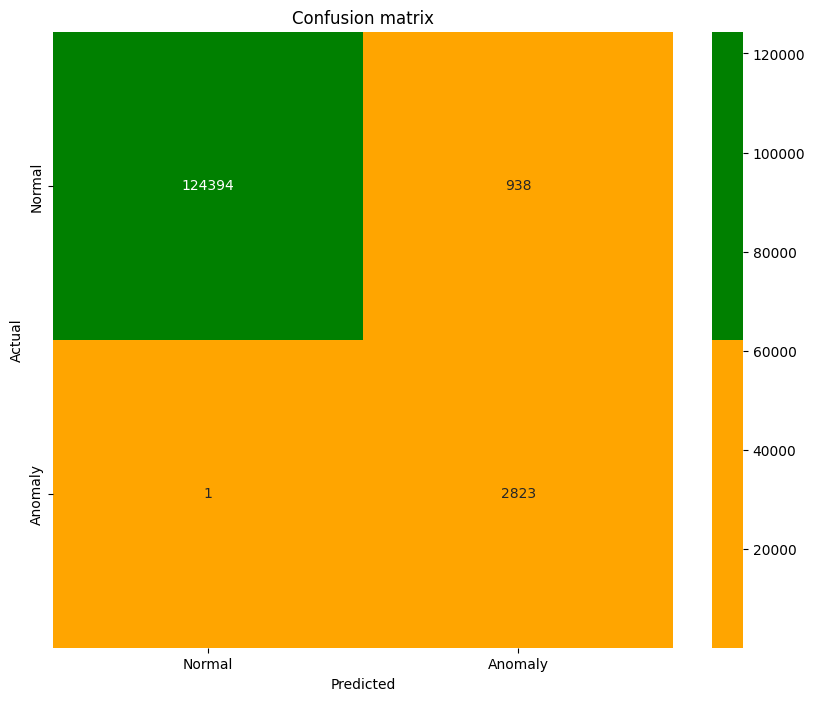

In [ ]:
viz = visualization()
viz.draw_confusion_matrix(Y_test, y_label)

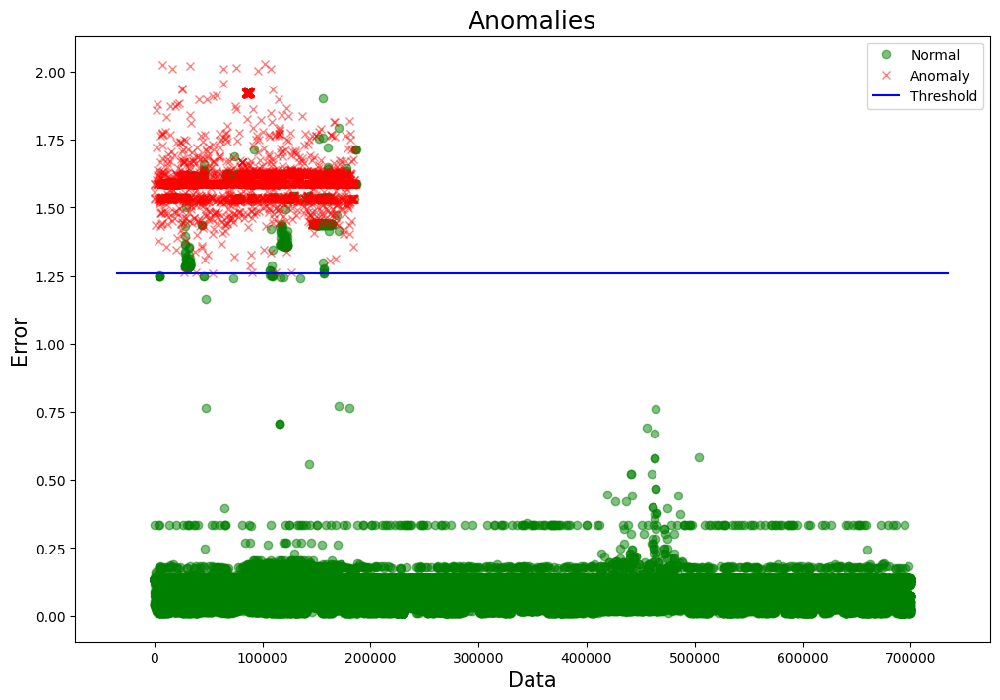

In [ ]:
viz.draw_anomaly(Y_test, error, threshold)

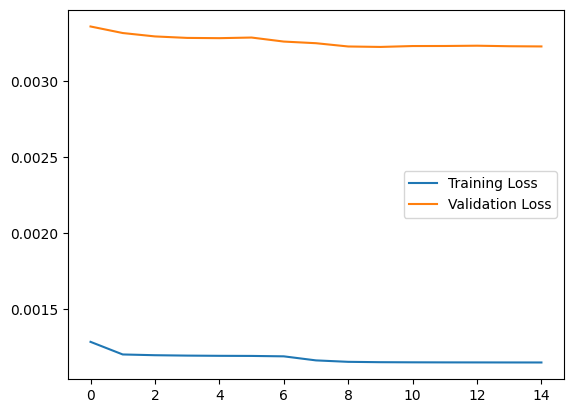

In [ ]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()

#Variational autoencoder

##Cross validation for activation function

In [ ]:
# 5 layers relu+sig

cvs = [1,2,3,4,5]
roc_5rs = []
rec_5rs = []
prec_5rs = []
f1_5rs = []
batch_size = 32
epochs = 6

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(12, activation = "relu")(inputs)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(12, activation = "relu")(latent_inputs)
  outputs = Dense(original_dim, activation= "sigmoid")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))

  roc_5rs.append(roc_auc_score(Y_test, y_label))
  rec_5rs.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_5rs.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_5rs.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_5rs)
print("Recall: ", rec_5rs)
print("Precision: ", prec_5rs)
print("F1 score: ", f1_5rs)

Epoch 1/6
3716/3716 [==============================] - 30s 7ms/step - loss: 0.4569 - mae: 0.0552 - accuracy: 0.4237 - val_loss: 0.4255 - val_mae: 0.0303 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 20s 5ms/step - loss: 0.1697 - mae: 0.0184 - accuracy: 0.4366 - val_loss: 0.4228 - val_mae: 0.0285 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 19s 5ms/step - loss: 0.1691 - mae: 0.0175 - accuracy: 0.4366 - val_loss: 0.4234 - val_mae: 0.0278 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 23s 6ms/step - loss: 0.1691 - mae: 0.0174 - accuracy: 0.4366 - val_loss: 0.4242 - val_mae: 0.0273 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 19s 5ms/step - loss: 0.1691 - mae: 0.0174 - accuracy: 0.4366 - val_loss: 0.4221 - val_mae: 0.0280 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 1ms/step
ROC:  0.9862498989953403
Recall:  1.0
Precision:  0.7

In [ ]:
print("ROC relu + sigmoid: ", roc_5rs)
print("Recall: ", rec_5rs)
print("Precision: ", prec_5rs)
print("F1 score: ", f1_5rs)

ROC relu + sigmoid:  [0.9862498989953403, 0.984376265716236, 0.9854118621718846, 0.9856946577224601, 0.9859617923638617]
Recall:  [1.0, 0.9957671957671957, 0.9985835694050992, 1.0, 1.0]
Precision:  [0.7378017462763226, 0.737653514502221, 0.7320872274143302, 0.7306619325386762, 0.7347925680834818]
F1 score:  [0.8491207329688192, 0.8474932452716901, 0.8448172558418213, 0.8443728018757328, 0.84712441314554]


In [ ]:
roc_5rs_save= [0.9862498989953403, 0.984376265716236, 0.9854118621718846, 0.9856946577224601, 0.9859617923638617]
rec_5rs_save= [1.0, 0.9957671957671957, 0.9985835694050992, 1.0, 1.0]
prec_5rs_save =  [0.7378017462763226, 0.737653514502221, 0.7320872274143302, 0.7306619325386762, 0.7347925680834818]
f1_5rs_save =  [0.8491207329688192, 0.8474932452716901, 0.8448172558418213, 0.8443728018757328, 0.84712441314554]

In [ ]:
# 5 layers relu

roc_5r = []
rec_5r = []
prec_5r = []
f1_5r = []
batch_size = 32
epochs = 6

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(12, activation = "relu")(inputs)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(12, activation = "relu")(latent_inputs)
  outputs = Dense(original_dim, activation= "relu")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))

  roc_5r.append(roc_auc_score(Y_test, y_label))
  rec_5r.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_5r.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_5r.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_5r)
print("Recall: ", rec_5r)
print("Precision: ", prec_5r)
print("F1 score: ", f1_5r)

Epoch 1/6
3716/3716 [==============================] - 25s 6ms/step - loss: 0.1847 - mae: 0.0161 - accuracy: 0.4239 - val_loss: 0.4273 - val_mae: 0.0244 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 19s 5ms/step - loss: 0.1700 - mae: 0.0143 - accuracy: 0.4367 - val_loss: 0.4269 - val_mae: 0.0248 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 23s 6ms/step - loss: 0.1700 - mae: 0.0143 - accuracy: 0.4367 - val_loss: 0.4270 - val_mae: 0.0245 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 20s 5ms/step - loss: 0.1699 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4265 - val_mae: 0.0248 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 22s 6ms/step - loss: 0.1699 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4273 - val_mae: 0.0243 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 4s 3ms/step
ROC:  0.9862498989953403
Recall:  1.0
Precision:  0.7

In [ ]:
print("ROC 5 relu: ", roc_5r)
print("Recall: ", rec_5r)
print("Precision: ", prec_5r)
print("F1 score: ", f1_5r)

ROC 5 relu:  [0.9862498989953403, 0.9859381313751464, 0.985835427346285, 0.9848958160484981, 0.9856693015109558]
Recall:  [1.0, 0.9992945326278659, 0.9996458923512748, 0.9979173897952099, 0.9993072393488049]
Precision:  [0.7378017462763226, 0.7354620976116303, 0.7307791871602382, 0.7336055116101046, 0.7354065765995411]
F1 score:  [0.8491207329688192, 0.8473156871541797, 0.8443248093315389, 0.8455882352941176, 0.8472834067547724]


In [ ]:
roc_5r_save=  [0.9862498989953403, 0.9859381313751464, 0.985835427346285, 0.9848958160484981, 0.9856693015109558]
rec_5r_save=   [1.0, 0.9992945326278659, 0.9996458923512748, 0.9979173897952099, 0.9993072393488049]
prec_5r_save= [0.7378017462763226, 0.7354620976116303, 0.7307791871602382, 0.7336055116101046, 0.7354065765995411]
f1_5r_save=  [0.8491207329688192, 0.8473156871541797, 0.8443248093315389, 0.8455882352941176, 0.8472834067547724]

In [ ]:
# 5 layers relu+softmax

roc_5rso = []
rec_5rso = []
prec_5rso = []
f1_5rso = []
batch_size = 32

epochs = 6

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(12, activation = "relu")(inputs)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(12, activation = "relu")(latent_inputs)
  outputs = Dense(original_dim, activation= "softmax")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))

  roc_5rso.append(roc_auc_score(Y_test, y_label))
  rec_5rso.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_5rso.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_5rso.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_5rso)
print("Recall: ", rec_5rso)
print("Precision: ", prec_5rso)
print("F1 score: ", f1_5rso)

Epoch 1/6
3716/3716 [==============================] - 35s 8ms/step - loss: 0.1785 - mae: 0.0318 - accuracy: 0.4345 - val_loss: 0.4205 - val_mae: 0.0408 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 26s 7ms/step - loss: 0.1750 - mae: 0.0311 - accuracy: 0.4366 - val_loss: 0.4221 - val_mae: 0.0405 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 20s 5ms/step - loss: 0.1750 - mae: 0.0311 - accuracy: 0.4366 - val_loss: 0.4223 - val_mae: 0.0405 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 19s 5ms/step - loss: 0.1749 - mae: 0.0311 - accuracy: 0.4366 - val_loss: 0.4206 - val_mae: 0.0410 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 23s 6ms/step - loss: 0.1749 - mae: 0.0311 - accuracy: 0.4366 - val_loss: 0.4210 - val_mae: 0.0408 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 3s 2ms/step
ROC:  0.9862364317073828
Recall:  1.0
Precision:  0.7

In [ ]:
print("ROC relu + softmax: ", roc_5rso)
print("Recall: ", rec_5rso)
print("Precision: ", prec_5rso)
print("F1 score: ", f1_5rso)

In [ ]:
roc_5rso_save =  [0.9862364317073828, 0.9862908650612134, 0.9859990316333118, 0.9856946577224601, 0.9856154120382642]
rec_5rso_save= [1.0, 1.0, 1.0, 1.0, 0.9993072393488049]
prec_5rso_save=  [0.737612323491656, 0.7355993772703684, 0.7306597671410091, 0.7306619325386762, 0.7346574993633818]
f1_5rso_save=  [0.8489952718676123, 0.8476603378681417, 0.8443713559575423, 0.8443728018757328, 0.8467860287643088]

###Summary

In [ ]:
print("Recall")
print("relu + sigmoid", mean(rec_5rs_save))
print("relu", mean(rec_5r_save))
print("relu + softmax", mean(rec_5rso_save))
print()
print("Precision")
print("relu + sigmoid", mean(prec_5rs_save))
print("relu", mean(prec_5r_save))
print("relu + softmax", mean(prec_5rso_save))
print()
print("F1 score")
print("relu + sigmoid", mean(f1_5rs_save))
print("relu", mean(f1_5r_save))
print("relu + softmax", mean(f1_5rso_save))
print()
print("AUC")
print("relu + sigmoid", mean(rec_5rs_save))
print("relu", mean(roc_5r_save))
print("relu + softmax", mean(roc_5rso_save))

Recall
relu + sigmoid 0.998870153034459
relu 0.9992330108246311
relu + softmax 0.9998614478697609

Precision
relu + sigmoid 0.7345993977630063
relu 0.7346110238515673
relu + softmax 0.7338381799610183

F1 score
relu + sigmoid 0.8465856898207207
relu 0.8467265743006855
relu + softmax 0.8464371592666675

AUC
relu + sigmoid 0.998870153034459
relu 0.9857177150552451
relu + softmax 0.9859672796325265


##Cross validation for number of layers

In [ ]:
# 5 layers relu +sigmoid

cvs = [1,2,3]
roc_5l = []
rec_5l = []
prec_5l = []
f1_5l = []
batch_size = 32
epochs = 6

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(12, activation = "relu")(inputs)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(12, activation = "relu")(latent_inputs)
  outputs = Dense(original_dim, activation= "sigmoid")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))

  roc_5l.append(roc_auc_score(Y_test, y_label))
  rec_5l.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_5l.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_5l.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_5l)
print("Recall: ", rec_5l)
print("Precision: ", prec_5l)
print("F1 score: ", f1_5l)

Epoch 1/6
3716/3716 [==============================] - 24s 6ms/step - loss: 0.4831 - mae: 0.0572 - accuracy: 0.3991 - val_loss: 0.4250 - val_mae: 0.0299 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 19s 5ms/step - loss: 0.1696 - mae: 0.0182 - accuracy: 0.4366 - val_loss: 0.4247 - val_mae: 0.0276 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 22s 6ms/step - loss: 0.1692 - mae: 0.0174 - accuracy: 0.4366 - val_loss: 0.4238 - val_mae: 0.0276 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 20s 5ms/step - loss: 0.1691 - mae: 0.0173 - accuracy: 0.4366 - val_loss: 0.4233 - val_mae: 0.0276 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 24s 6ms/step - loss: 0.1691 - mae: 0.0174 - accuracy: 0.4366 - val_loss: 0.4239 - val_mae: 0.0274 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 1ms/step
ROC:  0.9857019027201306
Recall:  0.9986077271145144


In [ ]:
print("ROC 5 layers: ", roc_5l)
print("Recall: ", rec_5l)
print("Precision: ", prec_5l)
print("F1 score: ", f1_5l)

ROC 5 layers:  [0.9857019027201306, 0.9859515848932414, 0.9860662793199915]
Recall:  [0.9986077271145144, 0.9992945326278659, 1.0]
Precision:  [0.7396236143335911, 0.7356530771228252, 0.7316062176165803]
F1 score:  [0.8498222748815165, 0.8474424169907269, 0.8450029922202273]


In [ ]:
roc_5l_save =  [0.9857019027201306, 0.9859515848932414, 0.9860662793199915]
rec_5l_save=   [0.9986077271145144, 0.9992945326278659, 1.0]
prec_5l_save=    [0.7396236143335911, 0.7356530771228252, 0.7316062176165803]
f1_5l_save= [0.8498222748815165, 0.8474424169907269, 0.8450029922202273]

In [ ]:
# 7 layers relu+sigmoid
cvs = [1,2,3,4,5]

roc_7l = []
rec_7l = []
prec_7l = []
f1_7l = []
batch_size = 32

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(18, activation = "relu")(inputs)
  x = Dense(8, activation = "relu")(x)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(8, activation = "relu")(latent_inputs)
  x = Dense(18, activation = "relu")(x)
  outputs = Dense(original_dim, activation= "sigmoid")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))

  roc_7l.append(roc_auc_score(Y_test, y_label))
  rec_7l.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_7l.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_7l.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_7l)
print("Recall: ", rec_7l)
print("Precision: ", prec_7l)
print("F1 score: ", f1_7l)

Epoch 1/6
3716/3716 [==============================] - 25s 6ms/step - loss: 0.3286 - mae: 0.0353 - accuracy: 0.4195 - val_loss: 0.4245 - val_mae: 0.0274 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 22s 6ms/step - loss: 0.1696 - mae: 0.0169 - accuracy: 0.4366 - val_loss: 0.4236 - val_mae: 0.0273 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 22s 6ms/step - loss: 0.1693 - mae: 0.0172 - accuracy: 0.4366 - val_loss: 0.4244 - val_mae: 0.0271 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 25s 7ms/step - loss: 0.1692 - mae: 0.0173 - accuracy: 0.4366 - val_loss: 0.4228 - val_mae: 0.0278 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 17s 4ms/step - loss: 0.1691 - mae: 0.0174 - accuracy: 0.4366 - val_loss: 0.4222 - val_mae: 0.0282 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 2ms/step
ROC:  0.9850596354292179
Recall:  0.9972154542290289


In [ ]:
print("ROC 7 layers: ", roc_7l)
print("Recall: ", rec_7l)
print("Precision: ", prec_7l)
print("F1 score: ", f1_7l)

ROC 7 layers:  [0.9850596354292179, 0.9862908650612134, 0.9850846535978312]
Recall:  [0.9972154542290289, 1.0, 0.9978753541076487]
Precision:  [0.7401188323430639, 0.7355993772703684, 0.7323284823284824]
F1 score:  [0.849644128113879, 0.8476603378681417, 0.8447242206235013]


In [ ]:
roc_7l_save =   [0.9850596354292179, 0.9862908650612134, 0.9850846535978312]
rec_7l_save=  [0.9972154542290289, 1.0, 0.9978753541076487]
prec_7l_save=  [0.7401188323430639, 0.7355993772703684, 0.7323284823284824]
f1_7l_save=  [0.849644128113879, 0.8476603378681417, 0.8447242206235013]

In [ ]:
# 9 layers relu + sigmoid
cvs = [1,2,3,4,5]
roc_9l = []
rec_9l = []
prec_9l = []
f1_9l = []
batch_size = 32

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(21, activation = "relu")(inputs)
  x = Dense(14, activation = "relu")(x)
  x = Dense(8, activation = "relu")(x)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(8, activation = "relu")(latent_inputs)
  x = Dense(14, activation = "relu")(x)
  x = Dense(21, activation = "relu")(x)
  outputs = Dense(original_dim, activation= "sigmoid")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", sklearn.metrics.recall_score(Y_test, y_label))
  print("Precision: ", sklearn.metrics.precision_score(Y_test, y_label))
  print("F1 score: ", sklearn.metrics.f1_score(Y_test, y_label))

  roc_9l.append(roc_auc_score(Y_test, y_label))
  rec_9l.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_9l.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_9l.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_9l)
print("Recall: ", rec_9l)
print("Precision: ", prec_9l)
print("F1 score: ", f1_9l)

Epoch 1/6
3716/3716 [==============================] - 19s 4ms/step - loss: 0.3064 - mae: 0.0317 - accuracy: 0.4218 - val_loss: 0.4234 - val_mae: 0.0276 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 15s 4ms/step - loss: 0.1694 - mae: 0.0174 - accuracy: 0.4366 - val_loss: 0.4216 - val_mae: 0.0283 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 15s 4ms/step - loss: 0.1693 - mae: 0.0176 - accuracy: 0.4366 - val_loss: 0.4261 - val_mae: 0.0263 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1692 - mae: 0.0175 - accuracy: 0.4366 - val_loss: 0.4217 - val_mae: 0.0284 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 17s 5ms/step - loss: 0.1691 - mae: 0.0175 - accuracy: 0.4366 - val_loss: 0.4241 - val_mae: 0.0272 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 2ms/step
ROC:  0.9861173073812897
Recall:  0.9993038635572572


In [ ]:
print("ROC 9 layers: ", roc_9l)
print("Recall: ", rec_9l)
print("Precision: ", prec_9l)
print("F1 score: ", f1_9l)

ROC 9 layers:  [0.9861173073812897, 0.986247562291331, 0.9844862444380639]
Recall:  [0.9993038635572572, 0.9992945326278659, 0.9968130311614731]
Precision:  [0.7407120743034056, 0.7398798641943066, 0.7311688311688311]
F1 score:  [0.8507927100311158, 0.8502400960384153, 0.8435720707222055]


In [ ]:
roc_9l_save=  [0.9861173073812897, 0.986247562291331, 0.9844862444380639]
rec_9l_save=  [0.9993038635572572, 0.9992945326278659, 0.9968130311614731]
prec_9l_save= [0.7407120743034056, 0.7398798641943066, 0.7311688311688311]
f1_9l_save=   [0.8507927100311158, 0.8502400960384153, 0.8435720707222055]


In [ ]:
print("Recall")
print("5 layers", mean(rec_5l_save))
print("7 layers", mean(rec_7l_save))
print("9 layers", mean(rec_9l_save))
print()
print("Precision")
print("5 layers", mean(prec_5l_save))
print("7 layers", mean(prec_7l_save))
print("9 layers", mean(prec_9l_save))
print()
print("F1 score")
print("5 layers", mean(f1_5l_save))
print("7 layers", mean(f1_7l_save))
print("9 layers", mean(f1_9l_save))
print()
print("AUC")
print("5 layers", mean(roc_5l_save))
print("7 layers", mean(roc_7l_save))
print("9 layers", mean(roc_9l_save))


Recall
5 layers 0.9993007532474601
7 layers 0.9983636027788926
9 layers 0.9984704757821987

Precision
5 layers 0.7356276363576656
7 layers 0.7360155639806382
9 layers 0.7372535898888478

F1 score
5 layers 0.847422561364157
7 layers 0.847342895535174
9 layers 0.8482016255972455

AUC
5 layers 0.9859065889777878
7 layers 0.9854783846960875
9 layers 0.9856170380368948


In [ ]:
# 5 layers relu
cvs = [1,2,3,4,5]
roc_5lr = []
rec_5lr = []
prec_5lr = []
f1_5lr = []
batch_size = 32

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(12, activation = "relu")(inputs)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(12, activation = "relu")(latent_inputs)
  outputs = Dense(original_dim, activation= "relu")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", recall(Y_test, y_label))
  print("Precision: ", precision(Y_test, y_label))
  print("F1 score: ", f1_score(Y_test, y_label))

  roc_5lr.append(roc_auc_score(Y_test, y_label))
  rec_5lr.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_5lr.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_5lr.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_5lr)
print("Recall: ", rec_5lr)
print("Precision: ", prec_5lr)
print("F1 score: ", f1_5lr)

Epoch 1/6
3716/3716 [==============================] - 25s 6ms/step - loss: 0.1857 - mae: 0.0162 - accuracy: 0.4257 - val_loss: 0.4274 - val_mae: 0.0245 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 22s 6ms/step - loss: 0.1700 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4279 - val_mae: 0.0244 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 22s 6ms/step - loss: 0.1700 - mae: 0.0143 - accuracy: 0.4367 - val_loss: 0.4262 - val_mae: 0.0249 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 20s 5ms/step - loss: 0.1699 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4266 - val_mae: 0.0246 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 19s 5ms/step - loss: 0.1699 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4268 - val_mae: 0.0247 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 3s 2ms/step
ROC:  0.9856625414890204
Recall:  0.9730654240848978


In [ ]:
print("ROC 5 layers: ", roc_5lr)
print("Recall: ", rec_5lr)
print("Precision: ", prec_5lr)
print("F1 score: ", f1_5lr)

ROC 5 layers:  [0.9856625414890204, 0.9863043185793086, 0.986120077469335, 0.9856946577224601, 0.9859752647320347]
Recall:  [0.998259658893143, 1.0, 1.0, 1.0, 1.0]
Precision:  [0.7414684591520165, 0.7357902932779652, 0.7323651452282157, 0.7306619325386762, 0.734979633401222]
F1 score:  [0.8509123275478415, 0.8477870813397129, 0.8455089820359281, 0.8443728018757328, 0.8472487160674982]


In [ ]:
roc_5lr_save=  [0.9856625414890204, 0.9863043185793086, 0.986120077469335, 0.9856946577224601, 0.9859752647320347]
rec_5lr_save=  [0.998259658893143, 1.0, 1.0, 1.0, 1.0]
prec_5lr_save=  [0.7414684591520165, 0.7357902932779652, 0.7323651452282157, 0.7306619325386762, 0.734979633401222]
f1_5lr_save=  [0.8509123275478415, 0.8477870813397129, 0.8455089820359281, 0.8443728018757328, 0.8472487160674982]

In [ ]:
# 7 layers relu

roc_7lr = []
rec_7lr = []
prec_7lr = []
f1_7lr = []
batch_size = 32

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(18, activation = "relu")(inputs)
  x = Dense(8, activation = "relu")(x)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(8, activation = "relu")(latent_inputs)
  x = Dense(18, activation = "relu")(x)
  outputs = Dense(original_dim, activation= "relu")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", recall(Y_test, y_label))
  print("Precision: ", precision(Y_test, y_label))
  print("F1 score: ", f1_score(Y_test, y_label))

  roc_7lr.append(roc_auc_score(Y_test, y_label))
  rec_7lr.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_7lr.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_7lr.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_7lr)
print("Recall: ", rec_7lr)
print("Precision: ", prec_7lr)
print("F1 score: ", f1_7lr)

Epoch 1/6
3716/3716 [==============================] - 15s 4ms/step - loss: 0.1755 - mae: 0.0149 - accuracy: 0.4315 - val_loss: 0.4281 - val_mae: 0.0242 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 13s 3ms/step - loss: 0.1702 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4264 - val_mae: 0.0247 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 13s 3ms/step - loss: 0.1699 - mae: 0.0143 - accuracy: 0.4367 - val_loss: 0.4255 - val_mae: 0.0250 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 12s 3ms/step - loss: 0.1699 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4264 - val_mae: 0.0246 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 14s 4ms/step - loss: 0.1698 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4262 - val_mae: 0.0247 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 2ms/step
ROC:  0.9864653756026611
Recall:  0.9729307512053222


In [ ]:
print("ROC 7 layers: ", roc_7lr)
print("Recall: ", rec_7lr)
print("Precision: ", prec_7lr)
print("F1 score: ", f1_7lr)

ROC 7 layers:  [0.9864653756026611, 0.9865330283869232, 0.985739070745938, 0.9859101807699561, 0.9861504055182819]
Recall:  [1.0, 1.0, 0.9992917847025495, 1.0, 1.0]
Precision:  [0.7408457968024755, 0.7390510948905109, 0.7318464730290456, 0.7336389101094983, 0.7374201787994892]
F1 score:  [0.8511331654569694, 0.8499475341028331, 0.8449101796407185, 0.8463572267920093, 0.8488679800058806]


In [ ]:
roc_7lr_save=  [0.9864653756026611, 0.9865330283869232, 0.985739070745938, 0.9859101807699561, 0.9861504055182819]
rec_7lr_save= [1.0, 1.0, 0.9992917847025495, 1.0, 1.0]
prec_7lr_save= [0.7408457968024755, 0.7390510948905109, 0.7318464730290456, 0.7336389101094983, 0.7374201787994892]
f1_7lr_save=   [0.8511331654569694, 0.8499475341028331, 0.8449101796407185, 0.8463572267920093, 0.8488679800058806]

In [ ]:
# 9 layers relu

roc_9lr = []
rec_9lr = []
prec_9lr = []
f1_9lr = []
batch_size = 32

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(21, activation = "relu")(inputs)
  x = Dense(14, activation = "relu")(x)
  x = Dense(8, activation = "relu")(x)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(8, activation = "relu")(latent_inputs)
  x = Dense(14, activation = "relu")(x)
  x = Dense(21, activation = "relu")(x)
  outputs = Dense(original_dim, activation= "relu")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", recall(Y_test, y_label))
  print("Precision: ", precision(Y_test, y_label))
  print("F1 score: ", f1_score(Y_test, y_label))

  roc_9lr.append(roc_auc_score(Y_test, y_label))
  rec_9lr.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_9lr.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_9lr.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_9lr)
print("Recall: ", rec_9lr)
print("Precision: ", prec_9lr)
print("F1 score: ", f1_9lr)

Epoch 1/6
3716/3716 [==============================] - 19s 4ms/step - loss: 0.1716 - mae: 0.0147 - accuracy: 0.4339 - val_loss: 0.4263 - val_mae: 0.0249 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1698 - mae: 0.0146 - accuracy: 0.4366 - val_loss: 0.4262 - val_mae: 0.0248 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1698 - mae: 0.0147 - accuracy: 0.4366 - val_loss: 0.4256 - val_mae: 0.0254 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1698 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4263 - val_mae: 0.0246 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1698 - mae: 0.0143 - accuracy: 0.4366 - val_loss: 0.4262 - val_mae: 0.0248 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 1ms/step
ROC:  0.9862115783969925
Recall:  0.973119293236728
P

In [ ]:
print("ROC 9 layers: ", roc_9lr)
print("Recall: ", rec_9lr)
print("Precision: ", prec_9lr)
print("F1 score: ", f1_9lr)

ROC 9 layers:  [0.9862115783969925, 0.9860861200741913, 0.9855216683095676, 0.9858697701985506, 0.9859098535146188]
Recall:  [0.9993038635572572, 0.9992945326278659, 0.9989376770538244, 1.0, 0.9996536196744025]
Precision:  [0.7420522098733523, 0.7375683415777141, 0.7312078797304302, 0.7330788804071247, 0.7364123500893085]
F1 score:  [0.8516760605161673, 0.8487118034751348, 0.8443579766536965, 0.8459844369402437, 0.8480752277402291]


In [ ]:
roc_9lr_save=  [0.9862115783969925, 0.9860861200741913, 0.9855216683095676, 0.9858697701985506, 0.9859098535146188]
rec_9lr_save=  [0.9993038635572572, 0.9992945326278659, 0.9989376770538244, 1.0, 0.9996536196744025]
prec_9lr_save=  [0.7420522098733523, 0.7375683415777141, 0.7312078797304302, 0.7330788804071247, 0.7364123500893085]
f1_9lr_save=  [0.8516760605161673, 0.8487118034751348, 0.8443579766536965, 0.8459844369402437, 0.8480752277402291]

In [ ]:
# 11 layers relu

roc_11lr = []
rec_11lr = []
prec_11lr = []
f1_11lr = []
batch_size = 32

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(22, activation = "relu")(inputs)
  x = Dense(16, activation = "relu")(x)
  x = Dense(11, activation = "relu")(x)
  x = Dense(7, activation = "relu")(x)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(7, activation = "relu")(latent_inputs)
  x = Dense(11, activation = "relu")(x)
  x = Dense(16, activation = "relu")(x)
  x = Dense(22, activation = "relu")(x)
  outputs = Dense(original_dim, activation= "relu")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", recall(Y_test, y_label))
  print("Precision: ", precision(Y_test, y_label))
  print("F1 score: ", f1_score(Y_test, y_label))

  roc_11lr.append(roc_auc_score(Y_test, y_label))
  rec_11lr.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_11lr.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_11lr.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_11lr)
print("Recall: ", rec_11lr)
print("Precision: ", prec_11lr)
print("F1 score: ", f1_11lr)

Epoch 1/6
3716/3716 [==============================] - 19s 4ms/step - loss: 0.1708 - mae: 0.0149 - accuracy: 0.4362 - val_loss: 0.4242 - val_mae: 0.0259 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1694 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4254 - val_mae: 0.0251 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1694 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4247 - val_mae: 0.0254 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 15s 4ms/step - loss: 0.1694 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4249 - val_mae: 0.0257 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 16s 4ms/step - loss: 0.1694 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4255 - val_mae: 0.0253 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 2ms/step
ROC:  0.9865865811942791
Recall:  0.9731731623885582


In [ ]:
print("ROC 11 layers: ", roc_11lr)
print("Recall: ", rec_11lr)
print("Precision: ", prec_11lr)
print("F1 score: ", f1_11lr)

ROC 11 layers:  [0.9865865811942791, 0.986328283399901, 0.986120077469335, 0.9858832403890191, 0.9861504055182819]
Recall:  [1.0, 0.9992945326278659, 1.0, 1.0, 1.0]
Precision:  [0.7425691393124838, 0.7410410672246927, 0.7323651452282157, 0.7332654619496055, 0.7374201787994892]
F1 score:  [0.8522693562741026, 0.8510063082006608, 0.8455089820359281, 0.8461086637298091, 0.8488679800058806]


In [ ]:
rec_11lr_save = [0.9865865811942791, 0.986328283399901, 0.986120077469335, 0.9858832403890191, 0.9861504055182819]
prec_11lr_save =  [1.0, 0.9992945326278659, 1.0, 1.0, 1.0]
roc_11lr_save = [0.7425691393124838, 0.7410410672246927, 0.7323651452282157, 0.7332654619496055, 0.7374201787994892]
f1_11lr_save = [0.8522693562741026, 0.8510063082006608, 0.8455089820359281, 0.8461086637298091, 0.8488679800058806]

In [ ]:
# 13 layers relu

roc_13lr = []
rec_13lr = []
prec_13lr = []
f1_13lr = []
batch_size = 32

for i in cvs:
  Train_raw, Test = train_test_split(df_small, test_size = 0.2, random_state = i) ##200k units in total
  Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = i)

  X_train = Train.drop(labels = ["Label"], axis = 1)
  Y_train = Train['Label']
  X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_valid = Validation.drop(labels = ["Label"], axis = 1)
  Y_valid = Validation['Label']
  X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)

  X_test = Test.drop(labels = ["Label"], axis = 1)
  Y_test = Test['Label']
  X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
  X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


  original_dim = X_train_normal[high_corr].shape[1]
  input_shape = (original_dim, )
  latent_dim = 2

  #encoder
  inputs = Input(shape = input_shape, name = "encoder_input")
  x = Dense(23, activation = "relu")(inputs)
  x = Dense(18, activation = "relu")(x)
  x = Dense(14, activation = "relu")(x)
  x = Dense(10, activation = "relu")(x)
  x = Dense(6, activation = "relu")(x)
  z_mean = Dense(latent_dim, name = "z_mean")(x)
  z_log_var = Dense(latent_dim, name = "z_log_var")(x)
  z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
  encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

  #decoder
  latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
  x = Dense(6, activation = "relu")(latent_inputs)
  x = Dense(10, activation = "relu")(x)
  x = Dense(14, activation = "relu")(x)
  x = Dense(18, activation = "relu")(x)
  x = Dense(23, activation = "relu")(x)
  outputs = Dense(original_dim, activation= "relu")(x)
  decoder = Model(latent_inputs, outputs, name="decoder")

  #####

  outputs = decoder(encoder(inputs)[2])
  vae = Model(inputs, outputs, name = "vae_mlp")

  reconstruction_loss = mse(inputs, outputs)
  reconstruction_loss *= original_dim
  kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
  kl_loss = K.sum(kl_loss, axis = -1)
  kl_loss *= -0.5
  vae_loss = K.mean(reconstruction_loss + kl_loss)
  vae.add_loss(vae_loss)

  vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

  history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

  y_pred_val = vae.predict(X_valid[high_corr])
  y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
  threshold = threshold_optimizer(y_dist_val, Y_valid)

  y_pred = vae.predict(X_test[high_corr])
  y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
  threshold = threshold
  z = zip(y_dist >= threshold, y_dist)
  y_label = []
  error = []
  for idx, (is_anomaly, y_dist) in enumerate(z):
    if is_anomaly:
      y_label.append(1)
    else:
      y_label.append(0)
    error.append(y_dist)

  print("ROC: ", roc_auc_score(Y_test, y_label))
  print("Recall: ", recall(Y_test, y_label))
  print("Precision: ", precision(Y_test, y_label))
  print("F1 score: ", f1_score(Y_test, y_label))

  roc_13lr.append(roc_auc_score(Y_test, y_label))
  rec_13lr.append(sklearn.metrics.recall_score(Y_test, y_label))
  prec_13lr.append(sklearn.metrics.precision_score(Y_test, y_label))
  f1_13lr.append(sklearn.metrics.f1_score(Y_test, y_label))


print("ROC: ", roc_13lr)
print("Recall: ", rec_13lr)
print("Precision: ", prec_13lr)
print("F1 score: ", f1_13lr)

Epoch 1/6
3716/3716 [==============================] - 33s 7ms/step - loss: 0.1712 - mae: 0.0155 - accuracy: 0.4347 - val_loss: 0.4229 - val_mae: 0.0262 - val_accuracy: 0.4077
Epoch 2/6
3716/3716 [==============================] - 23s 6ms/step - loss: 0.1694 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4240 - val_mae: 0.0258 - val_accuracy: 0.4077
Epoch 3/6
3716/3716 [==============================] - 19s 5ms/step - loss: 0.1694 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4249 - val_mae: 0.0256 - val_accuracy: 0.4077
Epoch 4/6
3716/3716 [==============================] - 17s 5ms/step - loss: 0.1694 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4238 - val_mae: 0.0260 - val_accuracy: 0.4077
Epoch 5/6
3716/3716 [==============================] - 17s 5ms/step - loss: 0.1693 - mae: 0.0153 - accuracy: 0.4366 - val_loss: 0.4241 - val_mae: 0.0259 - val_accuracy: 0.4077
Epoch 6/6
1250/1250 [==============================] - 2s 2ms/step
ROC:  0.9862498989953403
Recall:  0.9724997979906806


In [ ]:
rec_13lr_save = [0.9862498989953403, 0.9861668411827611, 0.9861604260813428, 0.9859910019127671, 0.9861504055182819]
prec_13lr_save =  [1.0, 0.9992945326278659, 1.0, 1.0, 1.0]
roc_13lr_save = [0.7378017462763226, 0.738722294654498, 0.7329353750324422, 0.7347615404233614, 0.7374201787994892]
f1_13lr_save =  [0.8491207329688192, 0.8494752623688155, 0.8458888722480155, 0.8471037930020582, 0.8488679800058806]

###Summary

In [ ]:
print("Recall")
print("5 layers sigm", mean(rec_5l_save))
print("7 layers", mean(rec_7l_save))
print("9 layers", mean(rec_9l_save))
print("5 layers relu", mean(rec_5lr_save))
print("7 layers", mean(rec_7lr_save))
print("9 layers", mean(rec_9lr_save))
print("11 layers", mean(rec_11lr_save))
print("13 layers", mean(rec_13lr_save))
print()
print("Precision")
print("5 layers sigm", mean(prec_5l_save))
print("7 layers", mean(prec_7l_save))
print("9 layers", mean(prec_9l_save))
print("5 layers relu", mean(prec_5lr_save))
print("7 layers", mean(prec_7lr_save))
print("9 layers", mean(prec_9lr_save))
print("11 layers", mean(prec_11lr_save))
print("13 layers", mean(prec_13lr_save))
print()
print("F1 score")
print("5 layers sigm", mean(f1_5l_save))
print("7 layers", mean(f1_7l_save))
print("9 layers", mean(f1_9l_save))
print("5 layers relu", mean(f1_5lr_save))
print("7 layers", mean(f1_7lr_save))
print("9 layers", mean(f1_9lr_save))
print("11 layers", mean(f1_11lr_save))
print("13 layers", mean(f1_13lr_save))
print()
print("ROC")
print("5 layers sigm", mean(roc_5l_save))
print("7 layers", mean(roc_7l_save))
print("9 layers", mean(roc_9l_save))
print("5 layers relu", mean(roc_5lr_save))
print("7 layers", mean(roc_7lr_save))
print("9 layers", mean(roc_9lr_save))
print("11 layers", mean(roc_11lr_save))
print("13 layers", mean(roc_13lr_save))


Recall
5 layers sigm 0.9993007532474601
7 layers 0.9983636027788926
9 layers 0.9984704757821987
5 layers relu 0.9996519317786287
7 layers 0.99985835694051
9 layers 0.99943793858267
11 layers 0.9862137175941632
13 layers 0.9861437147380987

Precision
5 layers sigm 0.7356276363576656
7 layers 0.7360155639806382
9 layers 0.7372535898888478
5 layers relu 0.7350530927196192
7 layers 0.7365604907262039
9 layers 0.736063932335586
11 layers 0.9998589065255732
13 layers 0.9998589065255732

F1 score
5 layers sigm 0.847422561364157
7 layers 0.847342895535174
9 layers 0.8482016255972455
5 layers relu 0.8471659817733427
7 layers 0.8482432171996822
9 layers 0.8477611010650943
11 layers 0.8487522580492762
13 layers 0.8480913281187178

ROC
5 layers sigm 0.9859065889777878
7 layers 0.9854783846960875
9 layers 0.9856170380368948
5 layers relu 0.9859513719984317
7 layers 0.9861596122047521
9 layers 0.9859197980987842
11 layers 0.7373321985028973
13 layers 0.7363282270372227


##Define final VAE

In [ ]:
# Split data to train and test sets

Train_raw, Test = train_test_split(df_clean, test_size = 0.2, random_state = 42)
Train, Validation = train_test_split(Train_raw, test_size = 0.2, random_state = 42)

X_train = Train.drop(labels = ["Label"], axis = 1)
Y_train = Train['Label']
X_train_normal = Train[Train['Label'] == 0].drop(labels=["Label"], axis = 1)
X_train_anom = Train[Train['Label'] == 1].drop(labels=["Label"], axis = 1)

X_valid = Validation.drop(labels = ["Label"], axis = 1)
Y_valid = Validation['Label']
X_valid_normal = Validation[Validation['Label'] == 0].drop(labels=["Label"], axis = 1)
X_valid_anom = Validation[Validation['Label'] == 1].drop(labels=["Label"], axis = 1)


X_test = Test.drop(labels = ["Label"], axis = 1)
Y_test = Test['Label']
X_test_normal = Test[Test['Label'] == 0].drop(labels=["Label"], axis = 1)
X_test_anom = Test[Test['Label'] == 1].drop(labels=["Label"], axis = 1)


In [ ]:
original_dim = X_train_normal[high_corr].shape[1]
input_shape = (original_dim, )
latent_dim = 2
epochs = 10

#encoder
inputs = Input(shape = input_shape, name = "encoder_input")
x = Dense(22, activation = "relu")(inputs)
x = Dense(16, activation = "relu")(x)
x = Dense(11, activation = "relu")(x)
x = Dense(7, activation = "relu")(x)
z_mean = Dense(latent_dim, name = "z_mean")(x)
z_log_var = Dense(latent_dim, name = "z_log_var")(x)
z = Lambda(sampling, output_shape = (latent_dim, ), name = "z")([z_mean, z_log_var])
encoder = Model(inputs, [z_mean, z_log_var, z], name = "encoder")

#decoder
latent_inputs = Input(shape=(latent_dim,), name = "z_sampling")
x = Dense(7, activation = "relu")(latent_inputs)
x = Dense(11, activation = "relu")(x)
x = Dense(16, activation = "relu")(x)
x = Dense(22, activation = "relu")(x)
outputs = Dense(original_dim, activation= "relu")(x)
decoder = Model(latent_inputs, outputs, name="decoder")

#####

outputs = decoder(encoder(inputs)[2])
vae = Model(inputs, outputs, name = "vae_mlp")

reconstruction_loss = mse(inputs, outputs)
reconstruction_loss *= original_dim
kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis = -1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
vae.add_loss(vae_loss)


In [ ]:
# vae.summary()

In [ ]:
vae.compile(optimizer="adam",
                loss = "mean_squared_error",
                metrics = ["mae", "accuracy"])

In [ ]:
epochs = 15
batch_size = 32
history = vae.fit(X_train_normal[high_corr], X_train_normal[high_corr],
                    batch_size = batch_size,
                    epochs = epochs,
                    verbose = 1,
                    shuffle = True,
                    validation_data = (X_valid[high_corr],X_valid[high_corr]))

Epoch 1/15
12529/12529 [==============================] - 49s 4ms/step - loss: 0.1056 - mae: 0.0144 - accuracy: 0.4596 - val_loss: 0.1886 - val_mae: 0.0177 - val_accuracy: 0.4502
Epoch 2/15
12529/12529 [==============================] - 45s 4ms/step - loss: 0.1053 - mae: 0.0144 - accuracy: 0.4599 - val_loss: 0.1890 - val_mae: 0.0178 - val_accuracy: 0.4502
Epoch 3/15
12529/12529 [==============================] - 44s 3ms/step - loss: 0.1052 - mae: 0.0144 - accuracy: 0.4599 - val_loss: 0.1889 - val_mae: 0.0173 - val_accuracy: 0.4502
Epoch 4/15
12529/12529 [==============================] - 45s 4ms/step - loss: 0.1052 - mae: 0.0144 - accuracy: 0.4599 - val_loss: 0.1887 - val_mae: 0.0175 - val_accuracy: 0.4502
Epoch 5/15
12529/12529 [==============================] - 45s 4ms/step - loss: 0.1052 - mae: 0.0144 - accuracy: 0.4599 - val_loss: 0.1888 - val_mae: 0.0174 - val_accuracy: 0.4502
Epoch 6/15
12529/12529 [==============================] - 44s 3ms/step - loss: 0.0937 - mae: 0.0111 - acc

In [ ]:
score = vae.evaluate(X_test[high_corr], X_test[high_corr], verbose = 1)
print("Test loss:", score[0])
print("Test MAE:", score[1])
print("Test accuracy:", score[2])

4005/4005 [==============================] - 8s 2ms/step - loss: 0.1735 - mae: 0.0135 - accuracy: 0.4494
Test loss: 0.17345406115055084
Test MAE: 0.013475049287080765
Test accuracy: 0.4493741989135742


##Threshold selection

In [ ]:
y_pred_val = vae.predict(X_valid[high_corr])
y_dist_val = np.linalg.norm(X_valid[high_corr] - y_pred_val, axis = -1)
thresholdVae = threshold_optimizer(y_dist_val, Y_valid)

3204/3204 [==============================] - 5s 1ms/step


In [ ]:
print(thresholdVae)

1.677


##Evaluation

In [ ]:
y_pred = vae.predict(X_test[high_corr])
y_dist = np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)
thresholdVae = thresholdVae
z = zip(y_dist >= thresholdVae, y_dist)
y_labelVae = []
errorVae = []
for idx, (is_anomaly, y_dist) in enumerate(z):
  if is_anomaly:
    y_labelVae.append(1)
  else:
    y_labelVae.append(0)
  errorVae.append(y_dist)

4005/4005 [==============================] - 7s 2ms/step


In [ ]:
print(classification_report(Y_test, y_labelVae))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00    125332
           1       0.73      1.00      0.84      2824

    accuracy                           0.99    128156
   macro avg       0.86      1.00      0.92    128156
weighted avg       0.99      0.99      0.99    128156

ROC:  0.9956260930176251
Recall:  0.9916062936839753
Precision:  0.9999919537177847
F1 score:  0.995781469715119


In [ ]:
print("Recall",sklearn.metrics.recall_score(Y_test, y_labelVae))
print("Precision",sklearn.metrics.precision_score(Y_test, y_labelVae))
print("F1 score", sklearn.metrics.f1_score(Y_test, y_labelVae))
print("ROC: ", roc_auc_score(Y_test, y_labelVae))

Recall 0.9996458923512748
Precision 0.728516129032258
F1 score 0.8428123600537393
ROC:  0.9956260930176251


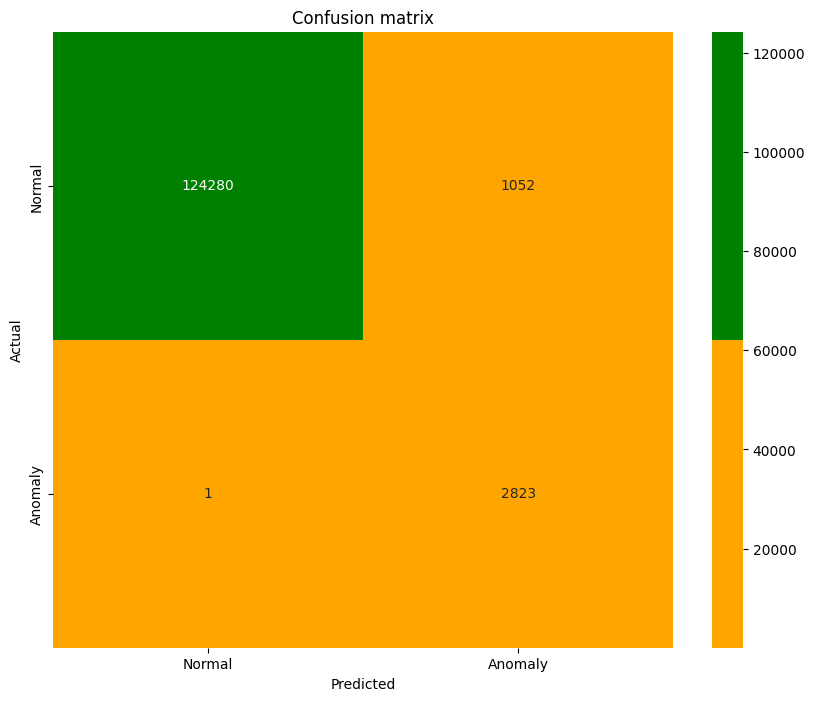

In [ ]:
viz.draw_confusion_matrix(Y_test, y_labelVae)

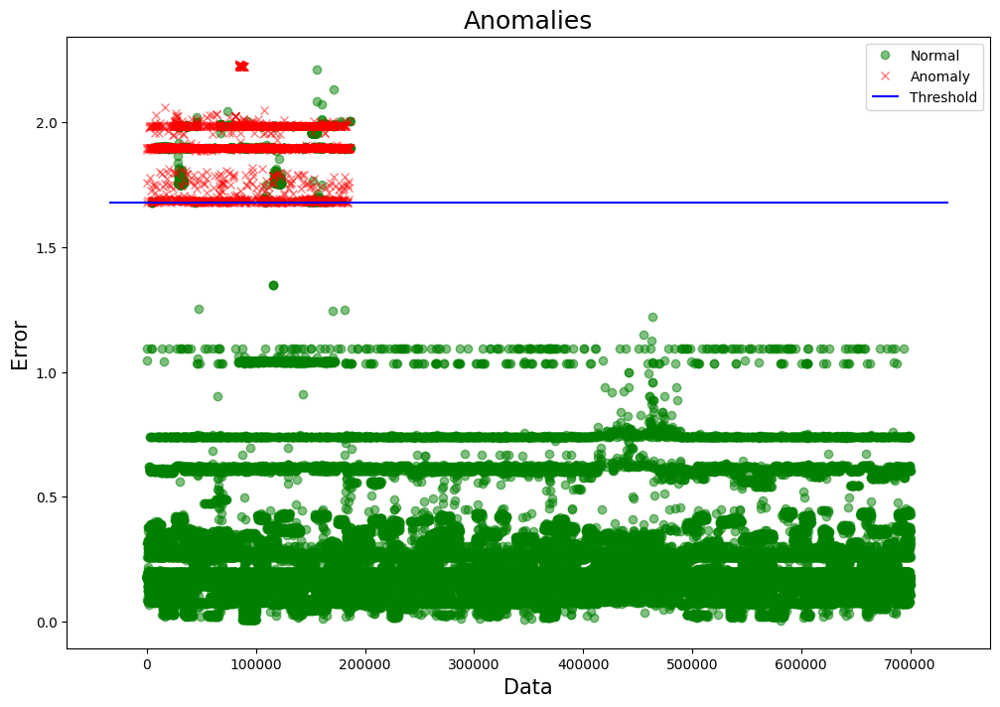

In [ ]:
viz.draw_anomaly(Y_test, errorVae, thresholdVae)

In [ ]:
del Test, Train, Train_raw, Validation

#LIME

In [ ]:
#Define the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(training_data = np.array(X_train[high_corr]),
                                                   mode = "regression",
                                                   feature_names = X_train[high_corr].columns,
                                                   verbose=True)

In [ ]:
# Explain one instance

exp = explainer.explain_instance(data_row = X_test[high_corr].iloc[87,:],
                                 predict_fn = predicting_function,
                                 num_features = 10)

exp.show_in_notebook(show_table = True, show_all=False)

# Left most graph shows the predicted value of the reconstruction error
# Middle plot gives the 10 most important features for the prediction / reconstruction error. Floating points next to bars represent relative importance of that feature
#Value column displays the original value of each feature

157/157 [==============================] - 0s 1ms/step
Intercept 6.89221583217054
Prediction_local [1.10938154]
Right: 1.4718320264518525


In [ ]:
# Same as above, with the variational autoencoder

expVae = explainer.explain_instance(data_row = X_test[high_corr].iloc[43,:],
                                 predict_fn = predicting_function_vae,
                                 num_features = 20)

expVae.show_in_notebook(show_table = True, show_all=False)

# print("The autoencoder reconstruction error was", np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)[43])

157/157 [==============================] - 0s 2ms/step
Intercept 12.777421786419884
Prediction_local [0.37237066]
Right: 0.6303751222008964


In [ ]:
# Explain other instance

exp = explainer.explain_instance(data_row = X_test[high_corr].iloc[534,:],
                                 predict_fn = predicting_function,
                                 num_features=20)

exp.show_in_notebook(show_table = True)

print("The autoencoder reconstruction error was", np.linalg.norm(X_test[high_corr] - y_pred, axis = -1)[534])


157/157 [==============================] - 0s 1ms/step
Intercept 11.786945925133638
Prediction_local [2.72587094]
Right: 1.6168583683922768


The autoencoder reconstruction error was 1.6168583683922768


In [ ]:
expVae = explainer.explain_instance(data_row = X_test[high_corr].iloc[534,:],
                                 predict_fn = predicting_function_vae,
                                 num_features=20)

expVae.show_in_notebook(show_table = True)


157/157 [==============================] - 0s 2ms/step
Intercept 10.272302872664946
Prediction_local [2.7899726]
Right: 1.9824673813984528


In [ ]:
 #save plot

 exp.save_to_file('outlierLIME.html')
 files.download("outlierLIME.html")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

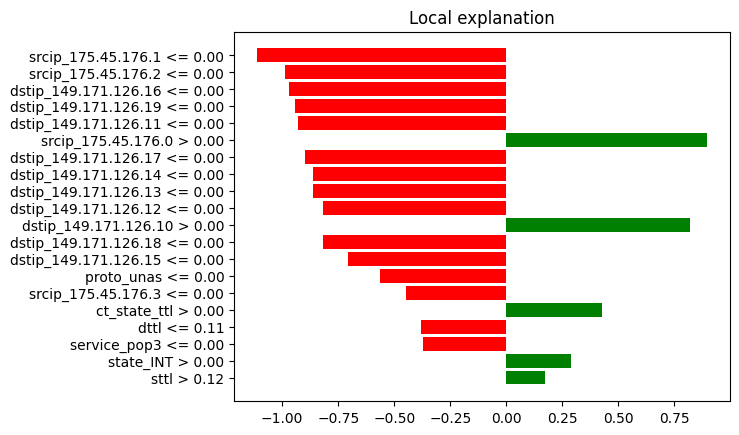

In [ ]:
exp.as_pyplot_figure()
# .savefig('outlierLIME2.png')
# files.download("outlierLIME2.png")


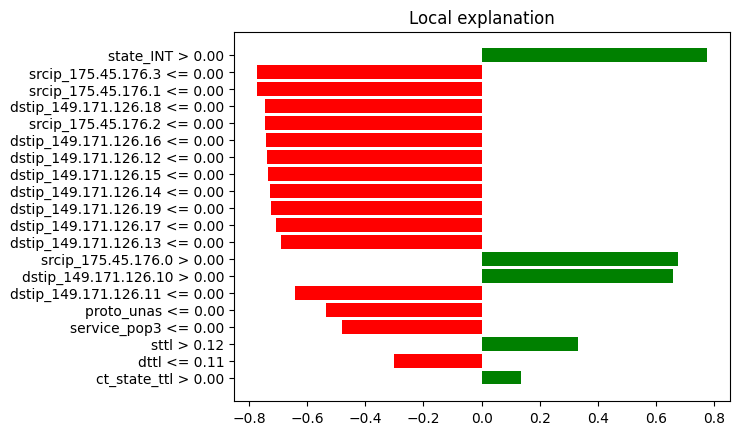

In [ ]:
expVae.as_pyplot_figure()


In [ ]:
explainer.explain_instance(data_row = X_test[high_corr].iloc[limeIndices1[1],:],
                                 predict_fn = predicting_function,
                                 num_features=5)
exp.show_in_notebook(show_table = True)


157/157 [==============================] - 0s 1ms/step
Intercept 2.6787076934473553
Prediction_local [1.82923706]
Right: 1.6174032451682903


In [ ]:
#Save most relevant features for decision

dictAe = {}

for i in range(250):
  exp = explainer.explain_instance(data_row = X_test[high_corr].iloc[i,:],
                                 predict_fn = predicting_function,
                                 num_features = 10)
  for j in range(len(exp.as_list())):
    row = exp.as_list()[j]
    feature = row[0]
    value = row[1]
    if feature not in dictAe:
      dictAe[feature] = [value]
    else:
      dictAe[feature] += [value]


tryy = pd.DataFrame(list(dictAe.values()), index=dictAe.keys()).transpose()
tryy = tryy.reset_index()
tryy = tryy.drop(['index'], axis=1)
tryy = pd.melt(tryy)
tryy = tryy.dropna()

fig, ax = plt.subplots(figsize=(10,8))
g = sn.swarmplot(y="variable", x="value", data=tryy, ax = ax, linewidth = 0.1, color = "red", size = 3.5, edgecolor = "black")

In [ ]:
#Get indices of detected anomalies, normal data

AElabel0 = [i for i, x in enumerate(y_label) if x == 0]
AElabel1 = [i for i, x in enumerate(y_label) if x == 1]

In [ ]:
#Save most relevant features for decision in anomalies

dictAE1 = {}

for i in AElabel1[:150]:
  exp = explainer.explain_instance(data_row = X_test[high_corr].iloc[i,:],
                                 predict_fn = predicting_function,
                                 num_features = 10)

  for j in range(len(exp.as_list())):
    row = exp.as_list()[j]
    feature = row[0]
    value = row[1]
    if feature not in dictAE1:
      dictAE1[feature] = [value]
    else:
      dictAE1[feature] += [value]




78.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
36.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
69.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
68.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
64.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
71.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
60.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
35.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
61.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
60.0% of the points cannot be placed; you may want to d

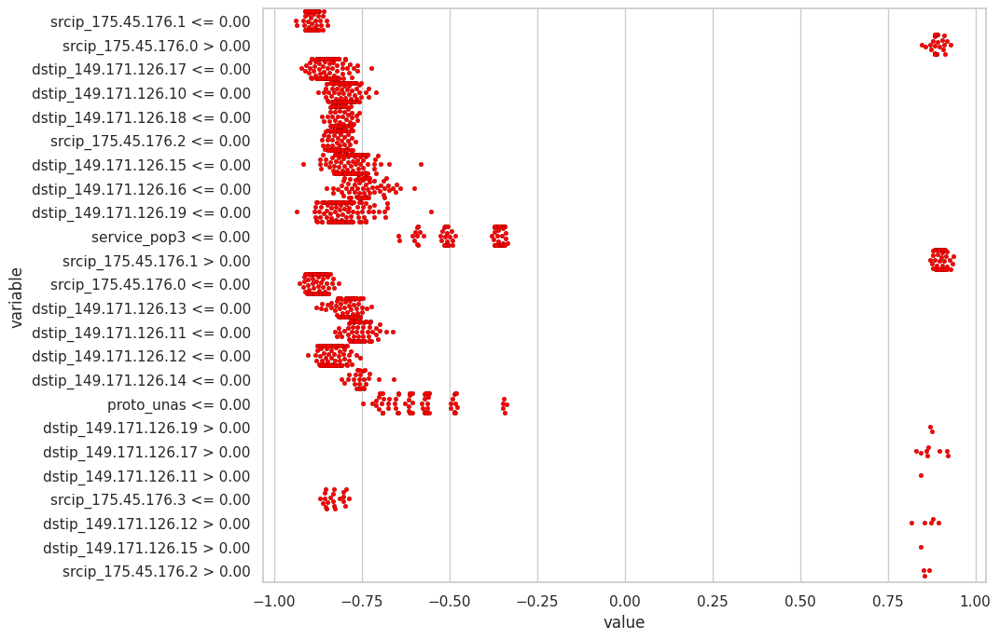

In [ ]:
#Plot

tryy = pd.DataFrame(list(dictAE1.values()), index=dictAE1.keys()).transpose()
tryy = tryy.reset_index()
tryy = tryy.drop(['index'], axis=1)
tryy = pd.melt(tryy)
tryy = tryy.dropna()

fig, ax = plt.subplots(figsize=(10,8))
g = sn.swarmplot(y="variable", x="value", data=tryy, ax = ax, linewidth = 0.1, color = "red", size = 3.5, edgecolor = "black")

157/157 [==============================] - 0s 1ms/step
Intercept 7.511574633944207
Prediction_local [0.25806253]
Right: 0.22893496525950027
157/157 [==============================] - 0s 1ms/step
Intercept 7.112158741293707
Prediction_local [0.2701871]
Right: 0.1641776868720092
157/157 [==============================] - 0s 1ms/step
Intercept 7.589507804094258
Prediction_local [0.24391381]
Right: 0.6234214931594365
157/157 [==============================] - 0s 1ms/step
Intercept 7.298405532297396
Prediction_local [0.24598216]
Right: 0.17898091304003058
157/157 [==============================] - 0s 1ms/step
Intercept 7.252982102365384
Prediction_local [0.25763218]
Right: 1.6792902012559212
157/157 [==============================] - 0s 1ms/step
Intercept 7.361150780422082
Prediction_local [0.24988183]
Right: 0.13771399002504298
157/157 [==============================] - 0s 1ms/step
Intercept 7.268980411024801
Prediction_local [0.25244133]
Right: 0.15147012196062024
157/157 [===============

85.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
75.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
78.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
75.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
77.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
59.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
67.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
44.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
56.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
71.9% of the points cannot be placed; you may want to d

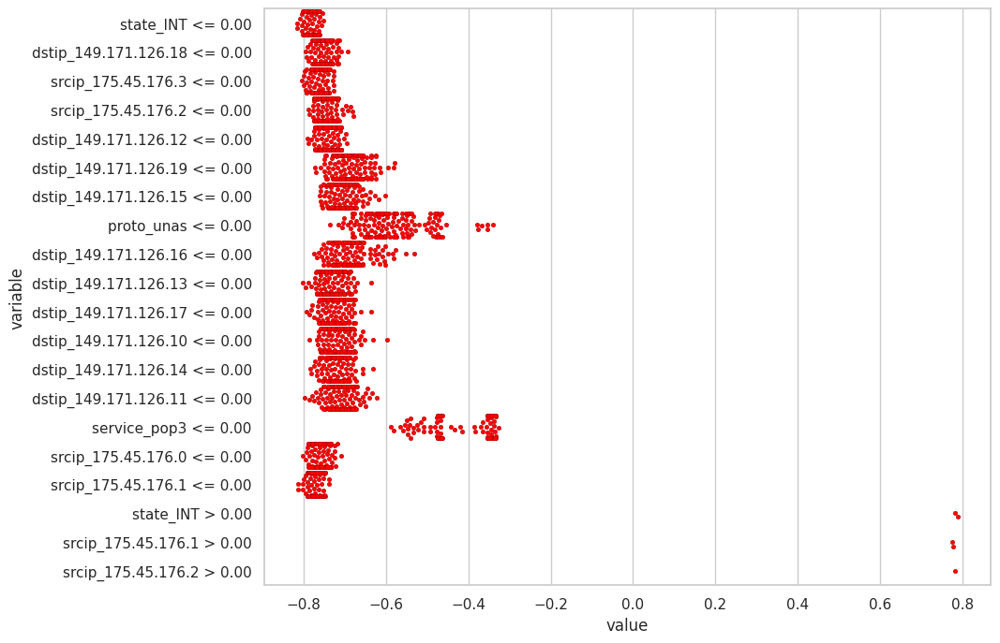

In [ ]:
#Same as above, for VAE

dictVAe = {}

for i in range(250):
  expVae = explainer.explain_instance(data_row = X_test[high_corr].iloc[i,:],
                                 predict_fn = predicting_function_vae,
                                 num_features = 10)
  for j in range(len(expVae.as_list())):
    row = expVae.as_list()[j]
    feature = row[0]
    value = row[1]
    if feature not in dictVAe:
      dictVAe[feature] = [value]
    else:
      dictVAe[feature] += [value]



tryy = pd.DataFrame(list(dictVAe.values()), index=dictVAe.keys()).transpose()
tryy = tryy.reset_index()
tryy = tryy.drop(['index'], axis=1)
tryy = pd.melt(tryy)
tryy = tryy.dropna()

fig, ax = plt.subplots(figsize=(10,8))
g = sn.swarmplot(y="variable", x="value", data=tryy, ax = ax, linewidth = 0.1, color = "red", size = 3.5, edgecolor = "black")

157/157 [==============================] - 0s 1ms/step
Intercept 6.315412787468435
Prediction_local [1.02251658]
Right: 1.6792902012559212
157/157 [==============================] - 0s 1ms/step
Intercept 5.925355802310704
Prediction_local [1.80870402]
Right: 1.9828711575624585
157/157 [==============================] - 0s 1ms/step
Intercept 6.898813499103032
Prediction_local [1.05242727]
Right: 1.6763343394447034
157/157 [==============================] - 0s 1ms/step
Intercept 7.345837167638286
Prediction_local [0.25764294]
Right: 1.710660123459264
157/157 [==============================] - 0s 1ms/step
Intercept 7.203787447267253
Prediction_local [0.26481712]
Right: 1.8909720970884911
157/157 [==============================] - 0s 1ms/step
Intercept 6.2953942558156
Prediction_local [1.05008314]
Right: 1.981204648110164
157/157 [==============================] - 0s 1ms/step
Intercept 6.76523731083645
Prediction_local [1.06978461]
Right: 1.889343508152847
157/157 [========================

82.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
67.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
71.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
61.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
64.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
58.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
63.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
43.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
51.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
52.4% of the points cannot be placed; you may want to d

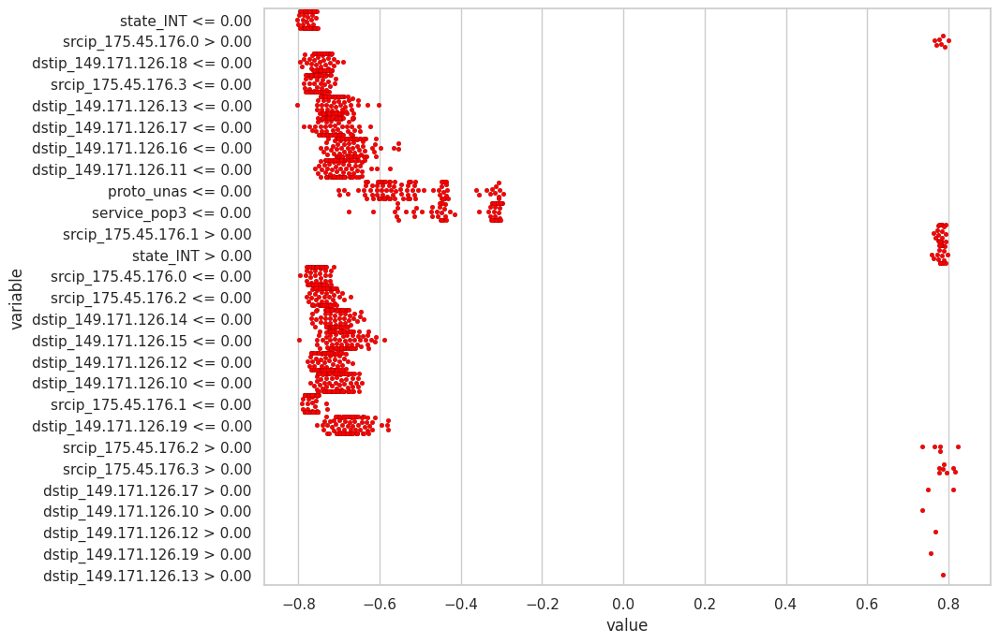

In [ ]:
VAElabel0 = [i for i, x in enumerate(y_labelVae) if x == 0]
VAElabel1 = [i for i, x in enumerate(y_labelVae) if x == 1]

dictVAE1 = {}

for i in VAElabel1[:150]:
  expVae = explainer.explain_instance(data_row = X_test[high_corr].iloc[i,:],
                                 predict_fn = predicting_function_vae,
                                 num_features = 10)

  for j in range(len(expVae.as_list())):
    row = expVae.as_list()[j]
    feature = row[0]
    value = row[1]
    if feature not in dictVAE1:
      dictVAE1[feature] = [value]
    else:
      dictVAE1[feature] += [value]

tryy = pd.DataFrame(list(dictVAE1.values()), index=dictVAE1.keys()).transpose()
tryy = tryy.reset_index()
tryy = tryy.drop(['index'], axis=1)
tryy = pd.melt(tryy)
tryy = tryy.dropna()

fig, ax = plt.subplots(figsize=(10,8))
g = sn.swarmplot(y="variable", x="value", data=tryy, ax = ax, linewidth = 0.1, color = "red", size = 3.5, edgecolor = "black")

#SHAP

In [ ]:
#Sample values
explainerShap = shap.KernelExplainer(predicting_function, X_train[high_corr].sample(100).values)

4/4 [==============================] - 0s 3ms/step


In [ ]:
#Sample values

explainerShapVae = shap.KernelExplainer(predicting_function_vae, X_train[high_corr].sample(100).values)

4/4 [==============================] - 0s 3ms/step


In [ ]:
shap_values = explainerShap.shap_values(X_test[high_corr].iloc[:250].to_numpy()) ##took 1h 36 minutes for sample = 100, 250 first values of X_test

  0%|          | 0/250 [00:00<?, ?it/s]

6488/6488 [==============================] - 11s 2ms/step


In [ ]:
shap_valuesVae = explainerShapVae.shap_values(X_test[high_corr].iloc[:250].to_numpy()) ##took 1h 36 minutes for sample = 100, 250 first values of X_test

  0%|          | 0/250 [00:00<?, ?it/s]

6513/6513 [==============================] - 13s 2ms/step


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

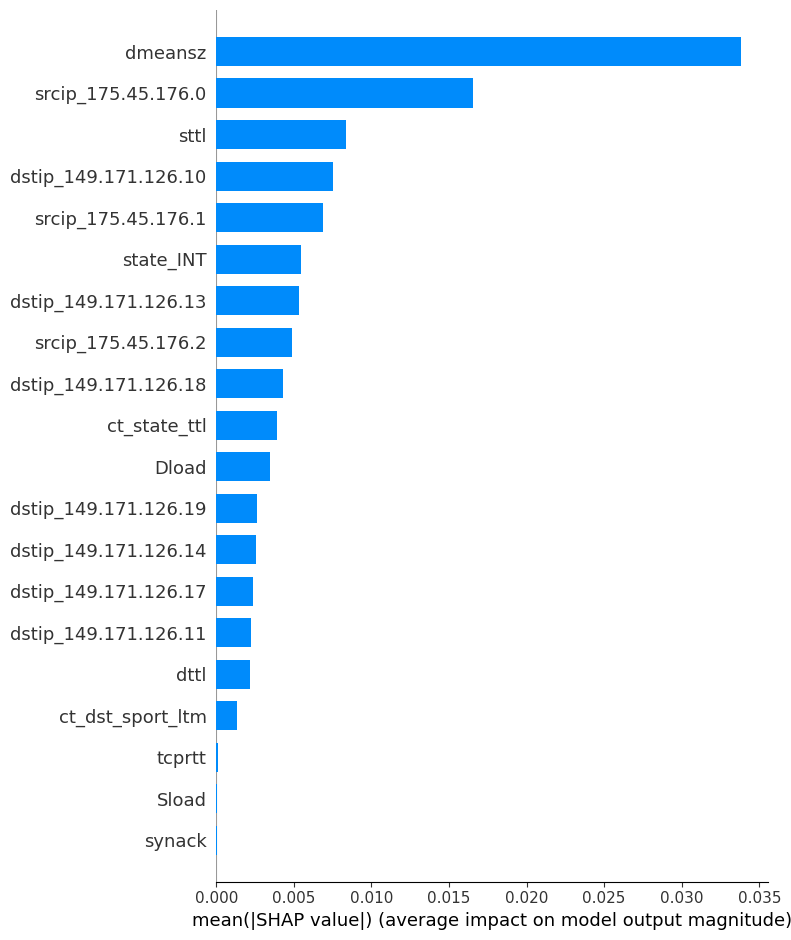

In [ ]:
#Plot
shap.initjs()
fig4=plt.gcf()

shap.summary_plot(shap_values, plot_type = 'bar', feature_names = high_corr,
                  show = False)

plt.savefig('shapBar.png')
files.download("shapBar.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

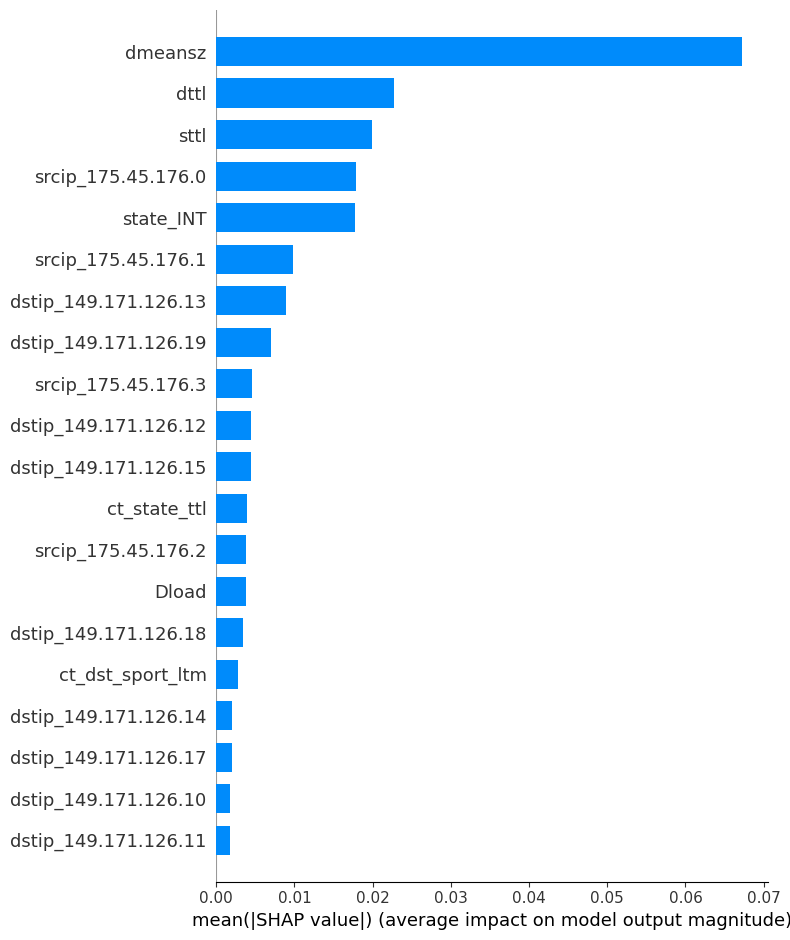

In [ ]:
#Plot

shap.initjs()
fig3=plt.gcf()

shap.summary_plot(shap_valuesVae, plot_type = 'bar', feature_names = high_corr,
                  show = False)

plt.savefig('shapBarVae.png')
files.download("shapBarVae.png")

In [ ]:
#Plot

shap.initjs()
fig1=plt.gcf()
shap.summary_plot(shap_values = shap_values,
                  features = X_test[high_corr].iloc[:250],
                  feature_names = high_corr,
                  show = False)
plt.savefig('shapScatternew.png')
files.download("shapScatternew.png")


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

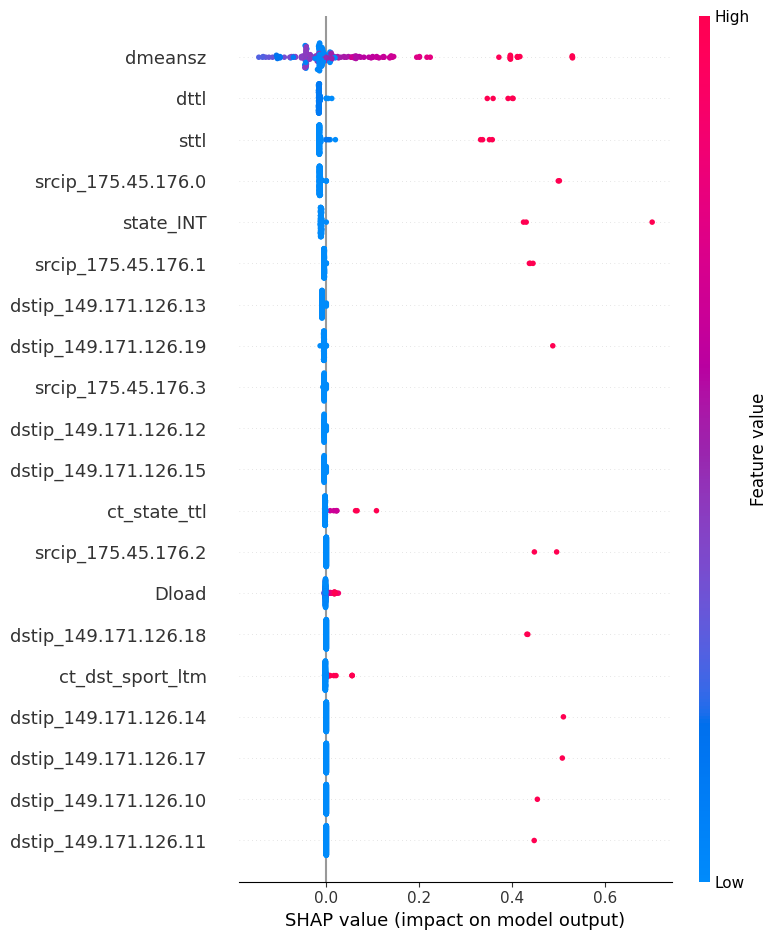

In [ ]:
#Plot

shap.initjs()
fig2=plt.gcf()
shap.summary_plot(shap_values = shap_valuesVae,
                  features = X_test[high_corr].iloc[:250],
                  feature_names = high_corr,
                  show = False)
plt.savefig('shapScatterVae.png')
files.download("shapScatterVae.png")

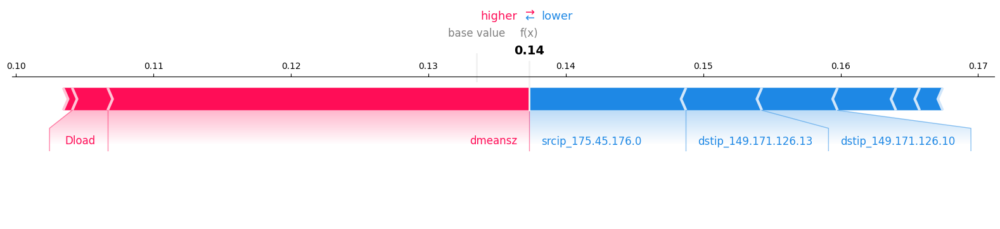

In [ ]:
#Plot


# shap.initjs()
# fig=plt.gcf()
shap.force_plot(explainerShap.expected_value, shap_values[3], features = high_corr,
                show = False, matplotlib=True )
# plt.savefig("individualShap.png")
# files.download("individualShap.png")

# The base value is the average value of the target variable across all the records.
# Each stripe shows the impact of its feature in pushing the value of the target variable
# farther or closer to the base value. Red stripes show that their features push the
# value towards higher values. Blue stripes show that their features push the value
# towards lower values. The wider a stripe, the higher (in absolute value) the contribution.
# The sum of these contributions pushes the value of the target variable from
#  the vase value to the final, predicted value.


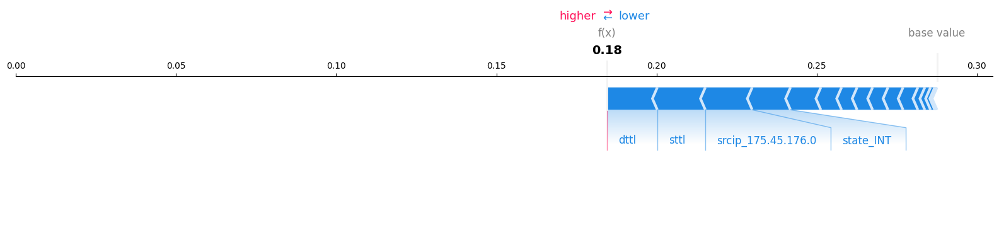

In [ ]:
#Plot


# shap.initjs()
# fig=plt.gcf()
shap.force_plot(explainerShapVae.expected_value, shap_valuesVae[3], features = high_corr,
                show = False, matplotlib=True )
# plt.savefig("individualShap.png")
# files.download("individualShap.png")


#Other datasets

##UNSW-NB15 (2)

In [ ]:
nb15_2 = pd.read_csv('/content/drive/MyDrive/UNSW-NB15_2.csv', names = col_names)

<ipython-input-64-fa33ce592d77>:1: DtypeWarning: Columns (3,39,47) have mixed types. Specify dtype option on import or set low_memory=False.
  nb15_2 = pd.read_csv('/content/drive/MyDrive/UNSW-NB15_2.csv', names = col_names)


In [ ]:
# Duration
nb15_2['duration'] = nb15_2['Ltime'] - nb15_2['Stime']
nb15_2 = nb15_2.drop(nb15_2[nb15_2['duration'] < 0].index)


# Transform hexadecimal to numbers
for i in ["sport", "dsport"]:
  wrong = nb15_2.loc[~nb15_2[i].astype(str).str.isdigit(), i].tolist()
  unique_wrong = np.unique(wrong)
  unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == '-'))
  nb15_2 = nb15_2.drop(nb15_2[nb15_2[i] == '-'].index)
  for change in unique_wrong:
    nb15_2[i] = np.where(nb15_2[i] == change, int(change, 16), nb15_2[i])


# Transform to numeric
nb15_2['dsport'] = pd.to_numeric(nb15_2['dsport'])
nb15_2['sport'] = pd.to_numeric(nb15_2['sport'])

# Remove duplicates
print("Duplicates: ", nb15_2.duplicated().sum())
nb15_2 = nb15_2.drop_duplicates()
print("Duplicates now:",nb15_2.duplicated().sum())

<ipython-input-65-3829daf7ba24>:10: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == '-'))


Duplicates:  63248
Duplicates now: 0


In [ ]:
# x = nb15_2[num_cols]
# for col in x.columns:
#   print(col)
#   y = x[col].astype(str).values.tolist()
#   wrong_vals = [elem for elem in y if not str(elem).isdigit()]
#   print(np.unique(wrong_vals))
#   print(len(wrong_vals))

In [ ]:
# for i in ["ct_ftp_cmd"]:
#   wrong = df_original.loc[~df_original[i].astype(str).str.isdigit(), i].tolist()
#   unique_wrong = np.unique(wrong)
#   unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == ' '))
nb15_2 = nb15_2.drop(nb15_2[nb15_2["ct_ftp_cmd"] == ' '].index)


# Transform to numeric
# df_clean['ct_ftp_cmd'] = pd.to_numeric(df_clean['ct_ftp_cmd'])
# df_clean['sport'] = pd.to_numeric(df_clean['sport'])

In [ ]:
#onehot enconding
sep = ""
for col in ["proto", "state", "service", "srcip", "dstip"]:
    new = nb15_2[col].str.get_dummies().add_prefix(sep.join([col, "_"]))
    nb15_2 = pd.concat([nb15_2, new], axis=1)

#normalisation
nb15_2[num_cols] = scaler.fit_transform(nb15_2[num_cols])

# Drop columns
nb15_2 = nb15_2.drop(labels=["Ltime", "Stime"], axis = 1)
nb15_2 = nb15_2.drop(labels=["attack_cat"], axis = 1)
nb15_2 = nb15_2.drop(labels = ["proto", "state", "service"], axis = 1)
nb15_2 = nb15_2.drop(labels = ["srcip", "dstip"], axis = 1)

In [ ]:
#add missing columns
nb15_2['service_pop3'] = 0
nb15_2['proto_unas'] = 0

###Autoencoder

In [ ]:
score2 = autoencoder.evaluate(nb15_2[high_corr], nb15_2[high_corr], verbose = 1)
print("Test loss:", score2[0])
print("Test MAE:", score2[1])
print("Test accuracy:", score2[2])

12124/12124 [==============================] - 20s 2ms/step - loss: 5.8743e-04 - mae: 0.0189 - accuracy: 0.9777
Test loss: 0.0005874265334568918
Test MAE: 0.018927667289972305
Test accuracy: 0.9777469038963318


In [ ]:
y_pred2 = autoencoder.predict(nb15_2[high_corr])
y_dist2 = np.linalg.norm(nb15_2[high_corr] - y_pred2, axis = -1)

z2 = zip(y_dist2 >= threshold, y_dist2)
y_label2 = []
error2 = []
for idx, (is_anomaly, y_dist) in enumerate(z2):
  if is_anomaly:
    y_label2.append(1)
  else:
    y_label2.append(0)
  error2.append(y_dist)

12124/12124 [==============================] - 19s 2ms/step


In [ ]:
print(classification_report(nb15_2['Label'], y_label2))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    387679
           1       0.80      1.00      0.89       267

    accuracy                           1.00    387946
   macro avg       0.90      1.00      0.94    387946
weighted avg       1.00      1.00      1.00    387946



In [ ]:
print("Recall",sklearn.metrics.recall_score(nb15_2['Label'], y_label2))
print("Precision",sklearn.metrics.precision_score(nb15_2['Label'], y_label2))
print("F1 score", sklearn.metrics.f1_score(nb15_2['Label'], y_label2))
print("ROC: ", roc_auc_score(nb15_2['Label'], y_label2))

Recall 1.0
Precision 0.7994011976047904
F1 score 0.8885191347753745
ROC:  0.9999135883037256


In [ ]:
print("ROC:", roc_auc_score(nb15_2['Label'], y_label2))
print("Recall: ", recall(nb15_2['Label'], y_label2))
print("Precision: ", precision(nb15_2['Label'], y_label2))
print("F1 score: ", f1_score(nb15_2['Label'], y_label2))

ROC: 0.9999135883037256
Recall:  0.999827176607451
Precision:  1.0
F1 score:  0.9999135808360989


In [ ]:
threshold

1.353

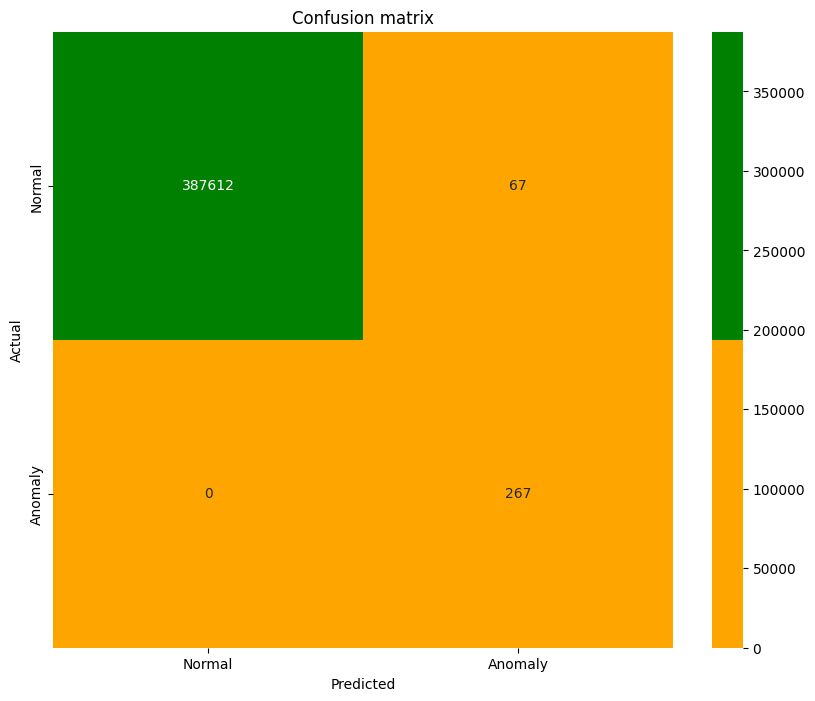

In [ ]:
viz.draw_confusion_matrix(nb15_2['Label'], y_label2)

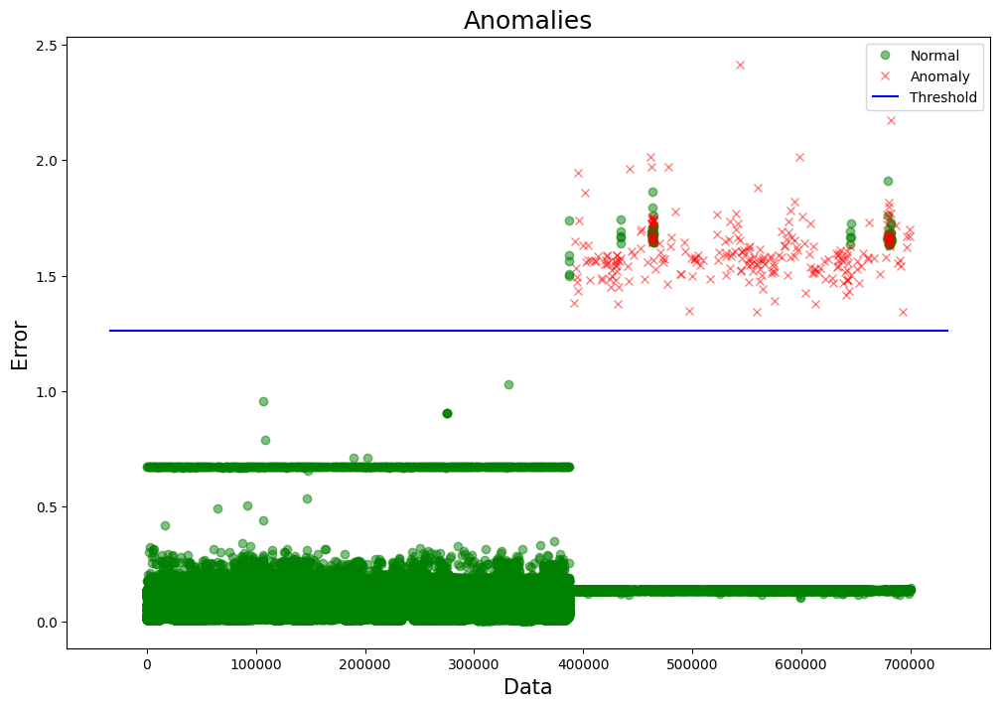

In [ ]:
viz.draw_anomaly(nb15_2['Label'], error2, threshold)

###Variational Autoencoder

In [ ]:
score2vae = vae.evaluate(nb15_2[high_corr], nb15_2[high_corr], verbose = 1)
print("Test loss:", score2vae[0])
print("Test MAE:", score2vae[1])
print("Test accuracy:", score2vae[2])

12124/12124 [==============================] - 23s 2ms/step - loss: 0.0703 - mae: 0.0101 - accuracy: 0.4320
Test loss: 0.07033754885196686
Test MAE: 0.01013962272554636
Test accuracy: 0.4320163130760193


In [ ]:
y_pred2_vae = vae.predict(nb15_2[high_corr])
y_dist2_vae = np.linalg.norm(nb15_2[high_corr] - y_pred2_vae, axis = -1)

z2vae = zip(y_dist2_vae >= thresholdVae, y_dist2_vae)
y_label2Vae = []
error2vae = []
for idx, (is_anomaly, y_dist) in enumerate(z2vae):
  if is_anomaly:
    y_label2Vae.append(1)
  else:
    y_label2Vae.append(0)
  error2vae.append(y_dist)

12124/12124 [==============================] - 20s 2ms/step


In [ ]:
print(thresholdVae)

1.677


In [ ]:
print("Recall",sklearn.metrics.recall_score(nb15_2['Label'], y_label2Vae))
print("Precision",sklearn.metrics.precision_score(nb15_2['Label'], y_label2Vae))
print("F1 score", sklearn.metrics.f1_score(nb15_2['Label'], y_label2Vae))
print("ROC: ", roc_auc_score(nb15_2['Label'], y_label2Vae))

Recall 1.0
Precision 0.7994011976047904
F1 score 0.8885191347753745
ROC:  0.9999135883037256


In [ ]:
print(classification_report(nb15_2['Label'], y_label2Vae))
print("ROC:", roc_auc_score(nb15_2['Label'], y_label2Vae))
print("Recall: ", recall(nb15_2['Label'], y_label2Vae))
print("Precision: ", precision(nb15_2['Label'], y_label2Vae))
print("F1 score: ", f1_score(nb15_2['Label'], y_label2Vae))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    387679
           1       0.80      1.00      0.89       267

    accuracy                           1.00    387946
   macro avg       0.90      1.00      0.94    387946
weighted avg       1.00      1.00      1.00    387946

ROC: 0.9999135883037256
Recall:  0.999827176607451
Precision:  1.0
F1 score:  0.9999135808360989


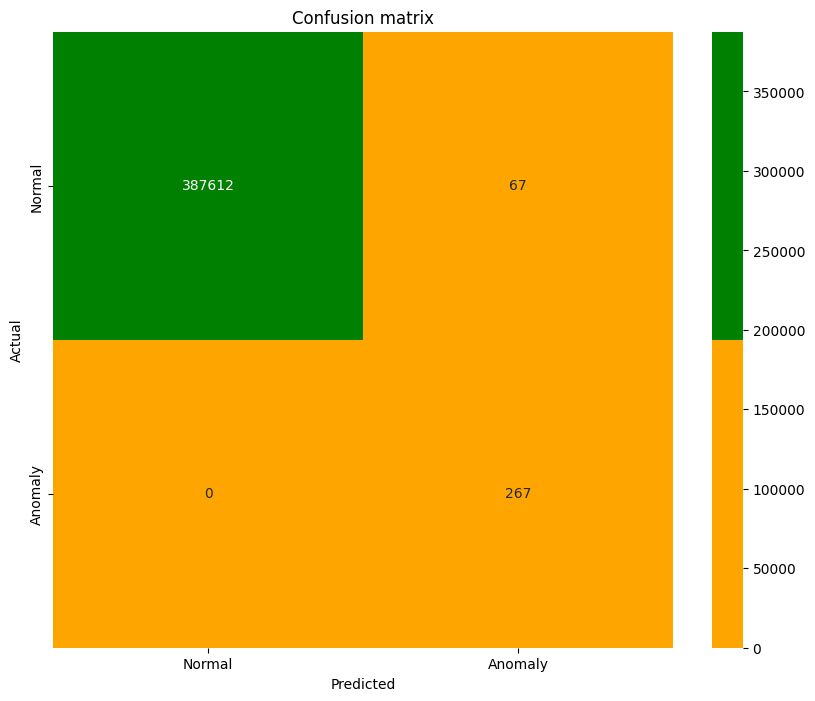

In [ ]:
viz.draw_confusion_matrix(nb15_2['Label'], y_label2Vae)

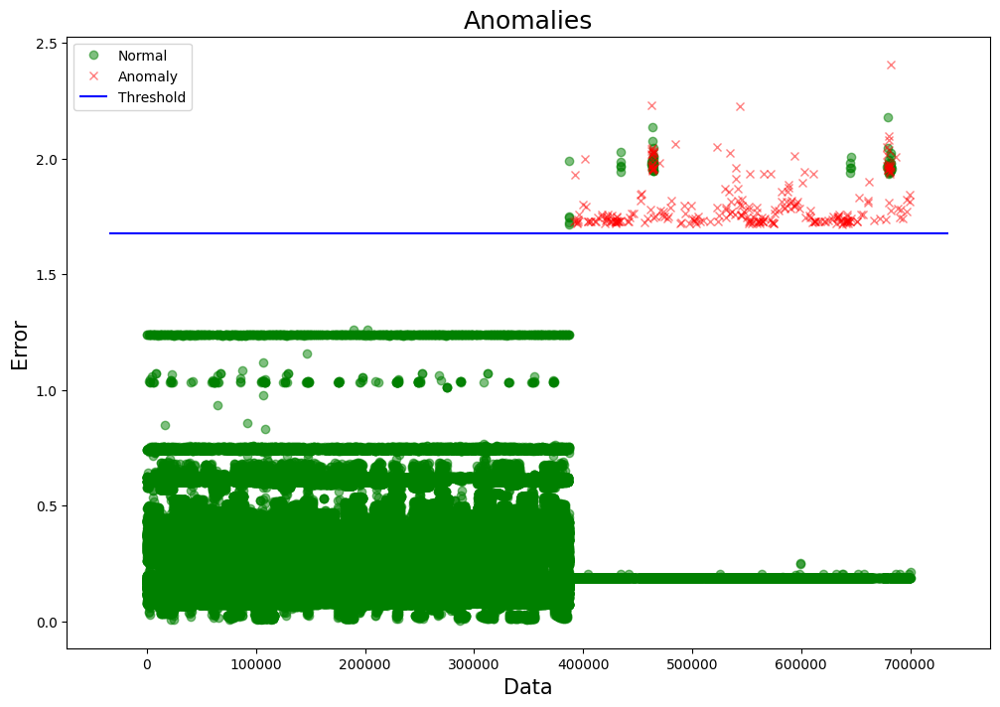

In [ ]:
viz.draw_anomaly(nb15_2['Label'], error2vae, thresholdVae)

In [ ]:
del nb15_2

##UNSW-NB15 (3)

In [ ]:
nb15_3 = pd.read_csv('/content/drive/MyDrive/UNSW-NB15_3.csv', names = col_names)

In [ ]:
# Duration
nb15_3['duration'] = nb15_3['Ltime'] - nb15_3['Stime']
nb15_3 = nb15_3.drop(nb15_3[nb15_3['duration'] < 0].index)


# Transform hexadecimal to numbers
for i in ["sport", "dsport"]:
  wrong = nb15_3.loc[~nb15_3[i].astype(str).str.isdigit(), i].tolist()
  unique_wrong = np.unique(wrong)
  unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == '-'))
  nb15_3 = nb15_3.drop(nb15_3[nb15_3[i] == '-'].index)
  for change in unique_wrong:
    nb15_3[i] = np.where(nb15_3[i] == change, int(change, 16), nb15_3[i])


# Transform to numeric
nb15_3['dsport'] = pd.to_numeric(nb15_3['dsport'])
nb15_3['sport'] = pd.to_numeric(nb15_3['sport'])

# Remove duplicates
print("Duplicates: ", nb15_3.duplicated().sum())
nb15_3 = nb15_3.drop_duplicates()
print("Duplicates now:",nb15_3.duplicated().sum())

<ipython-input-77-e031f3e9787e>:10: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == '-'))


Duplicates:  224843
Duplicates now: 0


In [ ]:
# x = nb15_3[num_cols]
# for col in x.columns:
#   print(col)
#   y = x[col].astype(str).values.tolist()
#   wrong_vals = [elem for elem in y if not str(elem).isdigit()]
#   print(np.unique(wrong_vals))
#   print(len(wrong_vals))

In [ ]:
num_cols.remove('ct_ftp_cmd')

In [ ]:
# for i in ["ct_ftp_cmd"]:
#   wrong = df_original.loc[~df_original[i].astype(str).str.isdigit(), i].tolist()
#   unique_wrong = np.unique(wrong)
#   unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == ' '))
# nb15_3 = nb15_3.drop(nb15_3[nb15_3["ct_ftp_cmd"] == ' '].index)
nb15_3 = nb15_3.drop(['ct_ftp_cmd'], axis=1) #drop whole column as most observations are missing and is not used in the regression
# Transform to numeric
# df_clean['ct_ftp_cmd'] = pd.to_numeric(df_clean['ct_ftp_cmd'])
# df_clean['sport'] = pd.to_numeric(df_clean['sport'])

In [ ]:
#onehot enconding
sep = ""
for col in ["proto", "state", "service", "srcip", "dstip"]:
    new = nb15_3[col].str.get_dummies().add_prefix(sep.join([col, "_"]))
    nb15_3 = pd.concat([nb15_3, new], axis=1)

#normalisation
nb15_3[num_cols] = scaler.fit_transform(nb15_3[num_cols])

# Drop columns
nb15_3 = nb15_3.drop(labels=["Ltime", "Stime"], axis = 1)
nb15_3 = nb15_3.drop(labels=["attack_cat"], axis = 1)
nb15_3 = nb15_3.drop(labels = ["proto", "state", "service"], axis = 1)
nb15_3 = nb15_3.drop(labels = ["srcip", "dstip"], axis = 1)

###Autoencoder

In [ ]:
score3 = autoencoder.evaluate(nb15_3[high_corr], nb15_3[high_corr], verbose = 1)
print("Test loss:", score3[0])
print("Test MAE:", score3[1])
print("Test accuracy:", score3[2])

14849/14849 [==============================] - 25s 2ms/step - loss: 0.0128 - mae: 0.0326 - accuracy: 0.7366
Test loss: 0.01276587974280119
Test MAE: 0.03264257684350014
Test accuracy: 0.7365697026252747


In [ ]:
y_pred3 = autoencoder.predict(nb15_3[high_corr])
y_dist3 = np.linalg.norm(nb15_3[high_corr] - y_pred3, axis = -1)

z3 = zip(y_dist3 >= threshold, y_dist3)
y_label3 = []
error3 = []
for idx, (is_anomaly, y_dist) in enumerate(z3):
  if is_anomaly:
    y_label3.append(1)
  else:
    y_label3.append(0)
  error3.append(y_dist)

14849/14849 [==============================] - 22s 1ms/step


In [ ]:
print(threshold)

1.353


In [ ]:
print("Recall",sklearn.metrics.recall_score(nb15_3['Label'], y_label3))
print("Precision",sklearn.metrics.precision_score(nb15_3['Label'], y_label3))
print("F1 score", sklearn.metrics.f1_score(nb15_3['Label'], y_label3))
print("ROC: ", roc_auc_score(nb15_3['Label'], y_label3))

Recall 0.9983964569334148
Precision 0.7173161677303732
F1 score 0.8348320226452841
ROC:  0.9814658770775317


In [ ]:
print(classification_report(nb15_3['Label'], y_label3))
print("ROC:", roc_auc_score(nb15_3['Label'], y_label3))
print("Recall: ", recall(nb15_3['Label'], y_label3))
print("Precision: ", precision(nb15_3['Label'], y_label3))
print("F1 score: ", f1_score(nb15_3['Label'], y_label3))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98    435870
           1       0.72      1.00      0.83     39288

    accuracy                           0.97    475158
   macro avg       0.86      0.98      0.91    475158
weighted avg       0.98      0.97      0.97    475158

ROC: 0.9814658770775317
Recall:  0.9645352972216487
Precision:  0.9998501694512159
F1 score:  0.9818752955876429


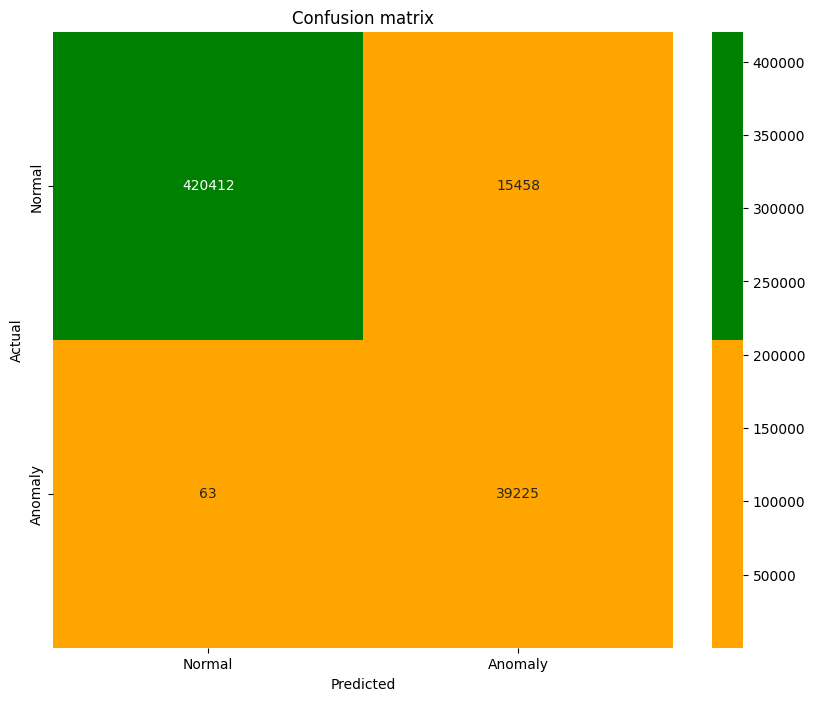

In [ ]:
viz.draw_confusion_matrix(nb15_3['Label'], y_label3)

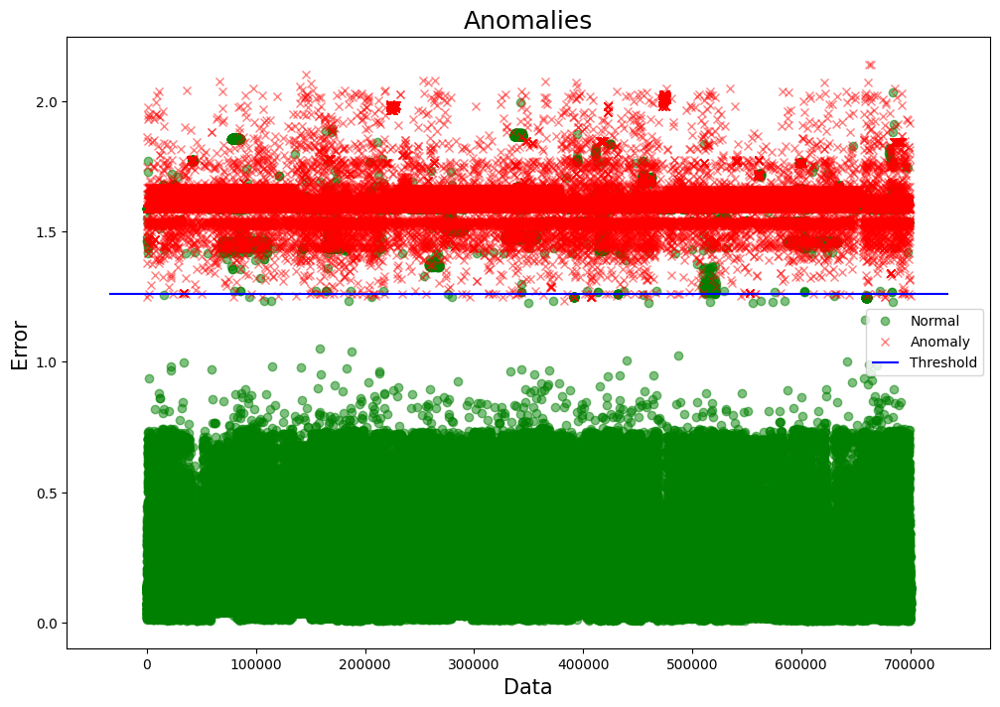

In [ ]:
viz.draw_anomaly(nb15_3['Label'], error3, threshold)

###Variational autoencoder

In [ ]:
score3vae = vae.evaluate(nb15_3[high_corr], nb15_3[high_corr], verbose = 1)
print("Test loss:", score3vae[0])
print("Test MAE:", score3vae[1])
print("Test accuracy:", score3vae[2])

14849/14849 [==============================] - 30s 2ms/step - loss: 0.5537 - mae: 0.0302 - accuracy: 0.2802
Test loss: 0.5537160038948059
Test MAE: 0.03024091199040413
Test accuracy: 0.2801762819290161


In [ ]:
y_pred3_vae = vae.predict(nb15_3[high_corr])
y_dist3_vae = np.linalg.norm(nb15_3[high_corr] - y_pred3_vae, axis = -1)

z3vae = zip(y_dist3_vae >= thresholdVae, y_dist3_vae)
y_label3Vae = []
error3vae = []
for idx, (is_anomaly, y_dist) in enumerate(z3vae):
  if is_anomaly:
    y_label3Vae.append(1)
  else:
    y_label3Vae.append(0)
  error3vae.append(y_dist)

14849/14849 [==============================] - 24s 2ms/step


In [ ]:
print(thresholdVae)

1.677


In [ ]:
print("Recall",sklearn.metrics.recall_score(nb15_3['Label'], y_label3Vae))
print("Precision",sklearn.metrics.precision_score(nb15_3['Label'], y_label3Vae))
print("F1 score", sklearn.metrics.f1_score(nb15_3['Label'], y_label3Vae))
print("ROC: ", roc_auc_score(nb15_3['Label'], y_label3Vae))

Recall 0.9929240480553859
Precision 0.7119392634230025
F1 score 0.8292765885078973
ROC:  0.9783557079242675


In [ ]:
print(classification_report(nb15_3['Label'], y_label3Vae))
print("ROC:", roc_auc_score(nb15_3['Label'], y_label3Vae))
print("Recall: ", recall(nb15_3['Label'], y_label3Vae))
print("Precision: ", precision(nb15_3['Label'], y_label3Vae))
print("F1 score: ", f1_score(nb15_3['Label'], y_label3Vae))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98    435870
           1       0.71      0.99      0.83     39288

    accuracy                           0.97    475158
   macro avg       0.86      0.98      0.91    475158
weighted avg       0.98      0.97      0.97    475158

ROC: 0.9783557079242675
Recall:  0.9637873677931493
Precision:  0.9993386683921553
F1 score:  0.9812411093229187


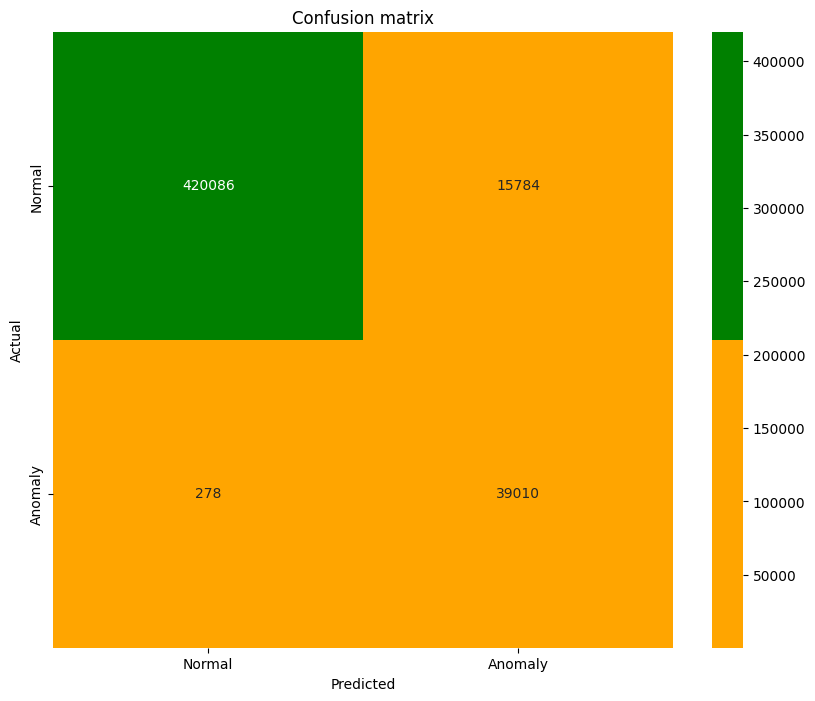

In [ ]:
viz.draw_confusion_matrix(nb15_3['Label'], y_label3Vae)

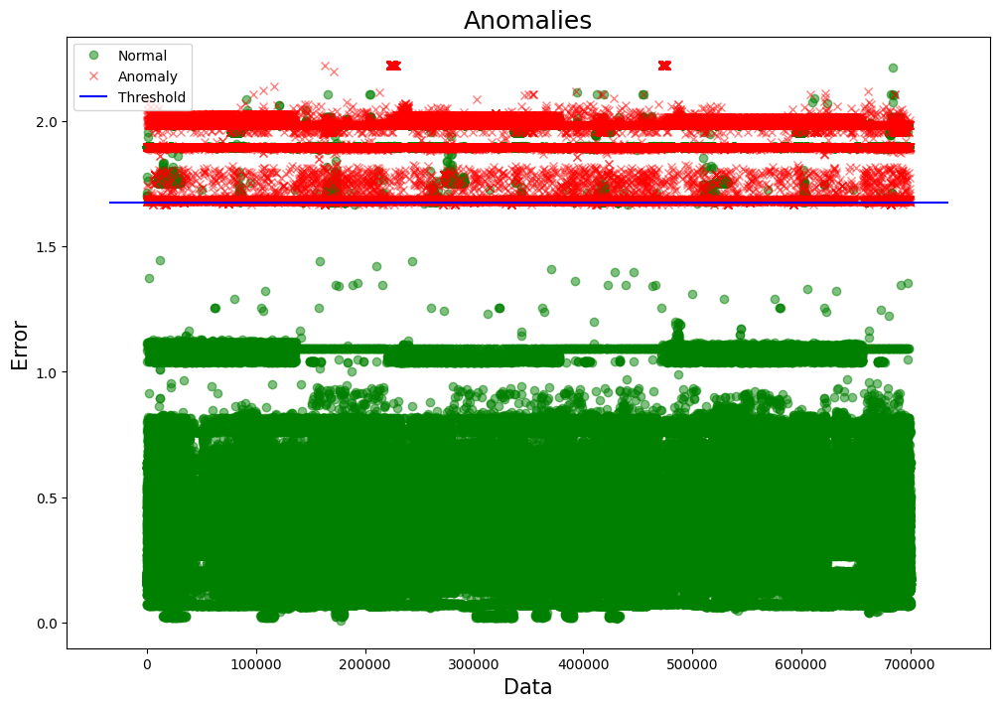

In [ ]:
viz.draw_anomaly(nb15_3['Label'], error3vae, thresholdVae)

In [ ]:
del nb15_3

##UNSW-NB15 (4)

In [ ]:
nb15_4 = pd.read_csv('/content/drive/MyDrive/UNSW-NB15_4.csv', names = col_names)

In [ ]:
# Duration
nb15_4['duration'] = nb15_4['Ltime'] - nb15_4['Stime']
nb15_4 = nb15_4.drop(nb15_4[nb15_4['duration'] < 0].index)


# Transform hexadecimal to numbers
for i in ["sport", "dsport"]:
  wrong = nb15_4.loc[~nb15_4[i].astype(str).str.isdigit(), i].tolist()
  unique_wrong = np.unique(wrong)
  unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == '-'))
  nb15_4 = nb15_4.drop(nb15_4[nb15_4[i] == '-'].index)
  for change in unique_wrong:
    nb15_4[i] = np.where(nb15_4[i] == change, int(change, 16), nb15_4[i])


# Transform to numeric
nb15_4['dsport'] = pd.to_numeric(nb15_4['dsport'])
nb15_4['sport'] = pd.to_numeric(nb15_4['sport'])

# Remove duplicates
print("Duplicates: ", nb15_4.duplicated().sum())
nb15_4 = nb15_4.drop_duplicates()
print("Duplicates now:", nb15_4.duplicated().sum())

<ipython-input-89-41f4f11f195c>:10: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == '-'))


Duplicates:  133325
Duplicates now: 0


In [ ]:
# x = nb15_4[num_cols]
# for col in x.columns:
#   print(col)
#   y = x[col].astype(str).values.tolist()
#   wrong_vals = [elem for elem in y if not str(elem).isdigit()]
#   print(np.unique(wrong_vals))
#   print(len(wrong_vals))

In [ ]:
# for i in ["ct_ftp_cmd"]:
#   wrong = df_original.loc[~df_original[i].astype(str).str.isdigit(), i].tolist()
#   unique_wrong = np.unique(wrong)
#   unique_wrong = np.delete(unique_wrong, np.where(unique_wrong == ' '))
# nb15_3 = nb15_3.drop(nb15_3[nb15_3["ct_ftp_cmd"] == ' '].index)
# nb15_3 = nb15_3.drop(['ct_ftp_cmd'], axis=1) #drop whole column as most observations are missing and is not used in the regression
# Transform to numeric
# df_clean['ct_ftp_cmd'] = pd.to_numeric(df_clean['ct_ftp_cmd'])
# df_clean['sport'] = pd.to_numeric(df_clean['sport'])

In [ ]:
#onehot enconding
sep = ""
for col in ["proto", "state", "service", "srcip", "dstip"]:
    new = nb15_4[col].str.get_dummies().add_prefix(sep.join([col, "_"]))
    nb15_4 = pd.concat([nb15_4, new], axis=1)

#normalisation
nb15_4[num_cols] = scaler.fit_transform(nb15_4[num_cols])

# Drop columns
nb15_4 = nb15_4.drop(labels=["Ltime", "Stime"], axis = 1)
nb15_4 = nb15_4.drop(labels=["attack_cat"], axis = 1)
nb15_4 = nb15_4.drop(labels = ["proto", "state", "service"], axis = 1)
nb15_4 = nb15_4.drop(labels = ["srcip", "dstip"], axis = 1)

###Autoencoder

In [ ]:
score4 = autoencoder.evaluate(nb15_4[high_corr], nb15_4[high_corr], verbose = 1)
print("Test loss:", score4[0])
print("Test MAE:", score4[1])
print("Test accuracy:", score4[2])

9585/9585 [==============================] - 16s 2ms/step - loss: 0.0127 - mae: 0.0329 - accuracy: 0.7342
Test loss: 0.012737966142594814
Test MAE: 0.03285088762640953
Test accuracy: 0.7341638207435608


In [ ]:
y_pred4 = autoencoder.predict(nb15_4[high_corr])
y_dist4 = np.linalg.norm(nb15_4[high_corr] - y_pred4, axis = -1)

z4 = zip(y_dist4 >= threshold, y_dist4)
y_label4 = []
error4 = []
for idx, (is_anomaly, y_dist) in enumerate(z4):
  if is_anomaly:
    y_label4.append(1)
  else:
    y_label4.append(0)
  error4.append(y_dist)

9585/9585 [==============================] - 14s 1ms/step


In [ ]:
print(threshold)

1.353


In [ ]:
print("Recall",sklearn.metrics.recall_score(nb15_4['Label'], y_label4))
print("Precision",sklearn.metrics.precision_score(nb15_4['Label'], y_label4))
print("F1 score", sklearn.metrics.f1_score(nb15_4['Label'], y_label4))
print("ROC: ", roc_auc_score(nb15_4['Label'], y_label4))

Recall 0.9982975016827018
Precision 0.7300576193647392
F1 score 0.8433622102552095
ROC:  0.9825870124894598


In [ ]:
print(classification_report(nb15_4['Label'], y_label4))
print("ROC:", roc_auc_score(nb15_4['Label'], y_label4))
print("Recall: ", recall(nb15_4['Label'], y_label4))
print("Precision: ", precision(nb15_4['Label'], y_label4))
print("F1 score: ", f1_score(nb15_4['Label'], y_label4))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    281462
           1       0.73      1.00      0.84     25257

    accuracy                           0.97    306719
   macro avg       0.86      0.98      0.91    306719
weighted avg       0.98      0.97      0.97    306719

ROC: 0.9825870124894598
Recall:  0.9668765232962176
Precision:  0.9998420174736022
F1 score:  0.9830829919587316


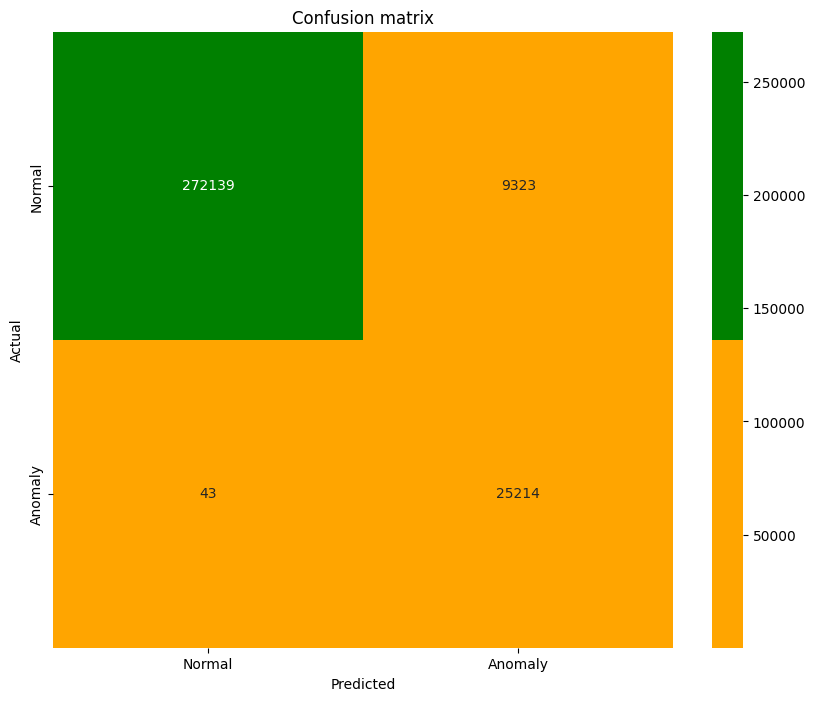

In [ ]:
viz.draw_confusion_matrix(nb15_4['Label'], y_label4)

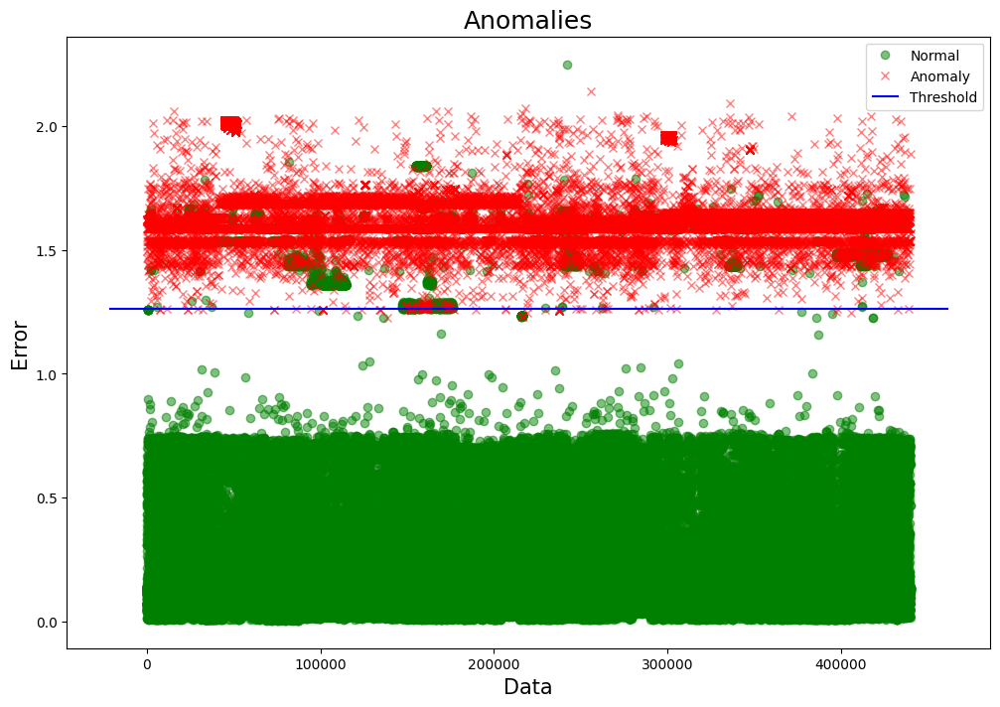

In [ ]:
viz.draw_anomaly(nb15_4['Label'], error4, threshold)

###Variational autoencoder

In [ ]:
score4vae = vae.evaluate(nb15_4[high_corr], nb15_4[high_corr], verbose = 1)
print("Test loss:", score4vae[0])
print("Test MAE:", score4vae[1])
print("Test accuracy:", score4vae[2])

9585/9585 [==============================] - 18s 2ms/step - loss: 0.5482 - mae: 0.0299 - accuracy: 0.2617
Test loss: 0.5481981635093689
Test MAE: 0.029933709651231766
Test accuracy: 0.2617379426956177


In [ ]:
y_pred4_vae = vae.predict(nb15_4[high_corr])
y_dist4_vae = np.linalg.norm(nb15_4[high_corr] - y_pred4_vae, axis = -1)

z4vae = zip(y_dist4_vae >= thresholdVae, y_dist4_vae)
y_label4Vae = []
error4vae = []
for idx, (is_anomaly, y_dist) in enumerate(z4vae):
  if is_anomaly:
    y_label4Vae.append(1)
  else:
    y_label4Vae.append(0)
  error4vae.append(y_dist)

9585/9585 [==============================] - 15s 2ms/step


In [ ]:
print(thresholdVae)

1.677


In [ ]:
print("Recall",sklearn.metrics.recall_score(nb15_4['Label'], y_label4Vae))
print("Precision",sklearn.metrics.precision_score(nb15_4['Label'], y_label4Vae))
print("F1 score", sklearn.metrics.f1_score(nb15_4['Label'], y_label4Vae))
print("ROC: ", roc_auc_score(nb15_4['Label'], y_label4Vae))

Recall 0.9927940768895752
Precision 0.7266852141656523
F1 score 0.8391479678061676
ROC:  0.979643444709221


In [ ]:
print(classification_report(nb15_4['Label'], y_label4Vae))
print("ROC:", roc_auc_score(nb15_4['Label'], y_label4Vae))
print("Recall: ", recall(nb15_4['Label'], y_label4Vae))
print("Precision: ", precision(nb15_4['Label'], y_label4Vae))
print("F1 score: ", f1_score(nb15_4['Label'], y_label4Vae))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98    281462
           1       0.73      0.99      0.84     25257

    accuracy                           0.97    306719
   macro avg       0.86      0.98      0.91    306719
weighted avg       0.98      0.97      0.97    306719

ROC: 0.979643444709221
Recall:  0.9664928125288671
Precision:  0.9993314059210986
F1 score:  0.9826378290513388


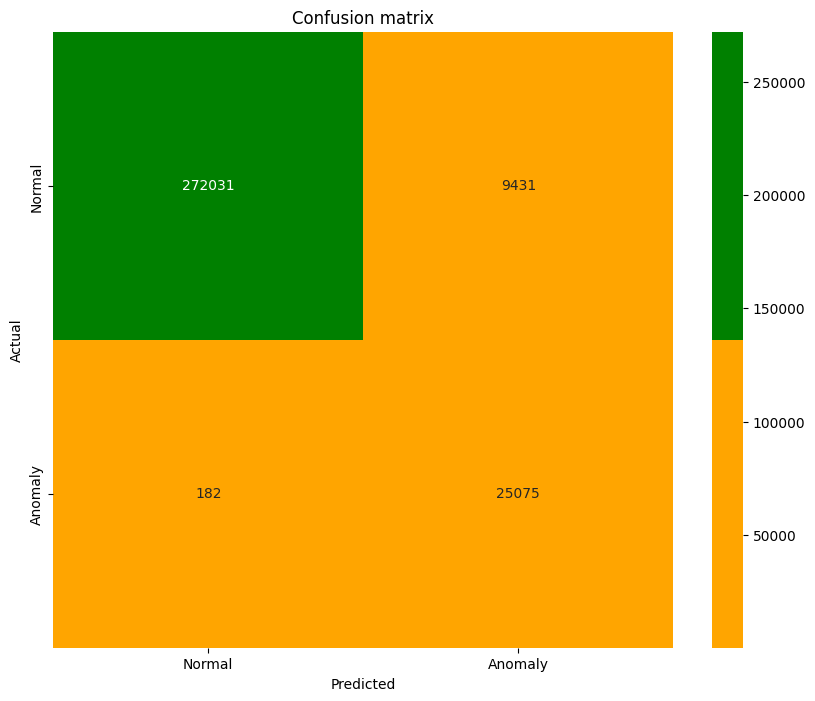

In [ ]:
viz.draw_confusion_matrix(nb15_4['Label'], y_label4Vae)

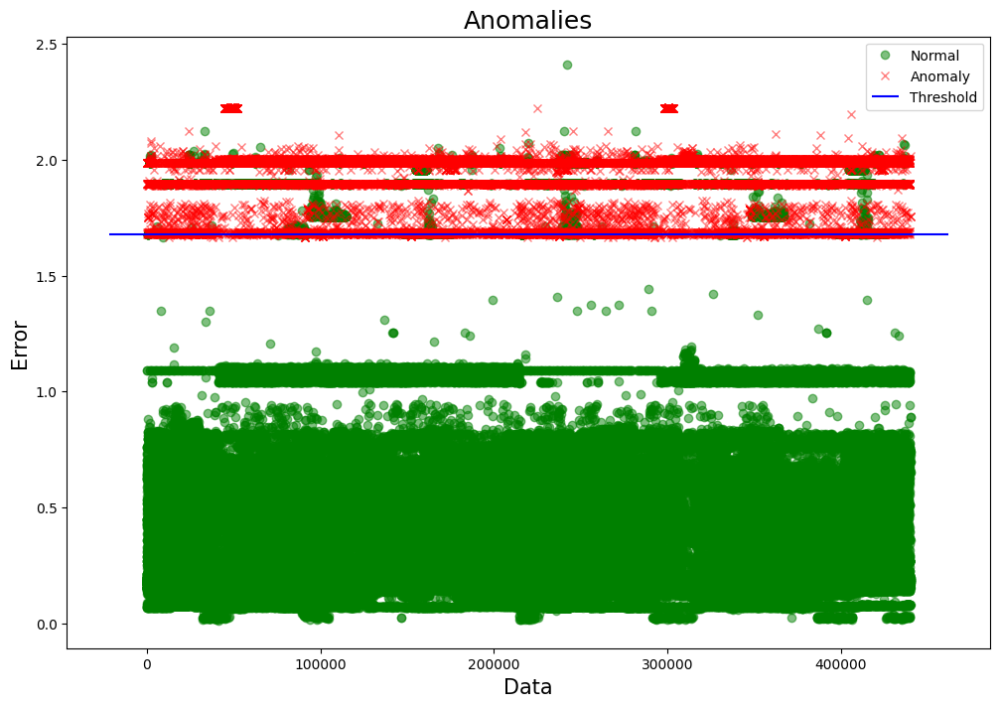

In [ ]:
viz.draw_anomaly(nb15_4['Label'], error4vae, thresholdVae)

#Traditional methods

##Random forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor


In [ ]:
#Gridsearch
estim = [20,50,75,100,200, 500, 800] #12 mins

for i in estim:
  modelRF = RandomForestRegressor(random_state = 42, n_estimators = i)
  modelRF.fit(X_train[high_corr], Y_train)
  predictionsRF = modelRF.predict(X_test[high_corr])
  print("Trees:", i)
  print("Recall:", sklearn.metrics.recall_score(Y_test, predictionsRF.round()))
  print("Precision:", sklearn.metrics.precision_score(Y_test, predictionsRF.round()))
  print("F1 score:", sklearn.metrics.f1_score(Y_test, predictionsRF.round()))
  print("ROC:", roc_auc_score(Y_test, predictionsRF))
  print()

Trees: 20
Recall: 0.9337818696883853
Precision: 0.9354380986165307
F1 score: 0.9346092503987241
ROC: 0.9983583771474634

Trees: 50
Recall: 0.9380311614730878
Precision: 0.9353813559322034
F1 score: 0.9367043847241868
ROC: 0.9989398186744617

Trees: 75
Recall: 0.9398016997167139
Precision: 0.9331926863572433
F1 score: 0.9364855328158082
ROC: 0.998950998612275

Trees: 100
Recall: 0.9387393767705382
Precision: 0.9350970017636684
F1 score: 0.936914649231313
ROC: 0.9991313736438399

Trees: 200
Recall: 0.9401558073654391
Precision: 0.934201266713582
F1 score: 0.937169078715143
ROC: 0.9991404204370868

Trees: 500
Recall: 0.9394475920679887
Precision: 0.9351427564328516
F1 score: 0.9372902314078785
ROC: 0.99914435192141

Trees: 800
Recall: 0.9387393767705382
Precision: 0.9354269583627381
F1 score: 0.9370802403676209
ROC: 0.9991453436217316



###Define model

In [ ]:
modelRF = RandomForestRegressor(random_state = 42, n_estimators = 200) #200 estimators scores best recall in gridsearch
modelRF.fit(X_train[high_corr], Y_train)

RandomForestRegressor(n_estimators=200, random_state=42)

###Evaluation

In [ ]:
# Use the forest's predict method on the test data
predictionsRF = modelRF.predict(X_test[high_corr])# Calculate the absolute errors


In [ ]:
print("Recall",sklearn.metrics.recall_score(Y_test, predictionsRF.round()))
print("Precision",sklearn.metrics.precision_score(Y_test, predictionsRF.round()))
print("F1 score", sklearn.metrics.f1_score(Y_test, predictionsRF.round()))
print("ROC: ", roc_auc_score(Y_test, predictionsRF.round()))

Recall 0.9401558073654391
Precision 0.934201266713582
F1 score 0.937169078715143
ROC:  0.969331885108054


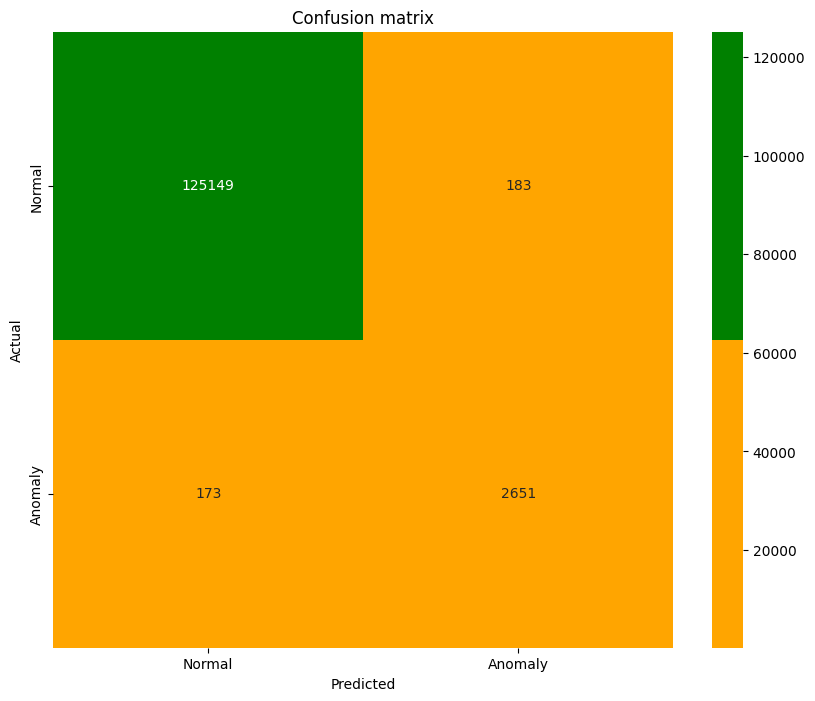

In [ ]:
viz.draw_confusion_matrix(Y_test, predictionsRF.round())

In [ ]:
#file 2
predictionsRF = modelRF.predict(nb15_2[high_corr])# Calculate the absolute errors

print("Recall",sklearn.metrics.recall_score(nb15_2['Label'], predictionsRF.round()))
print("Precision",sklearn.metrics.precision_score(nb15_2['Label'], predictionsRF.round()))
print("F1 score", sklearn.metrics.f1_score(nb15_2['Label'], predictionsRF.round()))
print("ROC: ", roc_auc_score(nb15_2['Label'], predictionsRF.round()))

Recall 0.9887640449438202
Precision 0.8073394495412844
F1 score 0.8888888888888888
ROC:  0.994300769682876


In [ ]:
# file 3
predictionsRF = modelRF.predict(nb15_3[high_corr])# Calculate the absolute errors

print("Recall",sklearn.metrics.recall_score(nb15_3['Label'], predictionsRF.round()))
print("Precision",sklearn.metrics.precision_score(nb15_3['Label'], predictionsRF.round()))
print("F1 score", sklearn.metrics.f1_score(nb15_3['Label'], predictionsRF.round()))
print("ROC: ", roc_auc_score(nb15_3['Label'], predictionsRF.round()))

Recall 0.9336438607208308
Precision 0.7376178889581532
F1 score 0.8241347158407943
ROC:  0.9518541647422265


In [ ]:
#file 4
predictionsRF = modelRF.predict(nb15_4[high_corr])# Calculate the absolute errors

print("Recall",sklearn.metrics.recall_score(nb15_4['Label'], predictionsRF.round()))
print("Precision",sklearn.metrics.precision_score(nb15_4['Label'], predictionsRF.round()))
print("F1 score", sklearn.metrics.f1_score(nb15_4['Label'], predictionsRF.round()))
print("ROC: ", roc_auc_score(nb15_4['Label'], predictionsRF.round()))

Recall 0.9485291206398226
Precision 0.7465100336532469
F1 score 0.8354810022842595
ROC:  0.9598132311884477


##Isolation forest

In [ ]:
from sklearn.ensemble import IsolationForest

In [ ]:
#grid search

estim = [20,50,75,100,150,200, 1000] #all score the same recall

for i in estim:
  modelIF = IsolationForest(random_state = 42, n_estimators = i)
  modelIF.fit(X_train[high_corr])
  predictionsIF = modelIF.predict(X_test[high_corr])
  predictionsIF[predictionsIF == 1] = 0
  predictionsIF[predictionsIF == -1] = 1
  print("Trees:", i)
  print("Recall:", sklearn.metrics.recall_score(Y_test, predictionsIF.round()))
  print("Precision:", sklearn.metrics.precision_score(Y_test, predictionsIF.round()))
  print("F1 score:", sklearn.metrics.f1_score(Y_test, predictionsIF.round()))
  print("ROC:", roc_auc_score(Y_test, predictionsIF))
  print()

Trees: 20
Recall: 1.0
Precision: 0.5062746504123342
F1 score: 0.6722208997857654
ROC: 0.9890131809912872

Trees: 50
Recall: 1.0
Precision: 0.5333333333333333
F1 score: 0.6956521739130436
ROC: 0.9901421823636422

Trees: 75
Recall: 1.0
Precision: 0.5500584339696143
F1 score: 0.709726061824579
ROC: 0.9907844764306003

Trees: 100
Recall: 1.0
Precision: 0.5432858791843016
F1 score: 0.7040638244826726
ROC: 0.9905291545654741

Trees: 150
Recall: 1.0
Precision: 0.5375975632971636
F1 score: 0.6992695307663738
ROC: 0.9903097373376313

Trees: 200
Recall: 1.0
Precision: 0.5402716663478094
F1 score: 0.7015277605266426
ROC: 0.9904134618453388

Trees: 1000
Recall: 1.0
Precision: 0.5498442367601246
F1 score: 0.7095477386934673
ROC: 0.9907764976223151



###Define model


In [ ]:
modelIF = IsolationForest(random_state = 42, n_estimators = 1000)
modelIF.fit(X_train[high_corr])

IsolationForest(n_estimators=1000, random_state=42)

In [ ]:
predictionsIF = modelIF.predict(X_test[high_corr]) # -1 for outliers, 1 for inliers
predictionsIF[predictionsIF == 1] = 0
predictionsIF[predictionsIF == -1] = 1


###Evaluation

In [ ]:
print("Recall",sklearn.metrics.recall_score(Y_test, predictionsIF.round()))
print("Precision",sklearn.metrics.precision_score(Y_test, predictionsIF.round()))
print("F1 score", sklearn.metrics.f1_score(Y_test, predictionsIF.round()))
print("ROC: ", roc_auc_score(Y_test, predictionsIF.round()))

Recall 1.0
Precision 0.5498442367601246
F1 score 0.7095477386934673
ROC:  0.9907764976223151


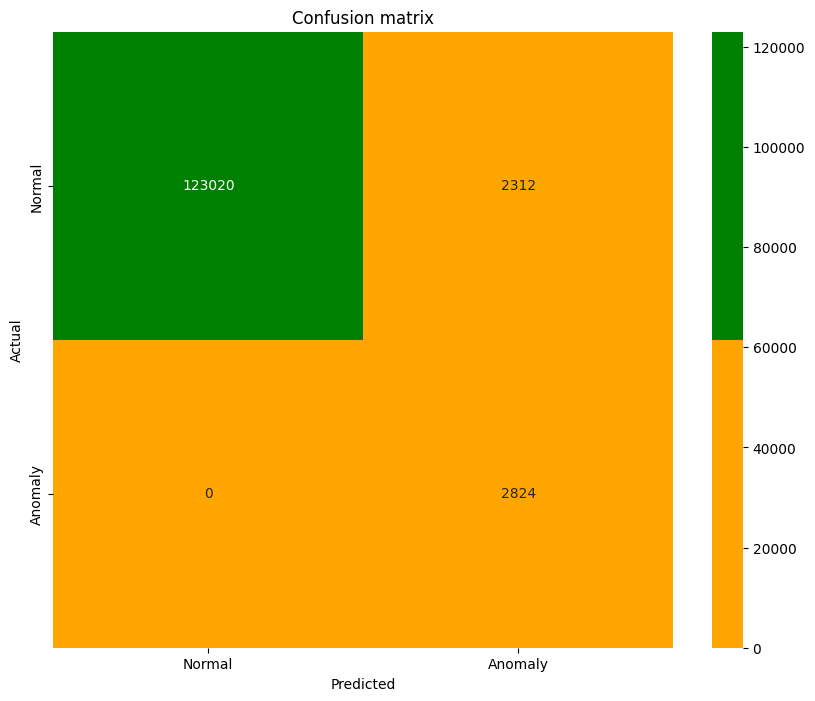

In [ ]:
viz.draw_confusion_matrix(Y_test, predictionsIF.round())

Recall 1.0
Precision 0.0017722375993150003
F1 score 0.00353820465929872
ROC:  0.80603798503401


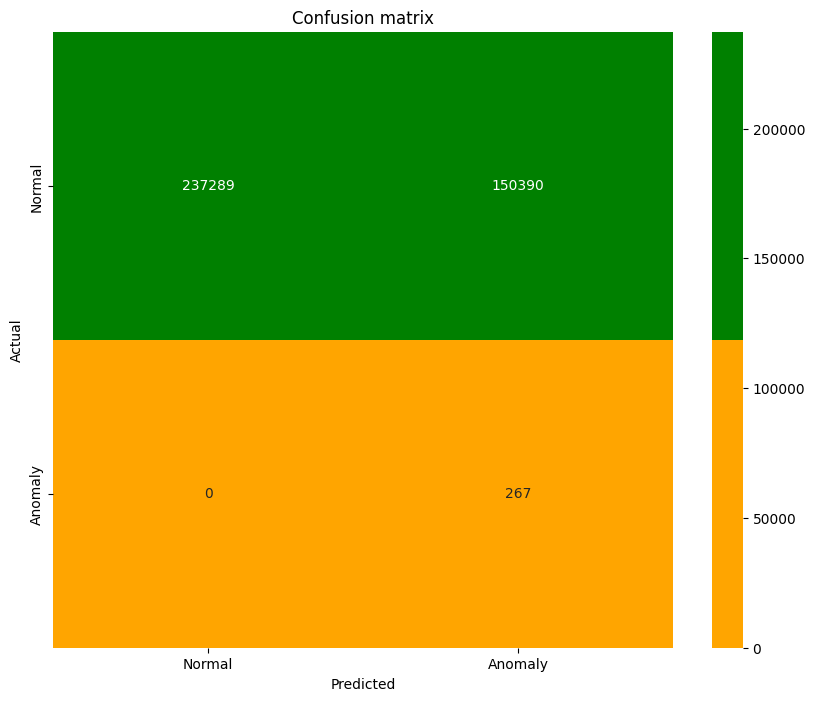

In [ ]:
#file 2

predictionsIF = modelIF.predict(nb15_2[high_corr]) # -1 for outliers, 1 for inliers
predictionsIF[predictionsIF == 1] = 0
predictionsIF[predictionsIF == -1] = 1

print("Recall",sklearn.metrics.recall_score(nb15_2['Label'], predictionsIF.round()))
print("Precision",sklearn.metrics.precision_score(nb15_2['Label'], predictionsIF.round()))
print("F1 score", sklearn.metrics.f1_score(nb15_2['Label'], predictionsIF.round()))
print("ROC: ", roc_auc_score(nb15_2['Label'], predictionsIF.round()))

viz.draw_confusion_matrix(nb15_2['Label'], predictionsIF.round())

In [ ]:
# file 3
predictionsIF = modelIF.predict(nb15_3[high_corr]) # -1 for outliers, 1 for inliers
predictionsIF[predictionsIF == 1] = 0
predictionsIF[predictionsIF == -1] = 1
# errorsRF = abs(predictionsRF - Y_test)# Print out the mean absolute error (mae)
# print('Mean Absolute Error:', round(np.mean(errorsRF), 2), 'degrees.')#Mean Absolute Error: 3.83 degrees.
print("Recall",sklearn.metrics.recall_score(nb15_3['Label'], predictionsIF.round()))
print("Precision",sklearn.metrics.precision_score(nb15_3['Label'], predictionsIF.round()))
print("F1 score", sklearn.metrics.f1_score(nb15_3['Label'], predictionsIF.round()))
print("ROC: ", roc_auc_score(nb15_3['Label'], predictionsIF.round()))

Recall 1.0
Precision 0.5996977699082625
F1 score 0.7497638381313156
ROC:  0.9699164888613577


In [ ]:
#file 4
predictionsIF = modelIF.predict(nb15_4[high_corr]) # -1 for outliers, 1 for inliers
predictionsIF[predictionsIF == 1] = 0
predictionsIF[predictionsIF == -1] = 1

print("Recall",sklearn.metrics.recall_score(nb15_4['Label'], predictionsIF.round()))
print("Precision",sklearn.metrics.precision_score(nb15_4['Label'], predictionsIF.round()))
print("F1 score", sklearn.metrics.f1_score(nb15_4['Label'], predictionsIF.round()))
print("ROC: ", roc_auc_score(nb15_4['Label'], predictionsIF.round()))

Recall 1.0
Precision 0.6147349462103879
F1 score 0.7614066291846917
ROC:  0.9718807512204134


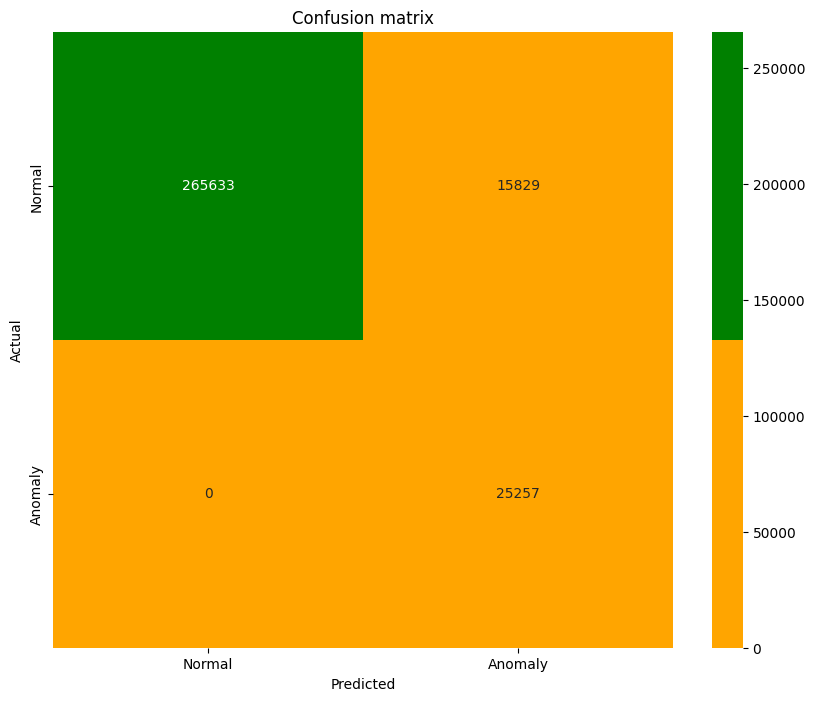

In [ ]:
viz.draw_confusion_matrix(nb15_4['Label'], predictionsIF.round())

##One-class SVM

In [ ]:
from sklearn.svm import OneClassSVM

In [ ]:
#optmisation
kernels = ["linear", "poly", "rbf", "sigmoid"]

for k in kernels:
  svm = OneClassSVM(kernel = k).fit(X_train[high_corr].iloc[:50000])
  predictionsSVM = svm.predict(X_test[high_corr].iloc[:50000])

###Define model

In [ ]:
svm = OneClassSVM()

In [ ]:
svm.fit(X_train[high_corr].iloc[:100000]) #5000 takes 3", 10k takes 10", 20k takes 44" //// 24 mins for 100k
# predictionsSVM = svm.predict(X_test[high_corr].iloc[:75000]) ##1k takes 1", 5k takes 9", 10k takes 12" /// Returns -1 for outliers and 1 for inliers
# predictionsSVM[predictionsSVM == 1] = 0
# predictionsSVM[predictionsSVM == -1] = 1
# print("Recall:", recall(Y_test[:75000], predictionsSVM))
# print("Precision:", precision(Y_test[:75000], predictionsSVM))
# print("F1 score:", f1_score(Y_test[:75000], predictionsSVM))
# print("ROC:", roc_auc_score(Y_test[:75000], predictionsSVM))

OneClassSVM()

In [ ]:
predictionsSVM = svm.predict(X_test[high_corr].iloc[:75000])

In [ ]:
predictionsSVM[predictionsSVM == 1] = 0
predictionsSVM[predictionsSVM == -1] = 1

###Evaluation

In [ ]:
print("Recall:", sklearn.metrics.recall_score(Y_test[:75000], predictionsSVM))
print("Precision:", sklearn.metrics.precision_score(Y_test[:75000], predictionsSVM))
print("F1 score:", sklearn.metrics.f1_score(Y_test[:75000], predictionsSVM))
print("ROC:", roc_auc_score(Y_test[:75000], predictionsSVM))

Recall: 1.0
Precision: 0.04264128055694734
F1 score: 0.0817947291213516
ROC: 0.7526402572802965


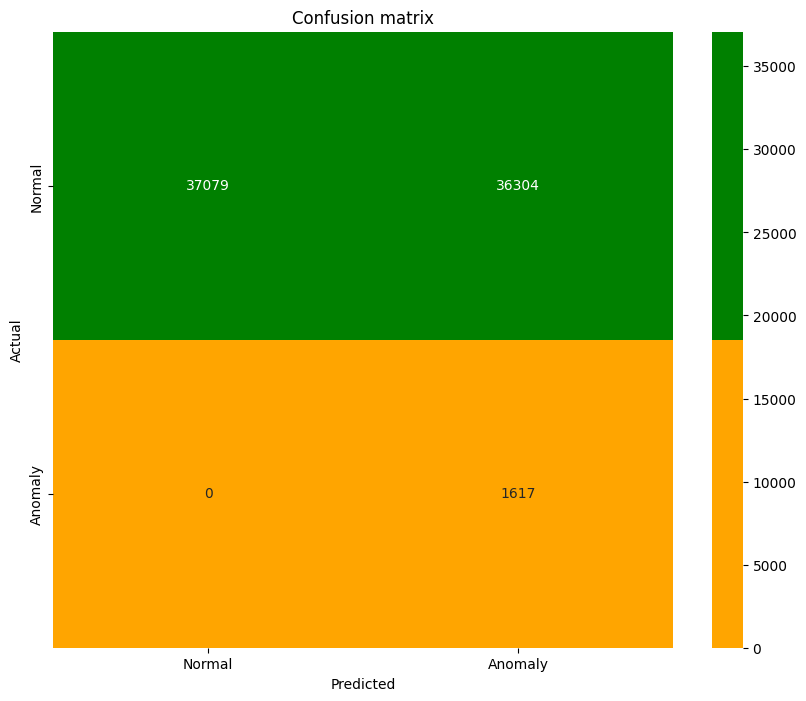

In [ ]:
viz.draw_confusion_matrix(Y_test[:75000], predictionsSVM)

In [ ]:
#file 2
predictionsSVM = svm.predict(nb15_2[high_corr].iloc[:75000]) ##1k takes 1", 5k takes 9", 10k takes 12" /// Returns -1 for outliers and 1 for inliers ///20 mins
predictionsSVM[predictionsSVM == 1] = 0
predictionsSVM[predictionsSVM == -1] = 1

print("Recall:", sklearn.metrics.recall_score(nb15_2['Label'].iloc[:75000], predictionsSVM))
print("Precision:", sklearn.metrics.precision_score(nb15_2['Label'].iloc[:75000], predictionsSVM))
print("F1 score:", sklearn.metrics.f1_score(nb15_2['Label'].iloc[:75000], predictionsSVM))
print("ROC:", roc_auc_score(nb15_2['Label'].iloc[:75000], predictionsSVM))

Recall: 0.0
Precision: 0.0
F1 score: 0.0


Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.


ValueError: ignored

In [ ]:
#file3
predictionsSVM = svm.predict(nb15_3[high_corr].iloc[:75000]) ##1k takes 1", 5k takes 9", 10k takes 12" /// Returns -1 for outliers and 1 for inliers
predictionsSVM[predictionsSVM == 1] = 0
predictionsSVM[predictionsSVM == -1] = 1

print("Recall:", sklearn.metrics.recall_score(nb15_3['Label'].iloc[:75000], predictionsSVM))
print("Precision:", sklearn.metrics.precision_score(nb15_3['Label'].iloc[:75000], predictionsSVM))
print("F1 score:", sklearn.metrics.f1_score(nb15_3['Label'].iloc[:75000], predictionsSVM))
print("ROC:", roc_auc_score(nb15_3['Label'].iloc[:75000], predictionsSVM))

Recall: 1.0
Precision: 0.13781765040188357
F1 score: 0.24224909914731171
ROC: 0.6886233690074769


In [ ]:
viz.draw_confusion_matrix(nb15_3[:75000], predictionsSVM)

ValueError: ignored

In [ ]:
# file 4
predictionsSVM = svm.predict(nb15_4[high_corr].iloc[:75000]) ##1k takes 1", 5k takes 9", 10k takes 12" /// Returns -1 for outliers and 1 for inliers
predictionsSVM[predictionsSVM == 1] = 0
predictionsSVM[predictionsSVM == -1] = 1
print("Recall:", sklearn.metrics.recall_score(nb15_4['Label'].iloc[:75000], predictionsSVM))
print("Precision:", sklearn.metrics.precision_score(nb15_4['Label'].iloc[:75000], predictionsSVM))
print("F1 score:", sklearn.metrics.f1_score(nb15_4['Label'].iloc[:75000], predictionsSVM))
print("ROC:", roc_auc_score(nb15_4['Label'].iloc[:75000], predictionsSVM))

Recall: 1.0
Precision: 0.13443775315574033
F1 score: 0.23701212831072654
ROC: 0.7061707916830358


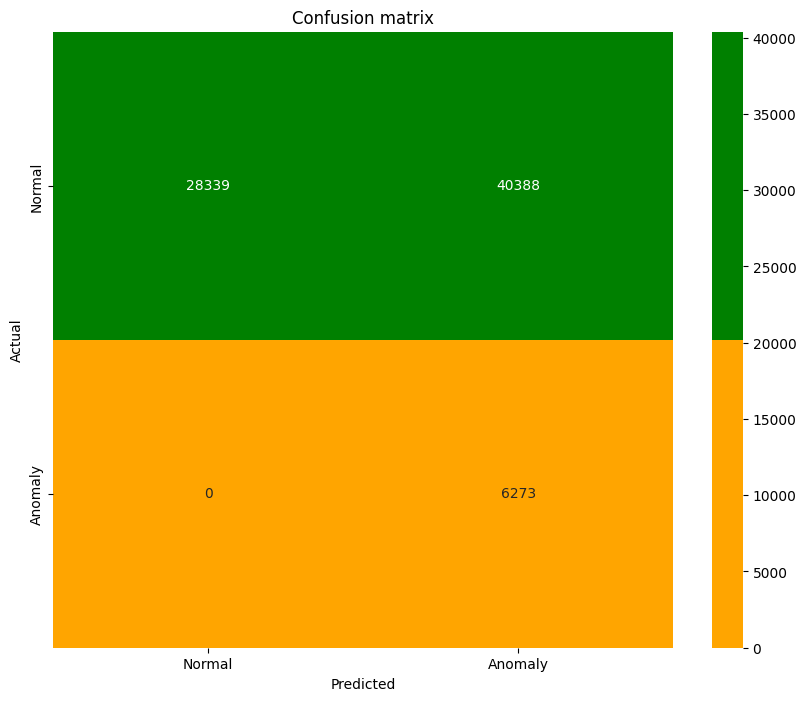

In [ ]:
viz.draw_confusion_matrix(nb15_4['Label'].iloc[:75000], predictionsSVM)

##Logistic Regression

In [ ]:
from sklearn import linear_model

In [ ]:
# newton-cholesky best performing with l2
# optimisation
pen = ["l2"]
optim = ["lbfgs", "newton-cg", "newton-cholesky", "sag", "saga"]

for i in optim:
  for j in pen:
    logi = linear_model.LogisticRegression(penalty = j, solver = i, max_iter = 100000)
    logi.fit(X_train[high_corr],Y_train)
    predictedLOGI = logi.predict(X_test[high_corr])
    print("Optimiser", i, "with penalty", j)
    print("Recall:", recall(Y_test, predictedLOGI))
    print("Precision:", precision(Y_test, predictedLOGI))
    print("F1 score:", f1_score(Y_test, predictedLOGI))
    print("ROC:", roc_auc_score(Y_test, predictedLOGI))
    print()

pen = [None]
optim = ["lbfgs", "newton-cholesky", "sag", "saga"]

for i in optim:
  for j in pen:
    logi = linear_model.LogisticRegression(penalty = j, solver = i, max_iter = 100000)
    logi.fit(X_train[high_corr],Y_train)
    predictedLOGI = logi.predict(X_test[high_corr])
    print("Optimiser", i, "with penalty", j)
    print("Recall:", recall(Y_test, predictedLOGI))
    print("Precision:", precision(Y_test, predictedLOGI))
    print("F1 score:", f1_score(Y_test, predictedLOGI))
    print("ROC:", roc_auc_score(Y_test, predictedLOGI))
    print()

Optimiser lbfgs with penalty l2
Recall: 0.9944946222832157
Precision: 0.9993906252505653
F1 score: 0.9969366126774645
ROC: 0.9837912204900499

Optimiser newton-cg with penalty l2
Recall: 0.9944946222832157
Precision: 0.9993906252505653
F1 score: 0.9969366126774645
ROC: 0.9837912204900499

Optimiser newton-cholesky with penalty l2
Recall: 0.9945105798997862
Precision: 0.999398648161066
F1 score: 0.9969486224810139
ROC: 0.9839762531226977

Optimiser sag with penalty l2
Recall: 0.9944946222832157
Precision: 0.9993906252505653
F1 score: 0.9969366126774645
ROC: 0.9837912204900499

Optimiser saga with penalty l2
Recall: 0.9944946222832157
Precision: 0.9993906252505653
F1 score: 0.9969366126774645
ROC: 0.9837912204900499



###Define model

In [ ]:
logi = linear_model.LogisticRegression(penalty = "l2", solver = "newton-cholesky")
logi.fit(X_train[high_corr],Y_train)
predictedLOGI = logi.predict(X_test[high_corr])

###Evaluation

In [ ]:
print("Recall",sklearn.metrics.recall_score(Y_test, predictedLOGI))
print("Precision",sklearn.metrics.precision_score(Y_test, predictedLOGI))
print("F1 score", sklearn.metrics.f1_score(Y_test, predictedLOGI))
print("ROC: ", roc_auc_score(Y_test, predictedLOGI))

Recall 0.9734419263456091
Precision 0.7998254291533314
F1 score 0.8781344833093754
ROC:  0.9839762531226977


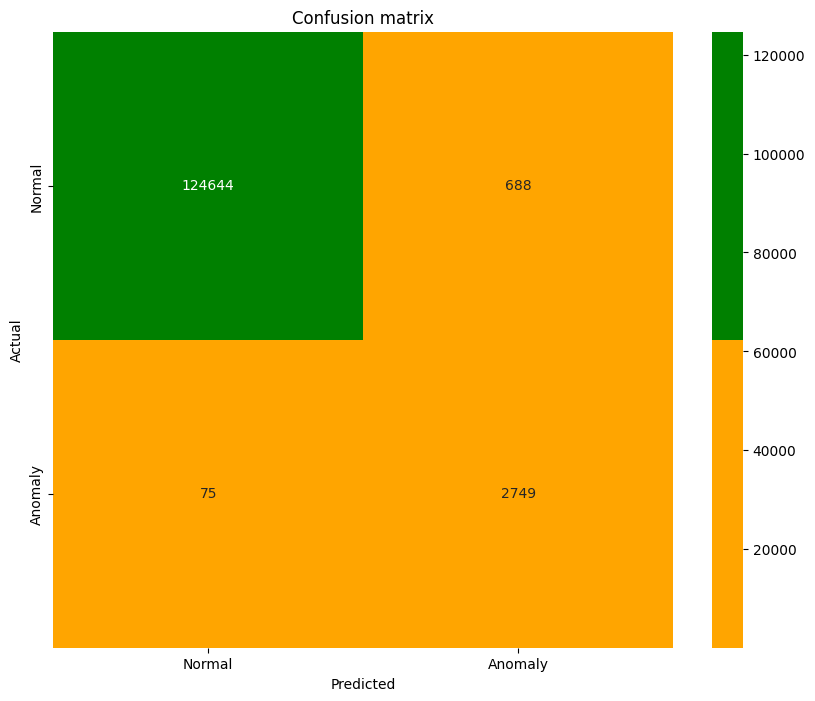

In [ ]:
viz.draw_confusion_matrix(Y_test, predictedLOGI)

Recall 0.11610486891385768
Precision 0.96875
F1 score 0.20735785953177258
ROC:  0.5580511447301187


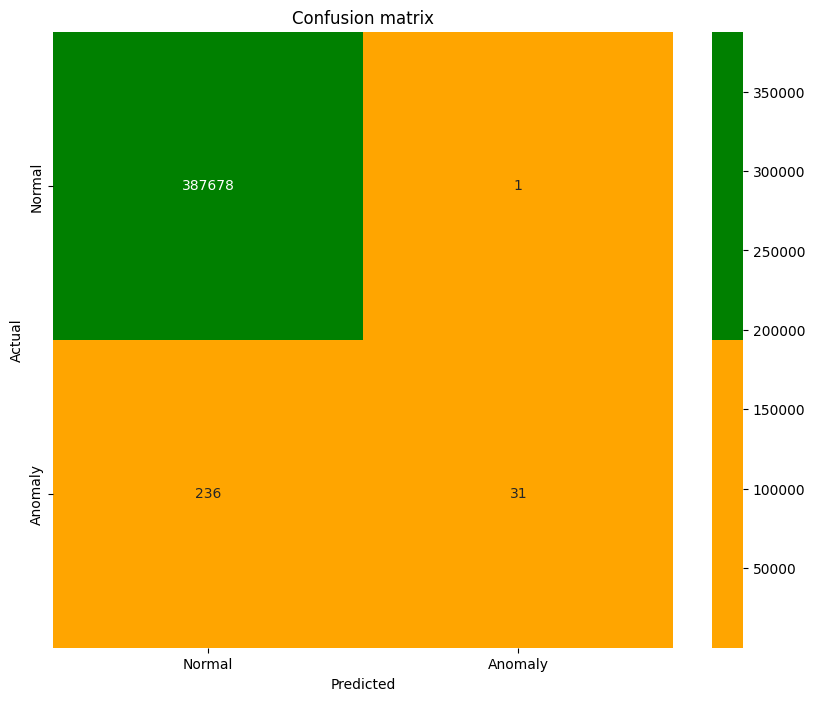

In [ ]:
# file 2

predictedLOGI = logi.predict(nb15_2[high_corr])
print("Recall",sklearn.metrics.recall_score(nb15_2['Label'], predictedLOGI))
print("Precision",sklearn.metrics.precision_score(nb15_2['Label'], predictedLOGI))
print("F1 score", sklearn.metrics.f1_score(nb15_2['Label'], predictedLOGI))
print("ROC: ", roc_auc_score(nb15_2['Label'], predictedLOGI))

viz.draw_confusion_matrix(nb15_2['Label'], predictedLOGI)

In [ ]:
# file 3

predictedLOGI = logi.predict(nb15_3[high_corr])
print("Recall",sklearn.metrics.recall_score(nb15_3['Label'], predictedLOGI))
print("Precision",sklearn.metrics.precision_score(nb15_3['Label'], predictedLOGI))
print("F1 score", sklearn.metrics.f1_score(nb15_3['Label'], predictedLOGI))
print("ROC: ", roc_auc_score(nb15_3['Label'], predictedLOGI))

Recall 0.9885715740175117
Precision 0.7542578602916902
F1 score 0.8556636300547472
ROC:  0.9797699910145373


In [ ]:
# file 4
predictedLOGI = logi.predict(nb15_4[high_corr])
print("Recall",sklearn.metrics.recall_score(nb15_4['Label'], predictedLOGI))
print("Precision",sklearn.metrics.precision_score(nb15_4['Label'], predictedLOGI))
print("F1 score", sklearn.metrics.f1_score(nb15_4['Label'], predictedLOGI))
print("ROC: ", roc_auc_score(nb15_4['Label'], predictedLOGI))

Recall 0.990339311873936
Precision 0.7681181673013143
F1 score 0.865187388665018
ROC:  0.981755767028341


##Random forest

##KDD dataset

In [ ]:
kdd_names_df = pd.read_csv('/content/drive/MyDrive/FieldNames.csv', names = ["var", "type"])


In [ ]:
kdd_names = kdd_names_df['var'].to_list() + ['attack', 'level']

In [ ]:
kdd_names_df

,var,type
0,duration,continuous
1,protocol_type,symbolic
2,service,symbolic
3,flag,symbolic
4,src_bytes,continuous
5,dst_bytes,continuous
6,land,continuous
7,wrong_fragment,continuous
8,urgent,continuous
9,hot,continuous


In [ ]:
len(kdd_names)

43

In [ ]:
kdd_train = pd.read_csv('/content/drive/MyDrive/KDDTrain+.txt', names = kdd_names )
kdd_test = pd.read_csv('/content/drive/MyDrive/KDDTest+.txt', names = kdd_names)

In [ ]:
print(kdd_train.columns)
df_original.columns

Index(['duration', 'protocol_type', 'service', 'flag', 'src_bytes',
       'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'num_outbound_cmds', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate',
       'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
       'dst_host_srv_count', 'dst_host_same_srv_rate',
       'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
       'dst_host_srv_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate', 'attack', 'level'],
      dtype='object')


Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'Sload', 'Dload',
       'Spkts', 'Dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'Sjit', 'Djit', 'Stime',
       'Ltime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'Label'],
      dtype='object')

In [ ]:
kdd_train['is_guest_login'].unique()

array([0, 1])